## Assignment 3: Generative Model

# Part I - Generative Adversarial Networks (GANs)
So far in DS6050, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__.
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661).

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


In [1]:
from google.colab import files
uploaded = files.upload()

Saving gan-checks-tf.npz to gan-checks-tf.npz


## Setup

In [19]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy.


**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1].

In [3]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data

        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B))

11490434/11490434 [==============================] - 0s 0us/step


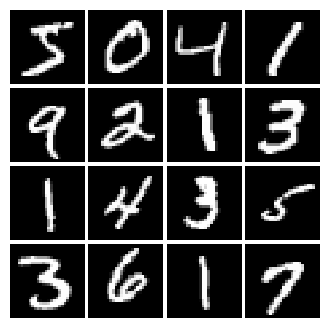

In [4]:
# show a batch
mnist = MNIST(batch_size=16)
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [5]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.

    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU

    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, alpha * x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [6]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [7]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.

    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate

    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    noise = tf.random.uniform((batch_size, dim), minval = -1, maxval = 1)
    return noise

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [8]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")

test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1

The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [9]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # Fully connected layer with input size 784 and output size 256
        tf.keras.layers.Dense(256, input_shape = (784,), use_bias = True),
        # LeakyReLU with alpha 0.01
        tf.keras.layers.LeakyReLU(alpha = 0.01),
        # Fully connected layer with output size 256
        tf.keras.layers.Dense(256, use_bias = True),
        # LeakyReLU with alpha 0.01
        tf.keras.layers.LeakyReLU(alpha = 0.01),
        # Fully connected layer with output size 1
        tf.keras.layers.Dense(1, use_bias = True)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [10]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')

test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [11]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # Fully connected layer with input size noise_dim and output size 1024
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), use_bias=True),
        # ReLU
        tf.keras.layers.ReLU(),
        # Fully connected layer with output size 1024
        tf.keras.layers.Dense(1024, use_bias=True),
        # ReLU
        tf.keras.layers.ReLU(),
        # Fully connected layer with output size 784
        tf.keras.layers.Dense(784, use_bias=True),
        # TanH to get outputs in the range [-1,1]
        tf.keras.layers.Activation('tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [12]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')

test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [13]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.

    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    # Labels for the real and fake data
    real_labels = tf.ones_like(logits_real)
    fake_labels = tf.zeros_like(logits_fake)

    # Loss for the discriminator with real data
    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(real_labels, logits_real)
    # Loss for the discriminator with fake data
    fake_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(fake_labels, logits_fake)

    # Combine losses
    loss = real_loss + fake_loss
    return loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    gen_labels = tf.ones_like(logits_fake)

    # Loss for the generator
    loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(gen_labels, logits_fake)
    return loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [14]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [15]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z).

In [16]:
# TODO: create an AdamOptimizer for D_optimizer and G_optimizer
def get_optimizers(learning_rate=1e-3, beta1=0.5):
    """Create optimizer for GAN training.

    Inputs:
    - learning_rate: learning rate to use for both optimizer
    - beta1: beta1 parameter for both optimizer (first moment decay)

    Returns:
    - D_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_optimizer = None
    G_optimizer = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)
    G_optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_optimizer, G_optimizer

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other.

In [17]:
# a giant helper function
def run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_optimizer: an Optimizer for Discriminator
    - G_optimizer: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)

    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)
                D_optimizer.apply_gradients(zip(d_gradients, D.trainable_variables))

            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)
                G_optimizer.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1

    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Instructions for updating:
Use tf.identity with explicit device placement instead.


Epoch: 0, Iter: 0, D: 1.729, G:0.6849


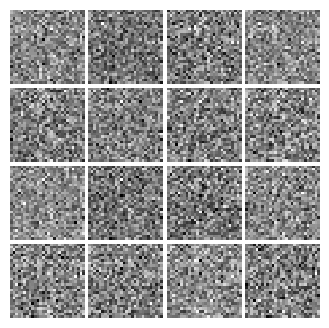

Epoch: 0, Iter: 20, D: 0.5529, G:1.108


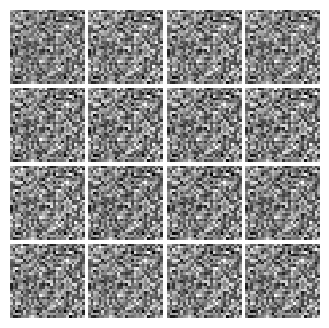

Epoch: 0, Iter: 40, D: 0.5201, G:1.114


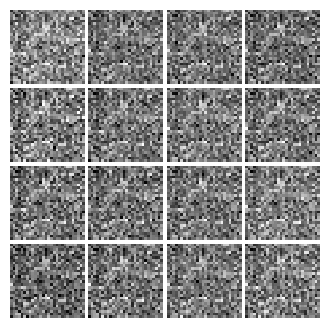

Epoch: 0, Iter: 60, D: 1.033, G:1.935


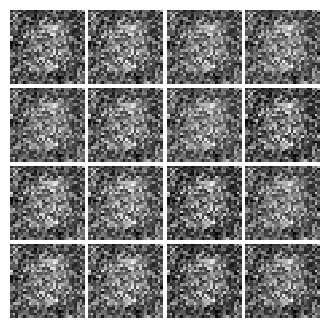

Epoch: 0, Iter: 80, D: 1.465, G:1.896


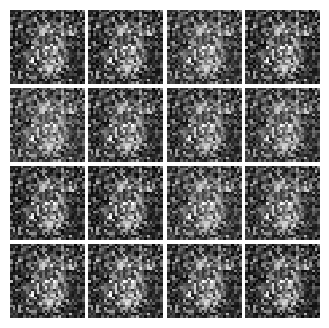

Epoch: 0, Iter: 100, D: 1.452, G:1.131


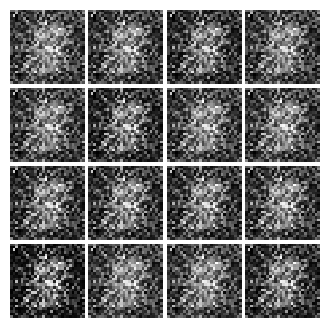

Epoch: 0, Iter: 120, D: 0.9409, G:1.559


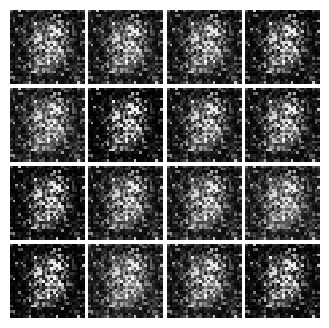

Epoch: 0, Iter: 140, D: 0.7423, G:1.537


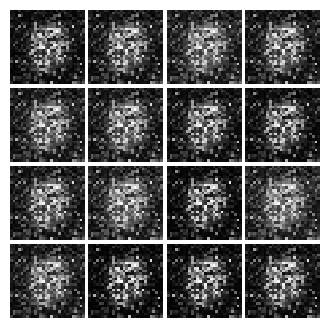

Epoch: 0, Iter: 160, D: 1.125, G:2.238


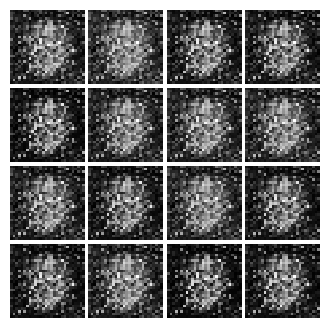

Epoch: 0, Iter: 180, D: 1.476, G:0.8999


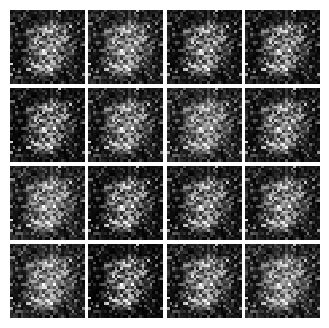

Epoch: 0, Iter: 200, D: 1.294, G:2.157


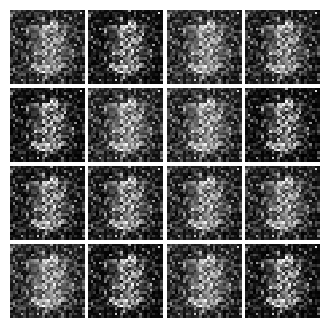

Epoch: 0, Iter: 220, D: 1.523, G:1.088


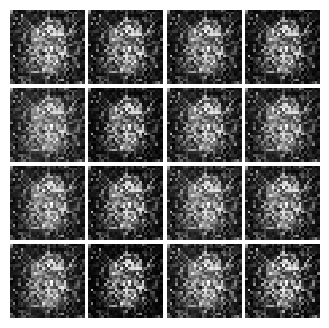

Epoch: 0, Iter: 240, D: 1.113, G:1.497


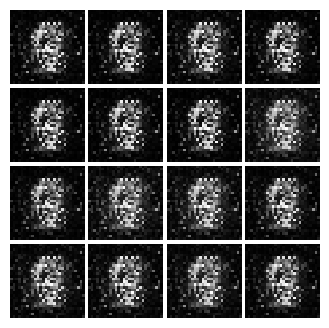

Epoch: 0, Iter: 260, D: 1.312, G:1.091


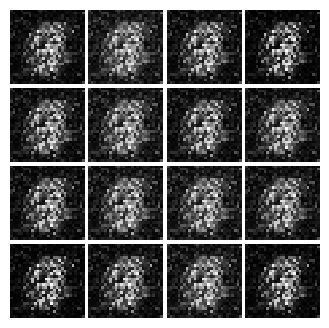

Epoch: 0, Iter: 280, D: 1.313, G:1.014


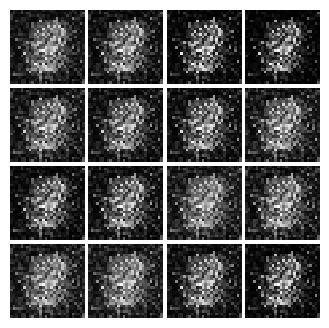

Epoch: 0, Iter: 300, D: 0.9968, G:1.612


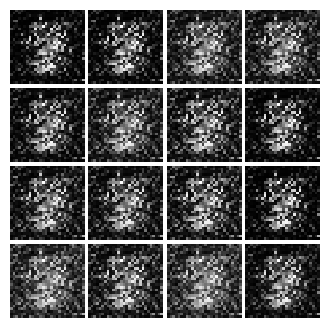

Epoch: 0, Iter: 320, D: 0.7236, G:1.98


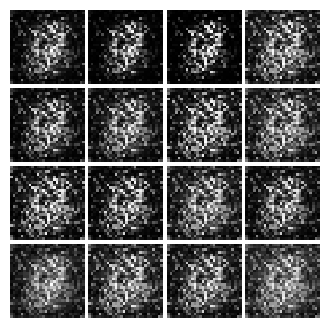

Epoch: 0, Iter: 340, D: 1.173, G:1.107


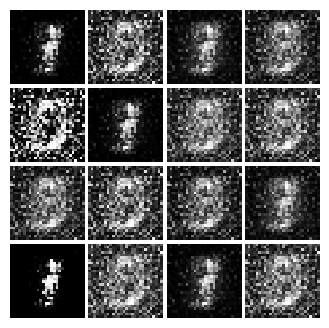

Epoch: 0, Iter: 360, D: 1.165, G:1.302


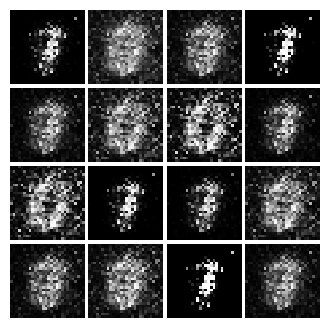

Epoch: 0, Iter: 380, D: 1.169, G:1.474


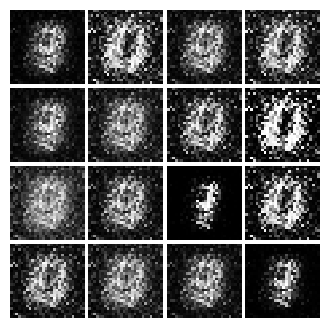

Epoch: 0, Iter: 400, D: 1.04, G:1.437


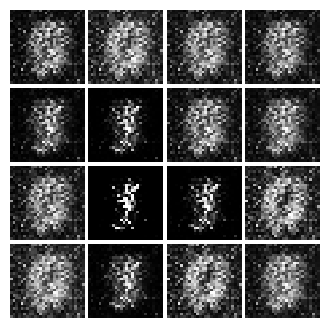

Epoch: 0, Iter: 420, D: 1.029, G:2.392


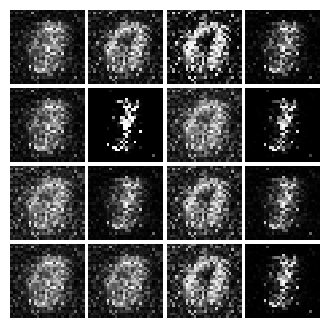

Epoch: 0, Iter: 440, D: 1.295, G:1.146


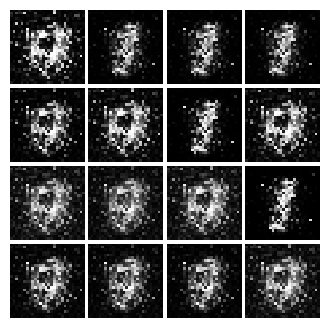

Epoch: 0, Iter: 460, D: 0.8742, G:1.715


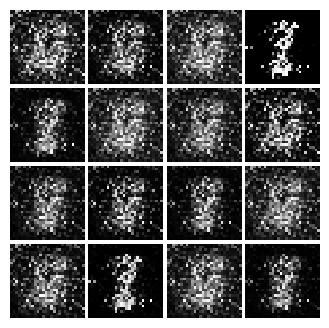

Epoch: 1, Iter: 480, D: 1.244, G:1.194


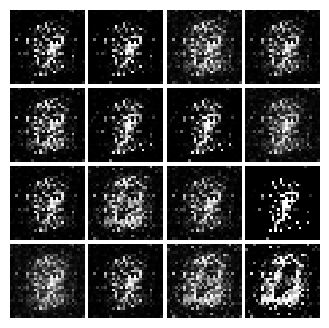

Epoch: 1, Iter: 500, D: 1.147, G:1.252


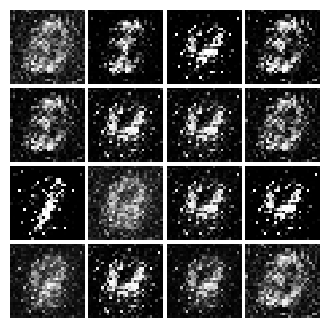

Epoch: 1, Iter: 520, D: 1.093, G:1.487


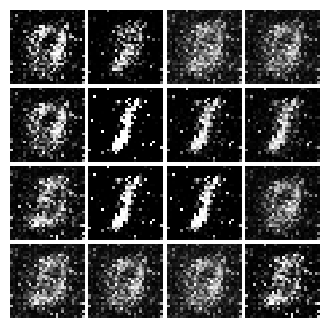

Epoch: 1, Iter: 540, D: 1.237, G:0.9604


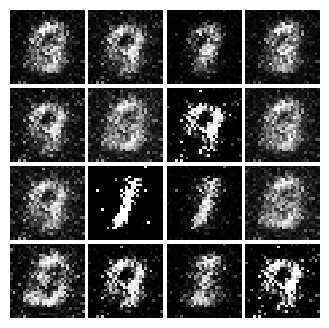

Epoch: 1, Iter: 560, D: 1.116, G:0.4797


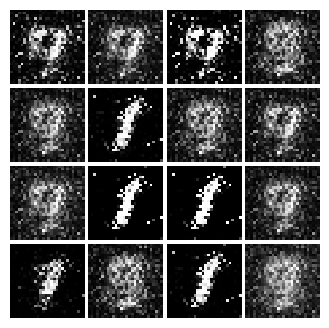

Epoch: 1, Iter: 580, D: 1.127, G:1.797


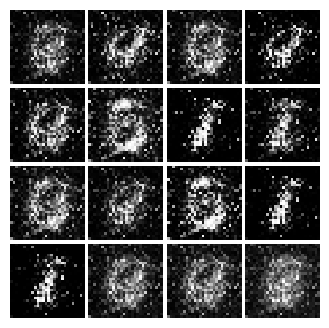

Epoch: 1, Iter: 600, D: 1.052, G:1.101


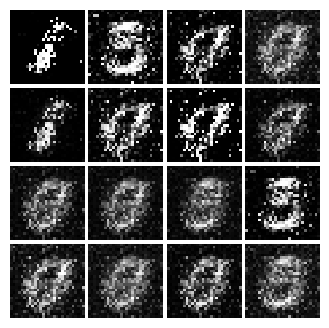

Epoch: 1, Iter: 620, D: 1.519, G:1.267


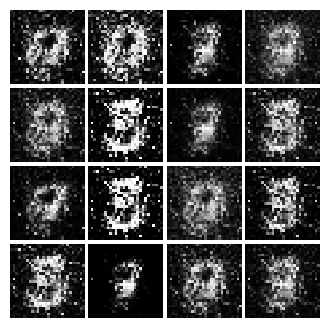

Epoch: 1, Iter: 640, D: 1.228, G:0.7585


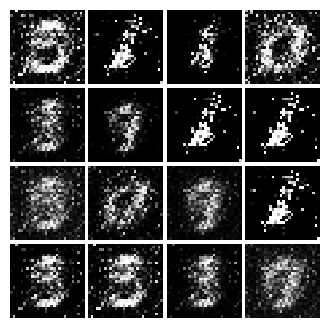

Epoch: 1, Iter: 660, D: 1.135, G:1.702


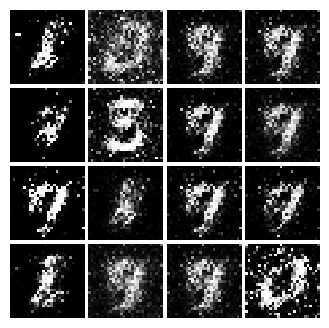

Epoch: 1, Iter: 680, D: 1.151, G:0.8872


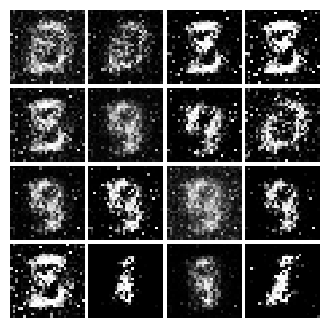

Epoch: 1, Iter: 700, D: 0.9845, G:1.086


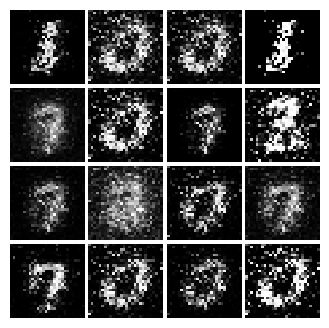

Epoch: 1, Iter: 720, D: 0.8545, G:1.303


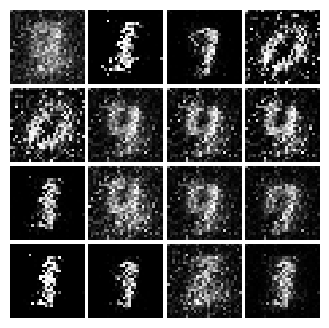

Epoch: 1, Iter: 740, D: 1.041, G:1.267


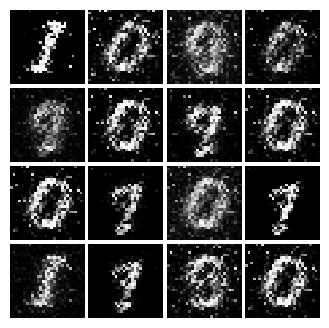

Epoch: 1, Iter: 760, D: 2.849, G:0.7884


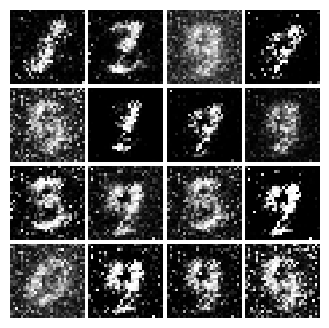

Epoch: 1, Iter: 780, D: 1.01, G:1.171


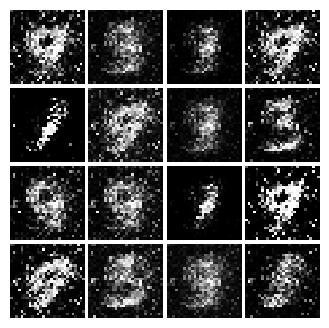

Epoch: 1, Iter: 800, D: 1.261, G:1.98


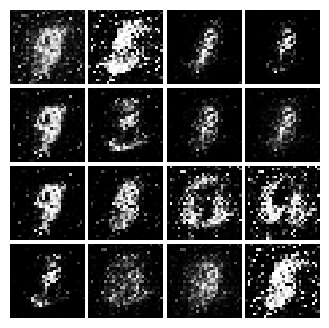

Epoch: 1, Iter: 820, D: 1.424, G:3.06


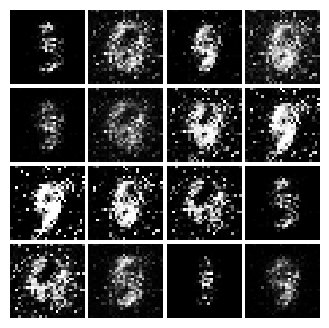

Epoch: 1, Iter: 840, D: 1.083, G:1.568


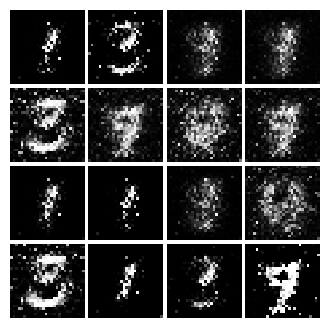

Epoch: 1, Iter: 860, D: 1.058, G:1.296


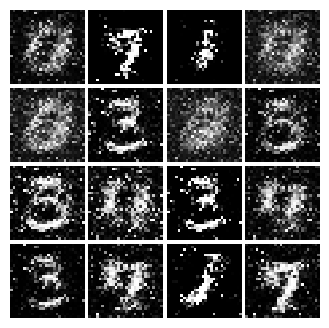

Epoch: 1, Iter: 880, D: 1.231, G:1.167


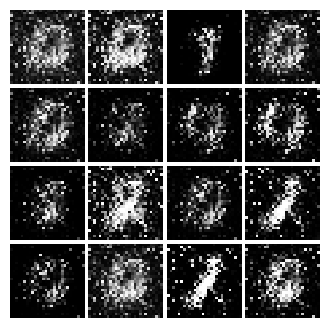

Epoch: 1, Iter: 900, D: 1.066, G:1.107


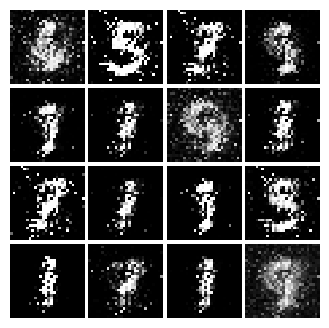

Epoch: 1, Iter: 920, D: 1.314, G:1.58


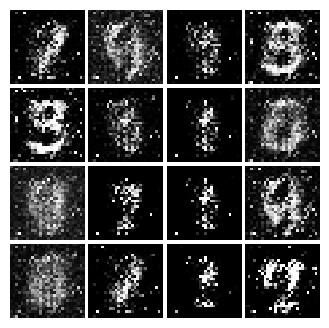

Epoch: 2, Iter: 940, D: 1.147, G:1.443


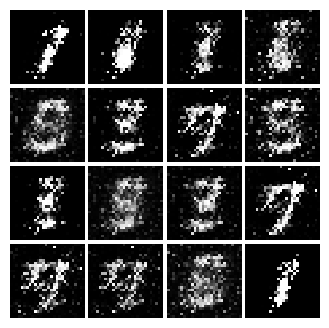

Epoch: 2, Iter: 960, D: 1.223, G:0.9348


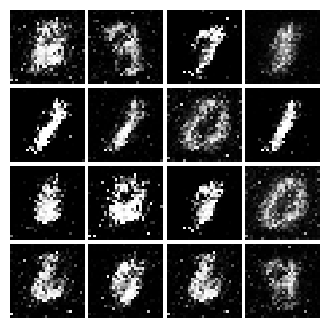

Epoch: 2, Iter: 980, D: 1.215, G:1.154


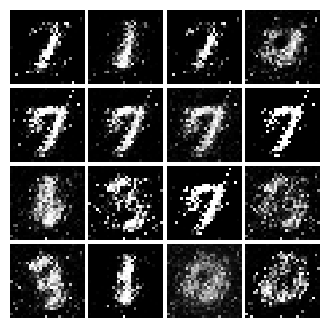

Epoch: 2, Iter: 1000, D: 1.259, G:1.174


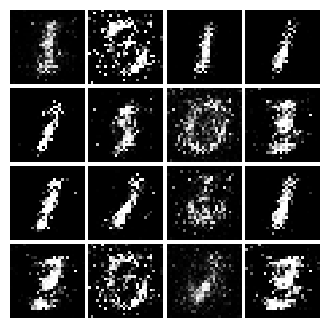

Epoch: 2, Iter: 1020, D: 1.188, G:1.311


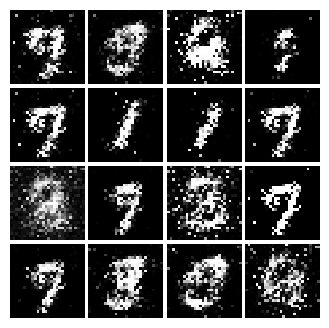

Epoch: 2, Iter: 1040, D: 1.357, G:1.101


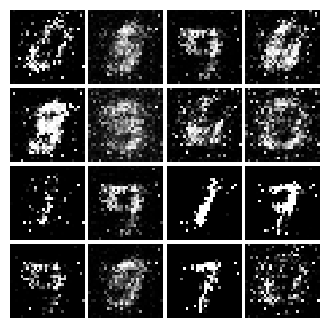

Epoch: 2, Iter: 1060, D: 1.145, G:1.167


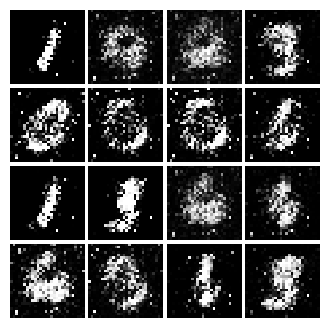

Epoch: 2, Iter: 1080, D: 1.236, G:1.161


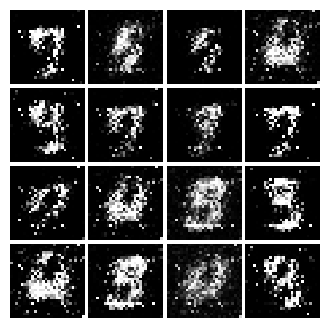

Epoch: 2, Iter: 1100, D: 1.206, G:0.9754


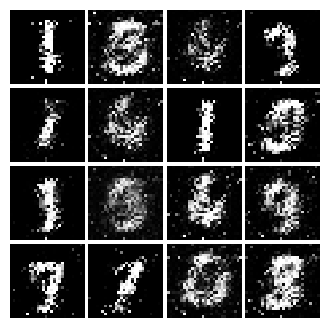

Epoch: 2, Iter: 1120, D: 1.149, G:0.9336


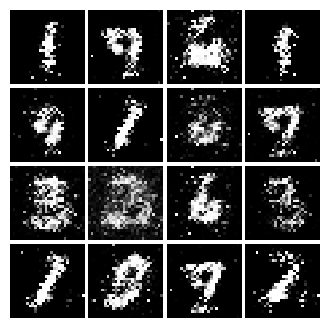

Epoch: 2, Iter: 1140, D: 1.145, G:1.097


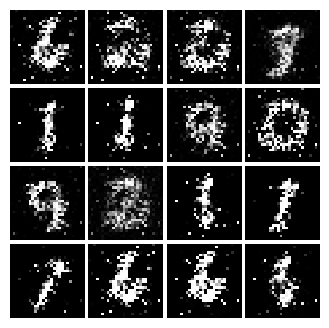

Epoch: 2, Iter: 1160, D: 1.066, G:1.281


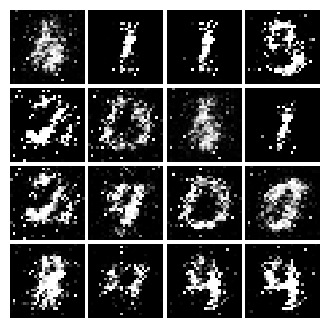

Epoch: 2, Iter: 1180, D: 1.124, G:1.243


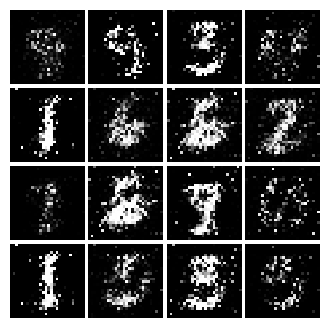

Epoch: 2, Iter: 1200, D: 2.353, G:0.9465


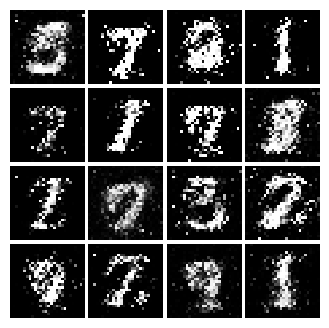

Epoch: 2, Iter: 1220, D: 1.105, G:1.629


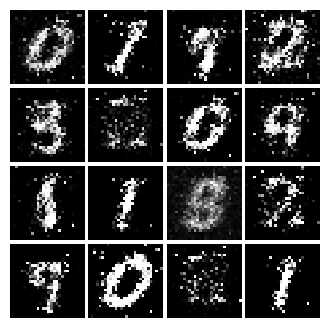

Epoch: 2, Iter: 1240, D: 1.2, G:1.036


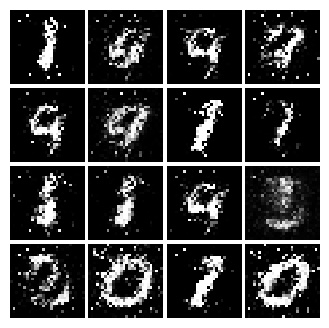

Epoch: 2, Iter: 1260, D: 1.279, G:0.9914


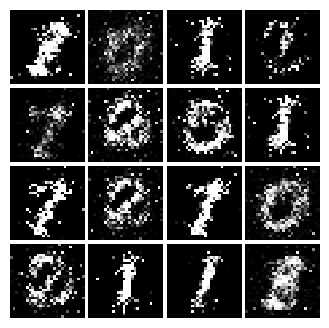

Epoch: 2, Iter: 1280, D: 1.195, G:1.007


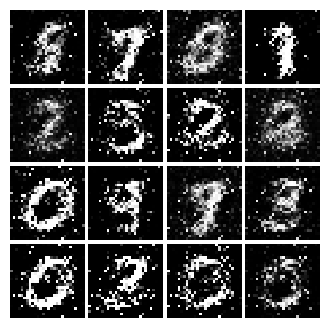

Epoch: 2, Iter: 1300, D: 1.332, G:0.7718


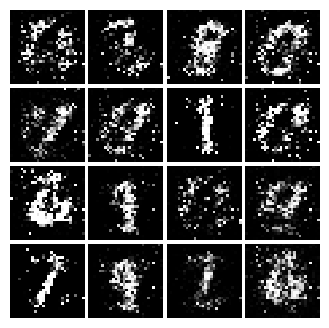

Epoch: 2, Iter: 1320, D: 1.378, G:1.085


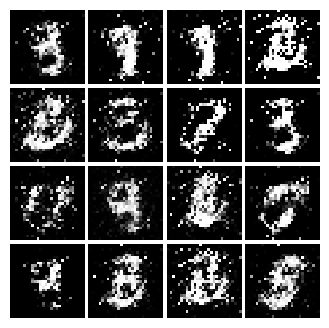

Epoch: 2, Iter: 1340, D: 1.148, G:0.8109


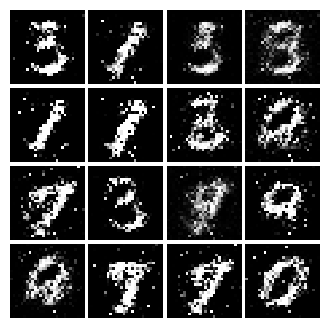

Epoch: 2, Iter: 1360, D: 1.357, G:0.9489


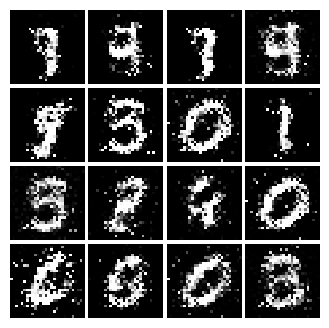

Epoch: 2, Iter: 1380, D: 1.174, G:1.207


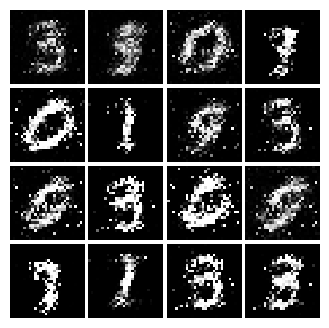

Epoch: 2, Iter: 1400, D: 1.193, G:0.8466


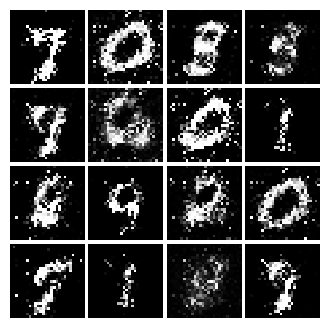

Epoch: 3, Iter: 1420, D: 1.288, G:1.184


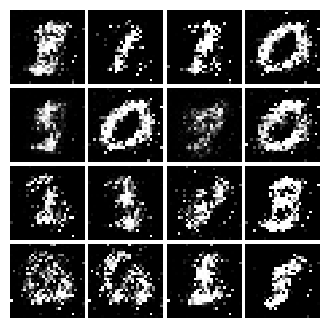

Epoch: 3, Iter: 1440, D: 1.227, G:1.071


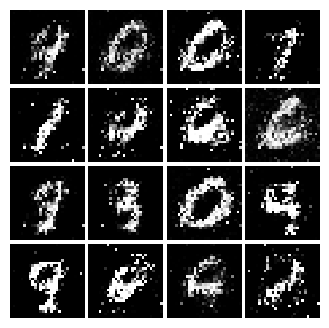

Epoch: 3, Iter: 1460, D: 1.254, G:0.9479


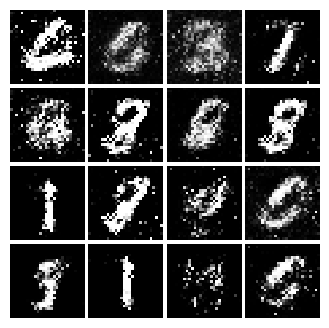

Epoch: 3, Iter: 1480, D: 1.175, G:1.048


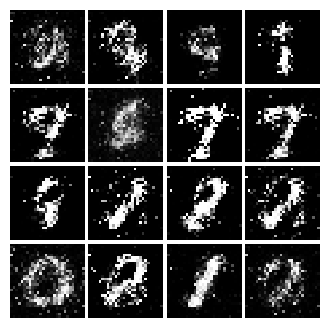

Epoch: 3, Iter: 1500, D: 1.324, G:0.821


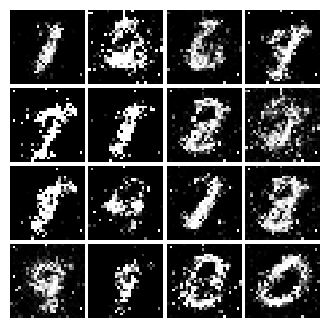

Epoch: 3, Iter: 1520, D: 1.527, G:0.7974


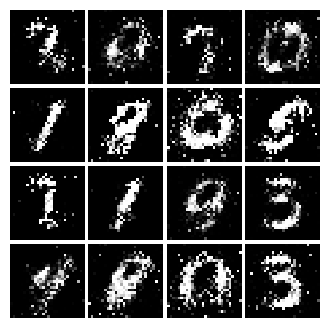

Epoch: 3, Iter: 1540, D: 1.211, G:0.9525


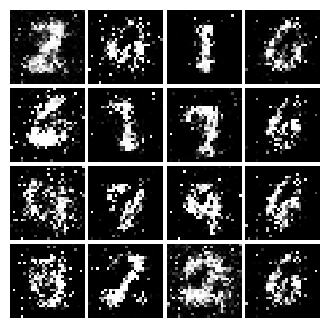

Epoch: 3, Iter: 1560, D: 1.186, G:1.032


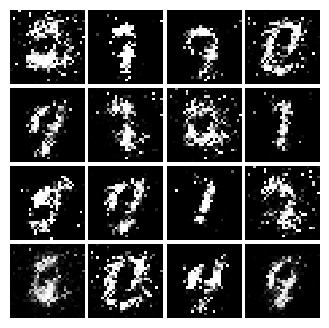

Epoch: 3, Iter: 1580, D: 1.399, G:1.015


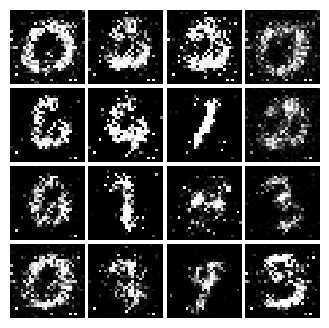

Epoch: 3, Iter: 1600, D: 1.26, G:1.005


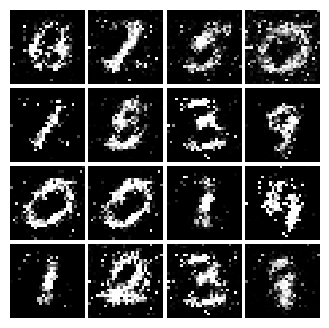

Epoch: 3, Iter: 1620, D: 1.139, G:1.03


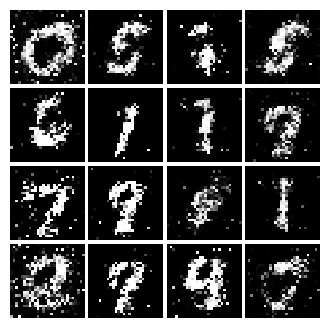

Epoch: 3, Iter: 1640, D: 1.246, G:1.571


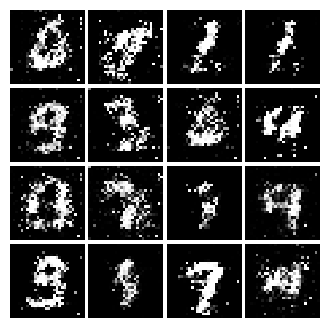

Epoch: 3, Iter: 1660, D: 1.192, G:1.114


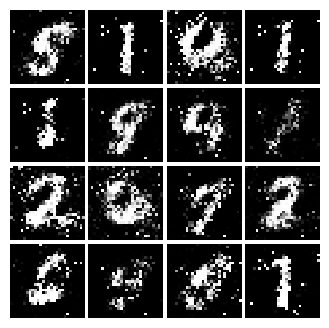

Epoch: 3, Iter: 1680, D: 1.191, G:0.9616


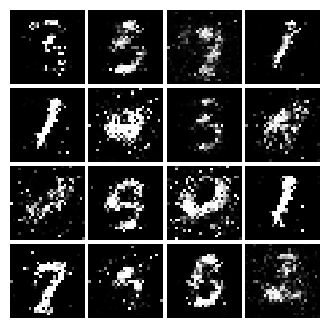

Epoch: 3, Iter: 1700, D: 1.404, G:0.945


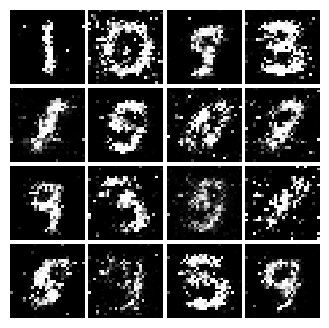

Epoch: 3, Iter: 1720, D: 1.175, G:1.009


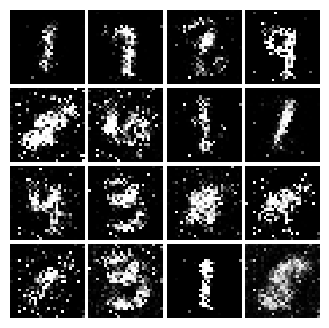

Epoch: 3, Iter: 1740, D: 1.263, G:0.8372


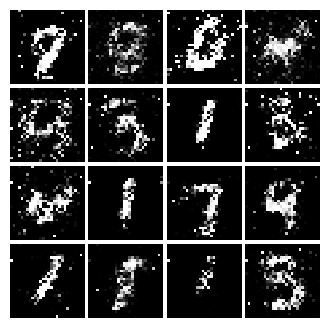

Epoch: 3, Iter: 1760, D: 1.207, G:0.944


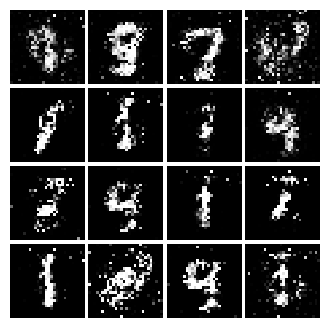

Epoch: 3, Iter: 1780, D: 1.222, G:1.068


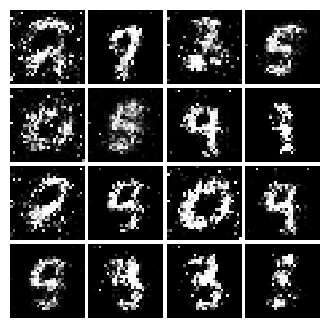

Epoch: 3, Iter: 1800, D: 1.251, G:1.012


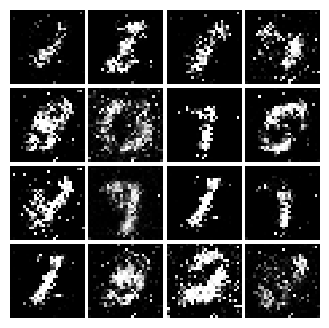

Epoch: 3, Iter: 1820, D: 1.299, G:0.9482


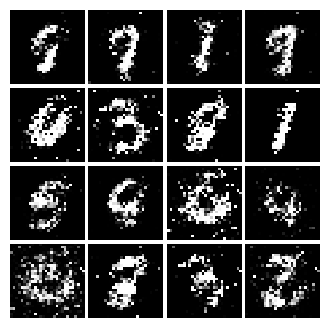

Epoch: 3, Iter: 1840, D: 1.125, G:0.5825


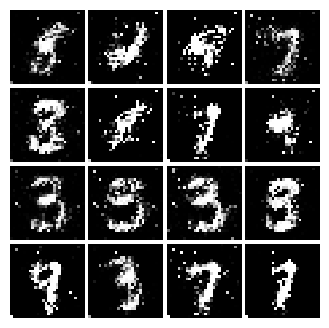

Epoch: 3, Iter: 1860, D: 1.107, G:1.042


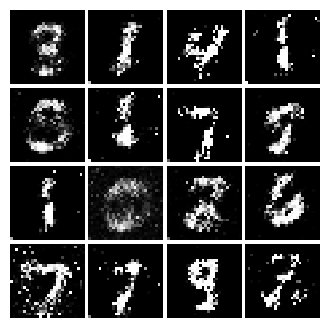

Epoch: 4, Iter: 1880, D: 1.217, G:0.9063


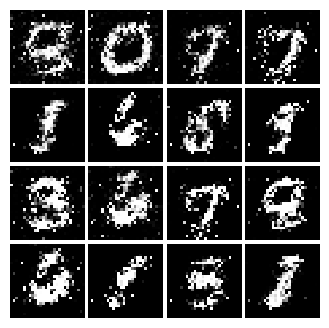

Epoch: 4, Iter: 1900, D: 1.248, G:1.012


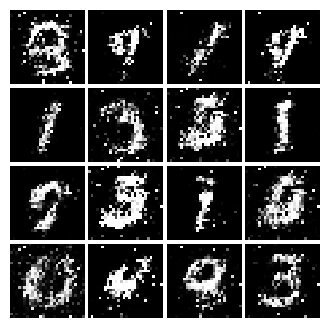

Epoch: 4, Iter: 1920, D: 1.321, G:0.9122


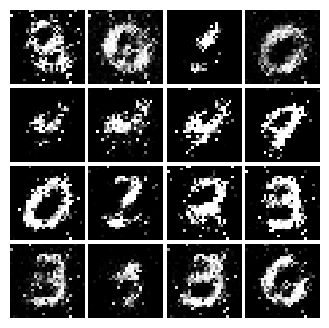

Epoch: 4, Iter: 1940, D: 1.295, G:1.001


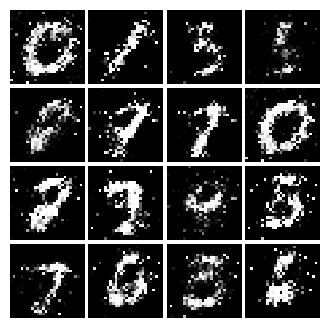

Epoch: 4, Iter: 1960, D: 1.37, G:1.125


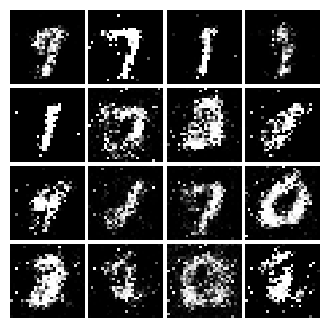

Epoch: 4, Iter: 1980, D: 1.251, G:0.847


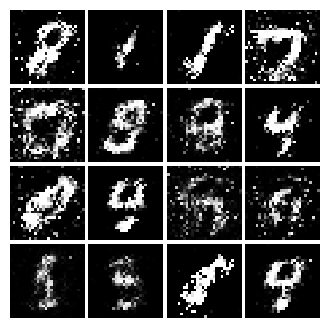

Epoch: 4, Iter: 2000, D: 1.244, G:0.9937


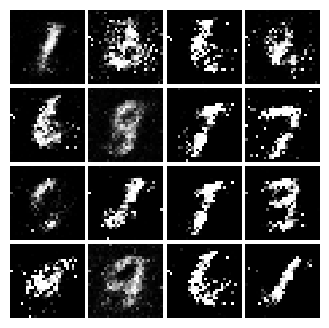

Epoch: 4, Iter: 2020, D: 1.304, G:0.8605


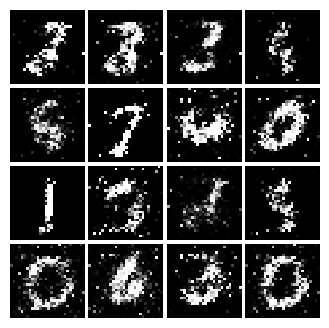

Epoch: 4, Iter: 2040, D: 1.32, G:1.047


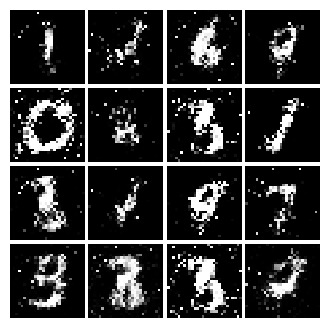

Epoch: 4, Iter: 2060, D: 1.585, G:1.019


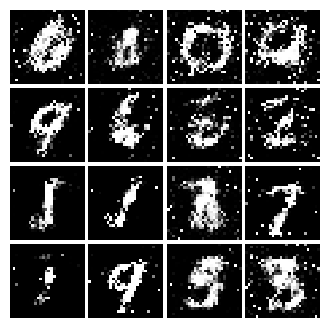

Epoch: 4, Iter: 2080, D: 1.289, G:0.8872


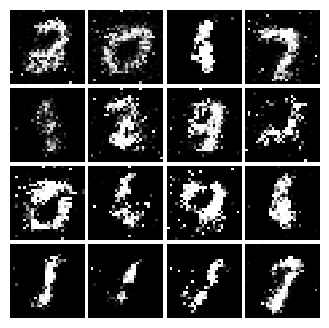

Epoch: 4, Iter: 2100, D: 1.214, G:1.009


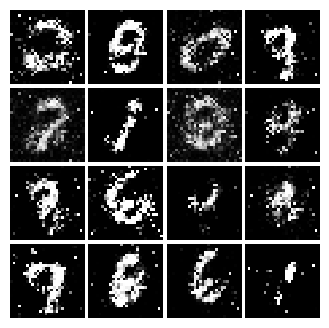

Epoch: 4, Iter: 2120, D: 1.285, G:0.816


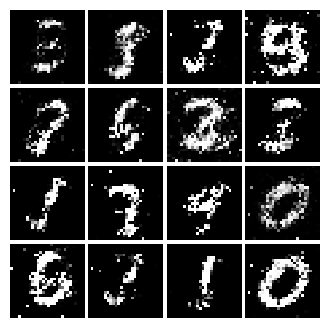

Epoch: 4, Iter: 2140, D: 1.276, G:0.8805


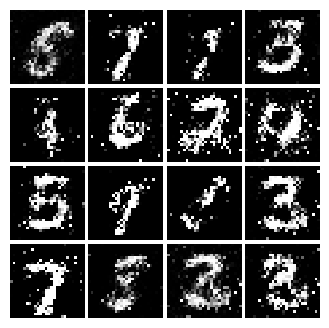

Epoch: 4, Iter: 2160, D: 1.357, G:0.9099


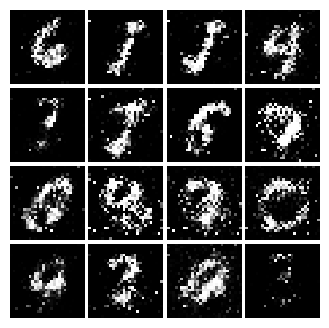

Epoch: 4, Iter: 2180, D: 1.365, G:0.8335


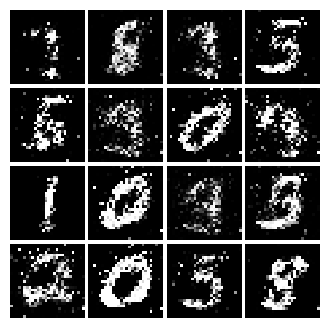

Epoch: 4, Iter: 2200, D: 1.171, G:0.9316


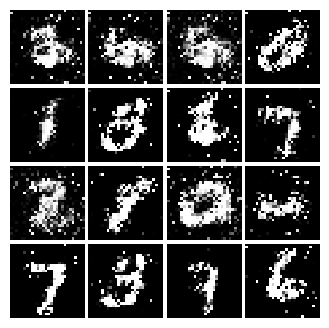

Epoch: 4, Iter: 2220, D: 1.37, G:0.8892


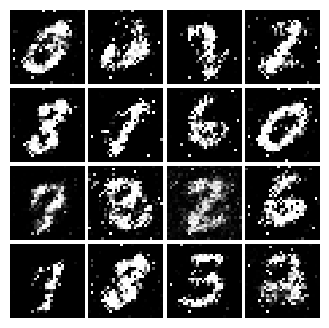

Epoch: 4, Iter: 2240, D: 1.253, G:0.8912


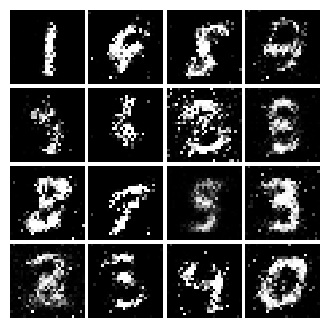

Epoch: 4, Iter: 2260, D: 1.308, G:0.8621


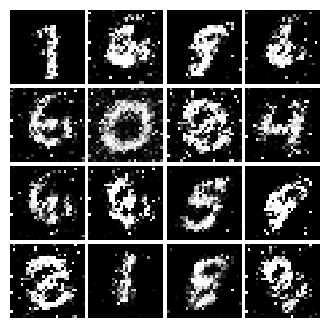

Epoch: 4, Iter: 2280, D: 1.274, G:0.9242


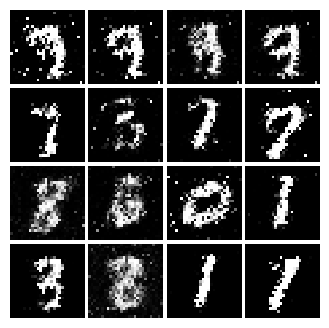

Epoch: 4, Iter: 2300, D: 1.274, G:0.7641


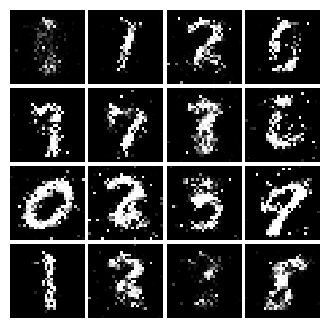

Epoch: 4, Iter: 2320, D: 1.293, G:0.905


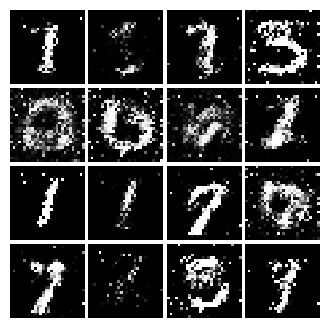

Epoch: 4, Iter: 2340, D: 1.369, G:0.741


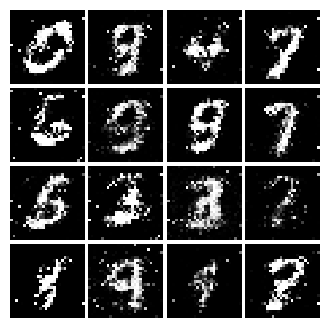

Epoch: 5, Iter: 2360, D: 1.255, G:1.022


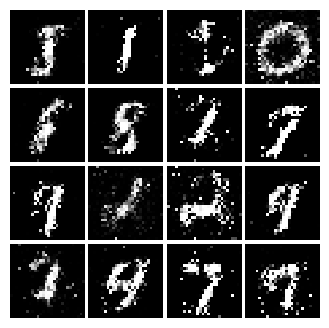

Epoch: 5, Iter: 2380, D: 1.373, G:0.7696


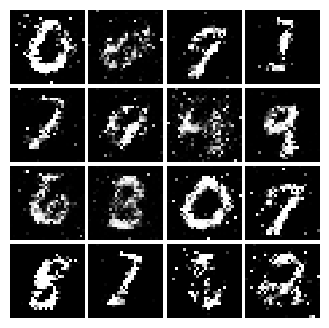

Epoch: 5, Iter: 2400, D: 1.461, G:1.141


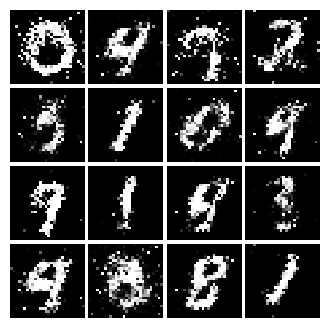

Epoch: 5, Iter: 2420, D: 1.166, G:0.9688


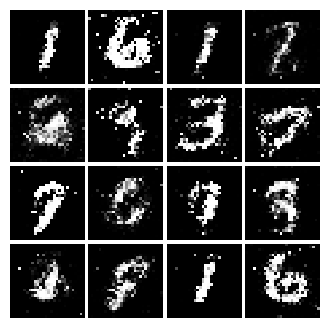

Epoch: 5, Iter: 2440, D: 1.331, G:0.8473


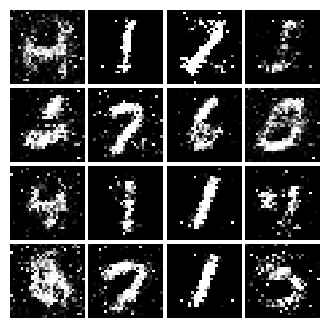

Epoch: 5, Iter: 2460, D: 1.151, G:0.9364


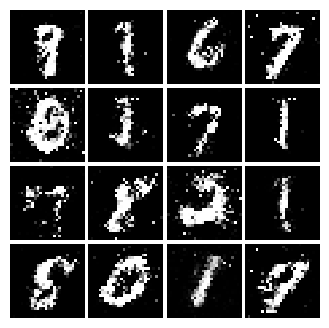

Epoch: 5, Iter: 2480, D: 1.258, G:0.8437


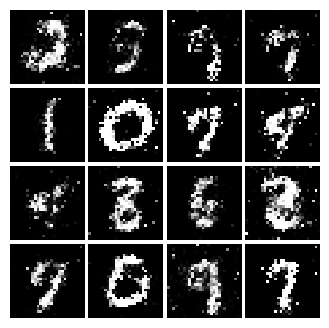

Epoch: 5, Iter: 2500, D: 1.288, G:0.8516


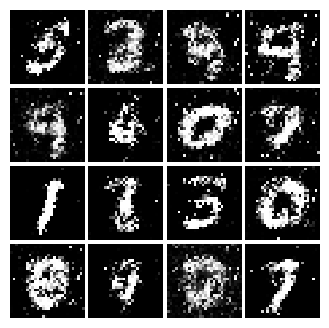

Epoch: 5, Iter: 2520, D: 1.484, G:0.8373


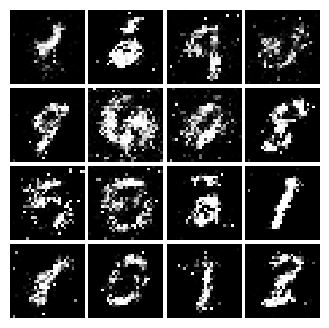

Epoch: 5, Iter: 2540, D: 1.305, G:0.4096


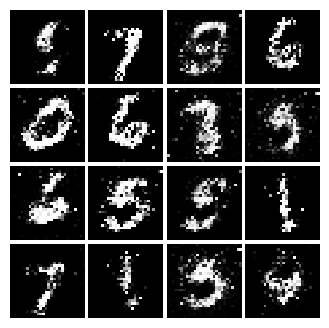

Epoch: 5, Iter: 2560, D: 1.354, G:0.8184


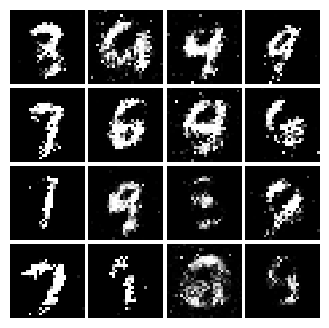

Epoch: 5, Iter: 2580, D: 1.34, G:0.8853


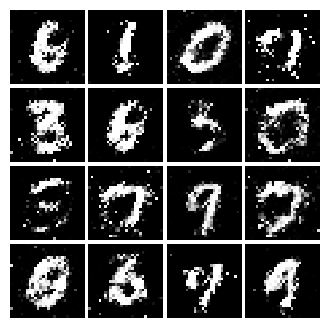

Epoch: 5, Iter: 2600, D: 1.485, G:0.7776


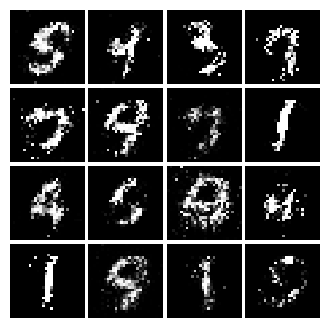

Epoch: 5, Iter: 2620, D: 1.399, G:0.8501


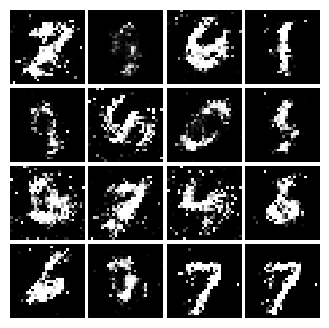

Epoch: 5, Iter: 2640, D: 1.327, G:0.7987


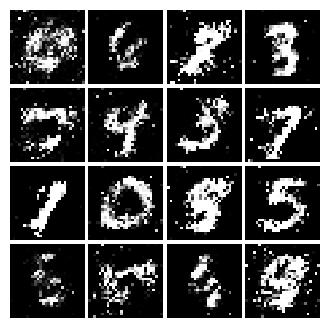

Epoch: 5, Iter: 2660, D: 1.336, G:0.7984


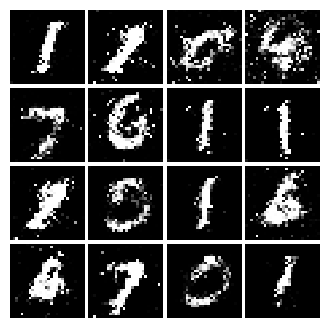

Epoch: 5, Iter: 2680, D: 1.39, G:0.8376


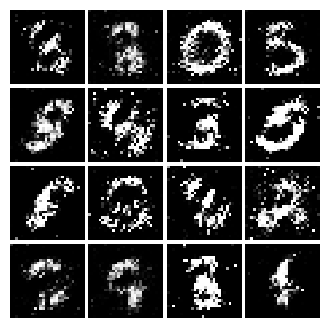

Epoch: 5, Iter: 2700, D: 1.357, G:0.8649


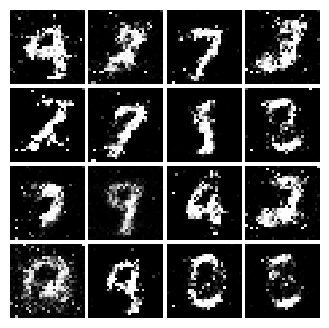

Epoch: 5, Iter: 2720, D: 1.367, G:0.8081


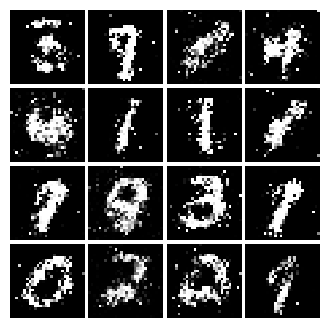

Epoch: 5, Iter: 2740, D: 1.344, G:0.8548


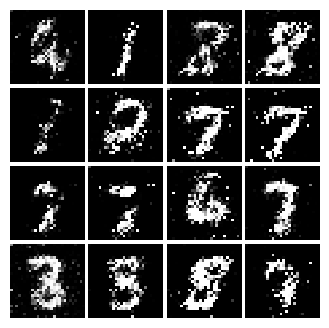

Epoch: 5, Iter: 2760, D: 1.317, G:0.886


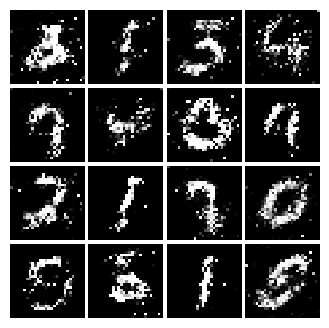

Epoch: 5, Iter: 2780, D: 1.235, G:0.7468


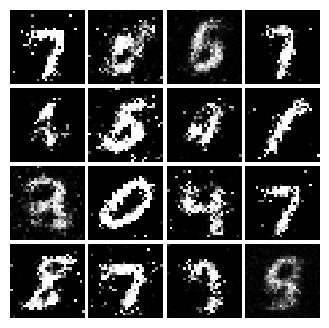

Epoch: 5, Iter: 2800, D: 1.224, G:0.8421


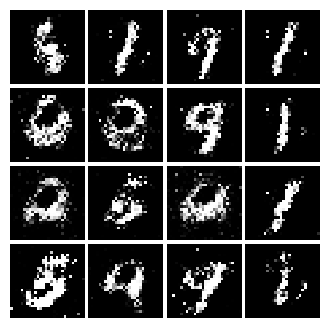

Epoch: 6, Iter: 2820, D: 1.325, G:0.7913


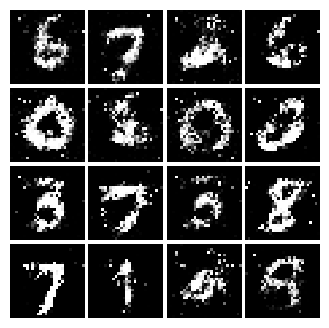

Epoch: 6, Iter: 2840, D: 1.385, G:0.8536


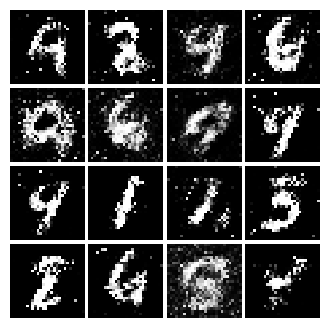

Epoch: 6, Iter: 2860, D: 1.282, G:0.821


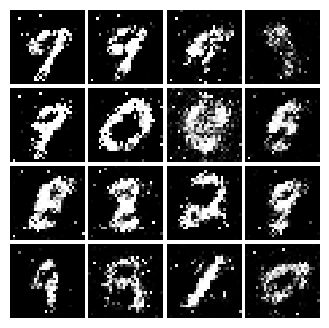

Epoch: 6, Iter: 2880, D: 1.311, G:0.841


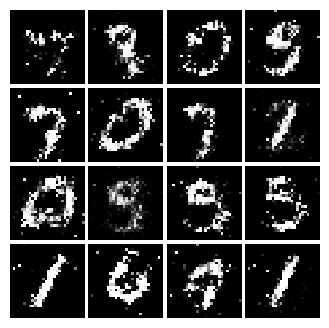

Epoch: 6, Iter: 2900, D: 1.348, G:0.8218


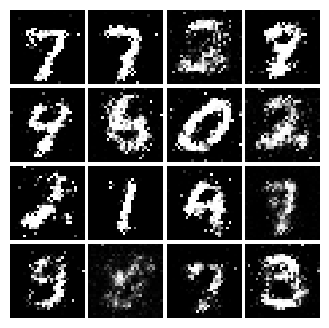

Epoch: 6, Iter: 2920, D: 1.426, G:0.7237


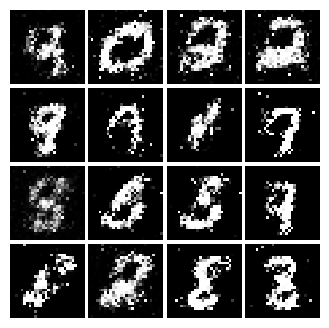

Epoch: 6, Iter: 2940, D: 1.321, G:0.8359


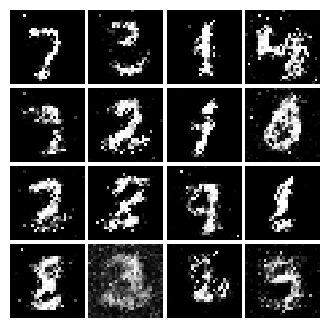

Epoch: 6, Iter: 2960, D: 1.375, G:0.8299


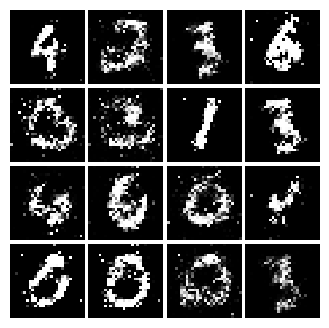

Epoch: 6, Iter: 2980, D: 1.32, G:0.7633


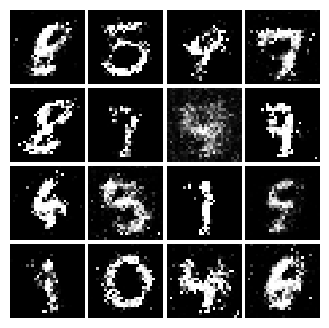

Epoch: 6, Iter: 3000, D: 1.347, G:0.8791


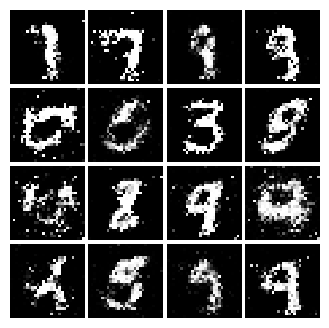

Epoch: 6, Iter: 3020, D: 1.301, G:0.8646


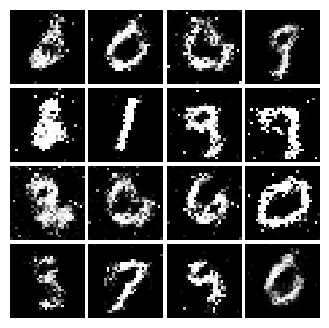

Epoch: 6, Iter: 3040, D: 1.42, G:0.5601


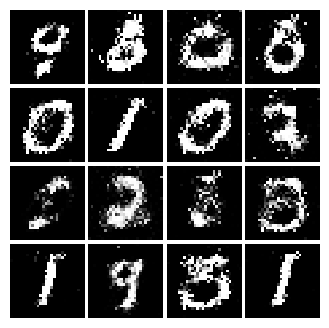

Epoch: 6, Iter: 3060, D: 1.365, G:0.79


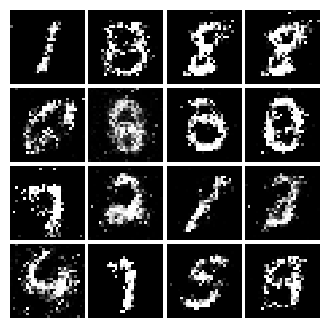

Epoch: 6, Iter: 3080, D: 1.357, G:0.8656


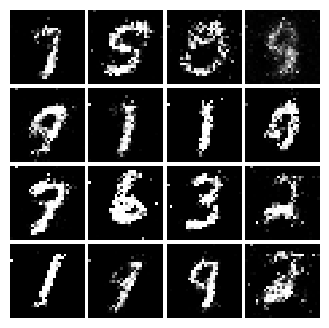

Epoch: 6, Iter: 3100, D: 1.339, G:0.7517


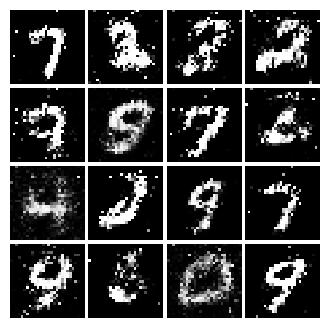

Epoch: 6, Iter: 3120, D: 1.281, G:0.7769


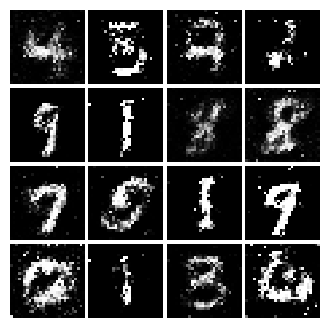

Epoch: 6, Iter: 3140, D: 1.363, G:0.7662


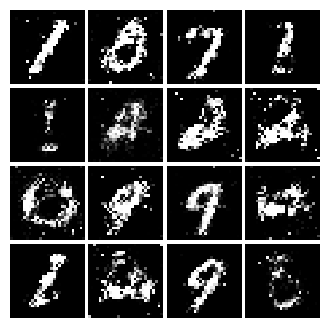

Epoch: 6, Iter: 3160, D: 1.339, G:0.8239


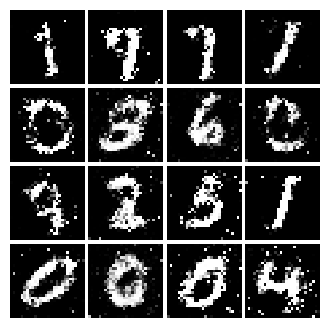

Epoch: 6, Iter: 3180, D: 1.323, G:0.8338


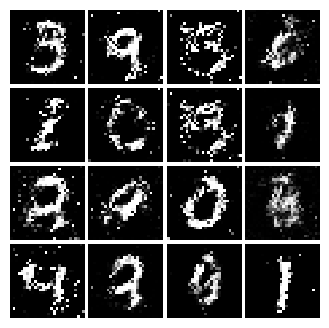

Epoch: 6, Iter: 3200, D: 1.447, G:0.9328


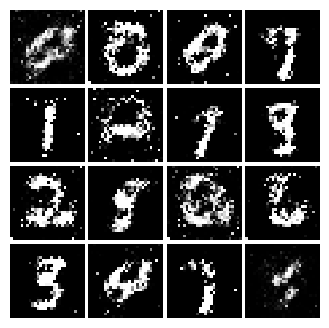

Epoch: 6, Iter: 3220, D: 1.27, G:0.8483


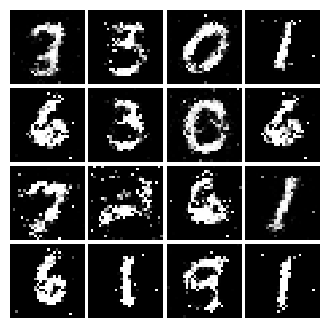

Epoch: 6, Iter: 3240, D: 1.261, G:0.7935


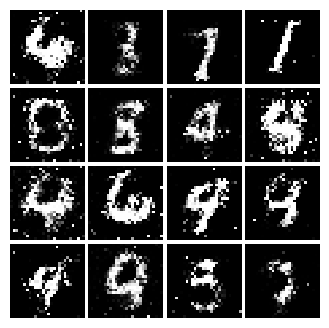

Epoch: 6, Iter: 3260, D: 1.38, G:0.7381


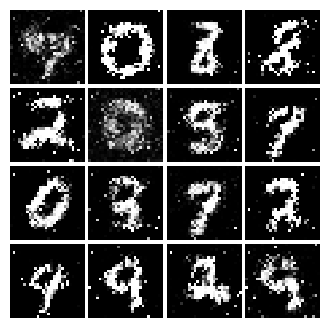

Epoch: 6, Iter: 3280, D: 1.357, G:0.801


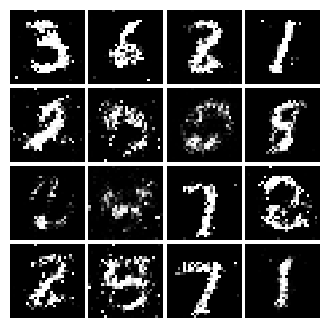

Epoch: 7, Iter: 3300, D: 1.264, G:0.8268


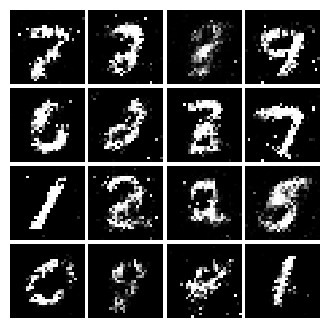

Epoch: 7, Iter: 3320, D: 1.238, G:0.835


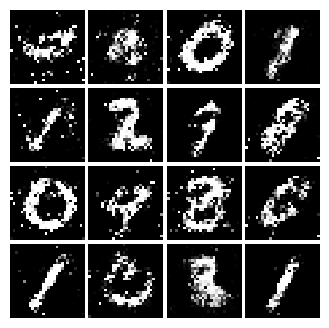

Epoch: 7, Iter: 3340, D: 1.229, G:0.8741


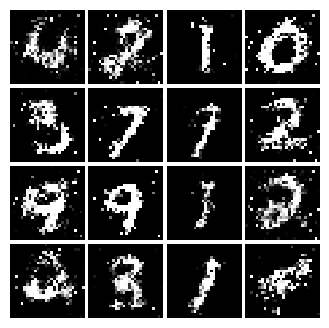

Epoch: 7, Iter: 3360, D: 1.424, G:0.9503


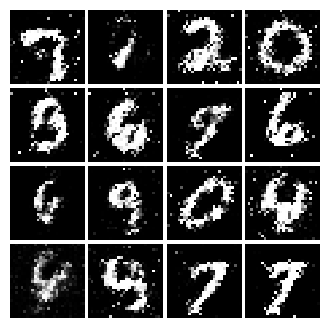

Epoch: 7, Iter: 3380, D: 1.375, G:0.8332


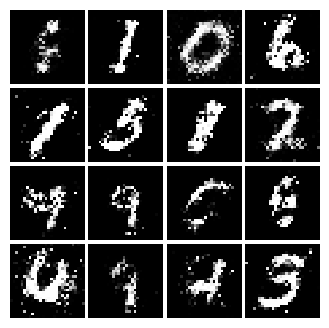

Epoch: 7, Iter: 3400, D: 1.42, G:0.9256


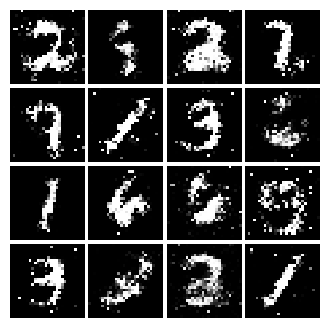

Epoch: 7, Iter: 3420, D: 1.297, G:0.8116


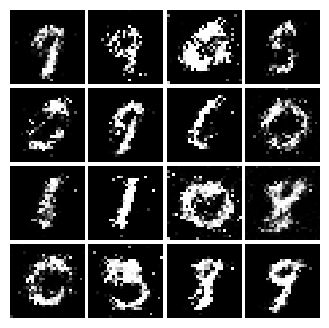

Epoch: 7, Iter: 3440, D: 1.289, G:0.8598


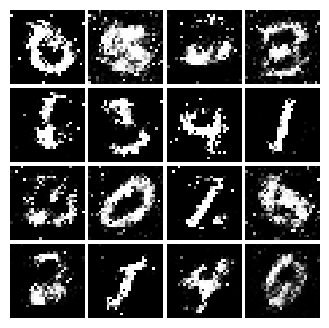

Epoch: 7, Iter: 3460, D: 1.343, G:0.8015


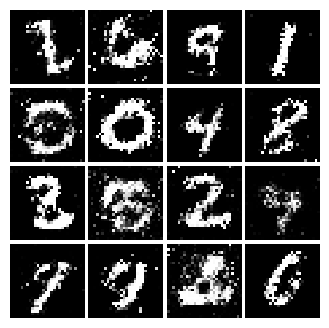

Epoch: 7, Iter: 3480, D: 1.381, G:0.727


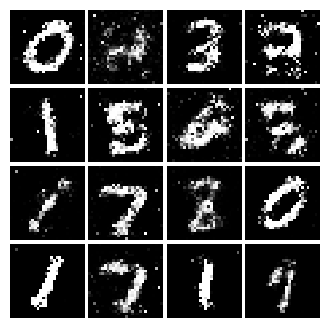

Epoch: 7, Iter: 3500, D: 1.392, G:0.737


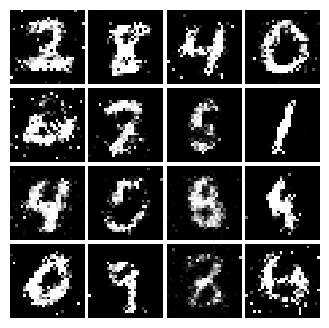

Epoch: 7, Iter: 3520, D: 1.4, G:0.7649


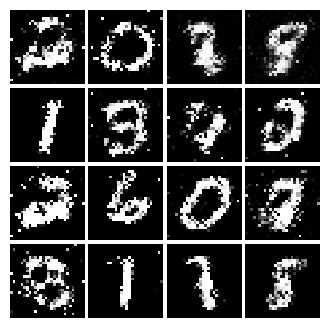

Epoch: 7, Iter: 3540, D: 1.258, G:0.7761


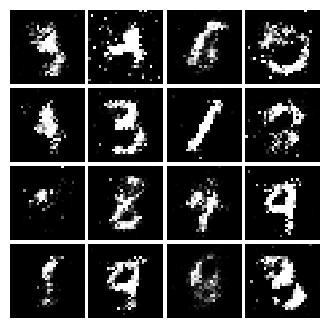

Epoch: 7, Iter: 3560, D: 1.352, G:0.8263


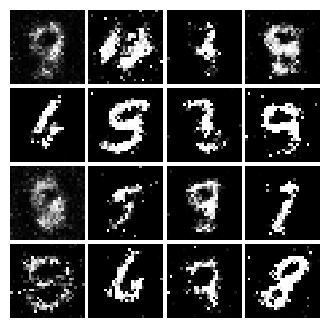

Epoch: 7, Iter: 3580, D: 1.383, G:0.8762


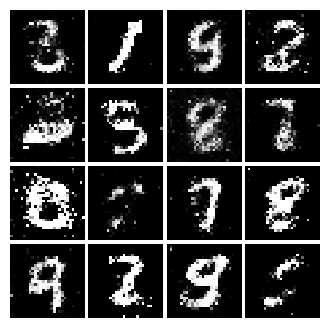

Epoch: 7, Iter: 3600, D: 1.289, G:0.7242


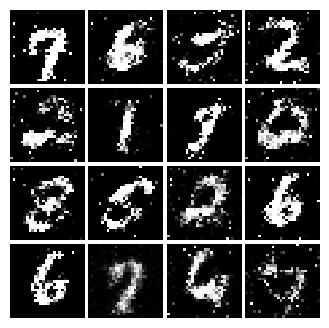

Epoch: 7, Iter: 3620, D: 1.307, G:0.8056


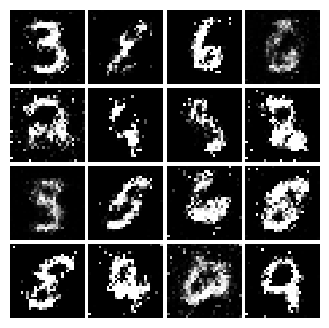

Epoch: 7, Iter: 3640, D: 1.369, G:0.7836


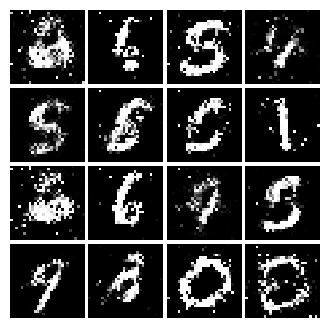

Epoch: 7, Iter: 3660, D: 1.343, G:0.7894


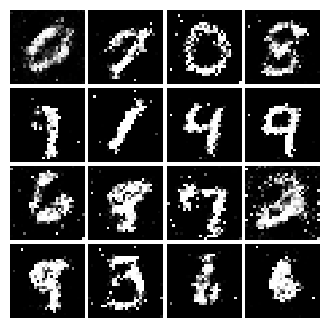

Epoch: 7, Iter: 3680, D: 1.347, G:0.7794


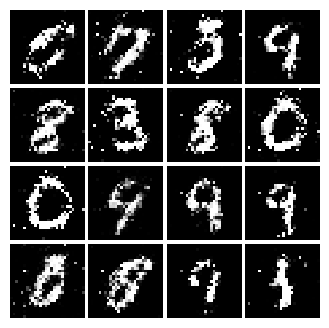

Epoch: 7, Iter: 3700, D: 1.316, G:0.7943


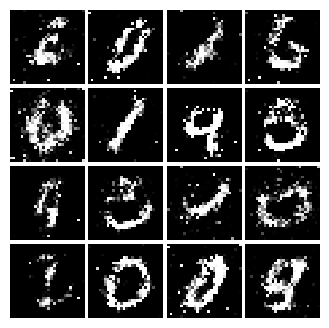

Epoch: 7, Iter: 3720, D: 1.409, G:0.7272


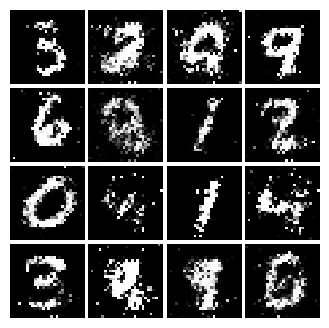

Epoch: 7, Iter: 3740, D: 1.354, G:0.8112


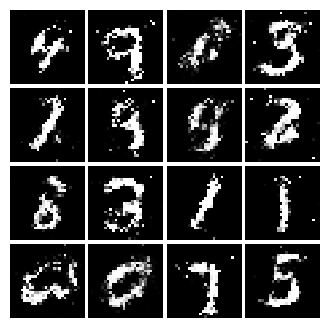

Epoch: 8, Iter: 3760, D: 1.392, G:0.9181


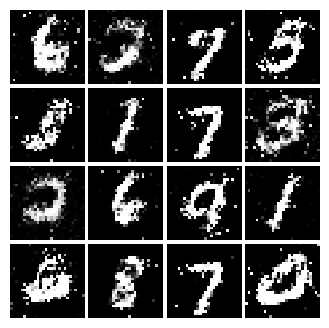

Epoch: 8, Iter: 3780, D: 1.432, G:0.7637


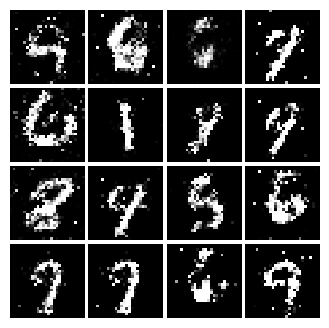

Epoch: 8, Iter: 3800, D: 1.306, G:0.7861


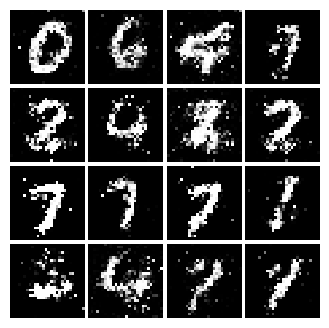

Epoch: 8, Iter: 3820, D: 1.328, G:0.7511


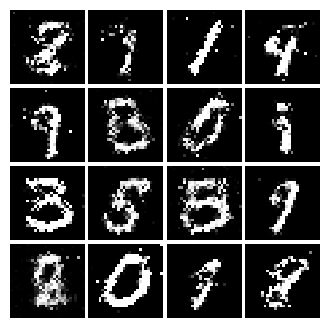

Epoch: 8, Iter: 3840, D: 1.369, G:0.7672


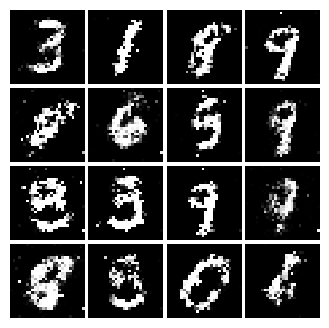

Epoch: 8, Iter: 3860, D: 1.32, G:0.7898


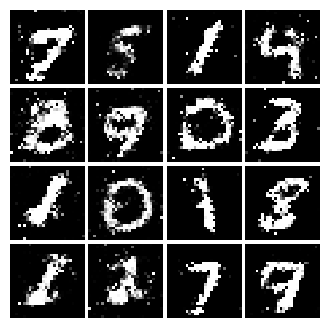

Epoch: 8, Iter: 3880, D: 1.277, G:0.7185


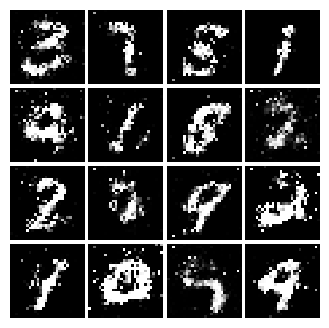

Epoch: 8, Iter: 3900, D: 1.365, G:0.8208


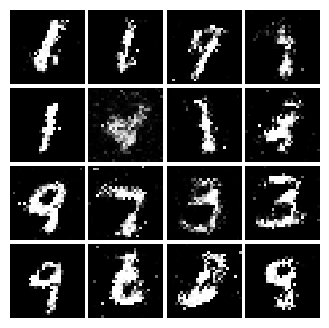

Epoch: 8, Iter: 3920, D: 1.364, G:0.7951


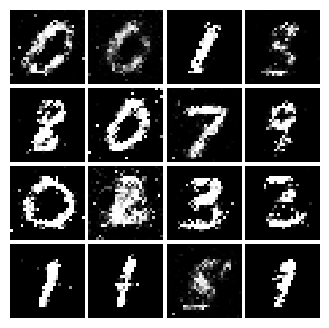

Epoch: 8, Iter: 3940, D: 1.363, G:0.8291


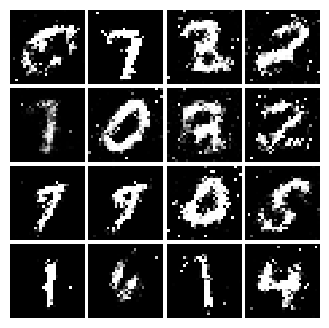

Epoch: 8, Iter: 3960, D: 1.293, G:0.806


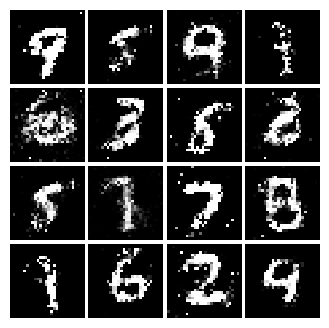

Epoch: 8, Iter: 3980, D: 1.318, G:0.8158


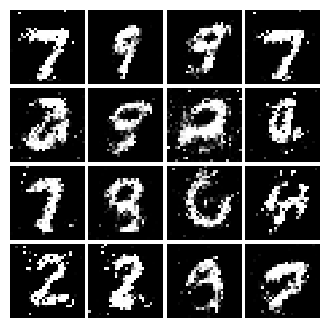

Epoch: 8, Iter: 4000, D: 1.283, G:0.8065


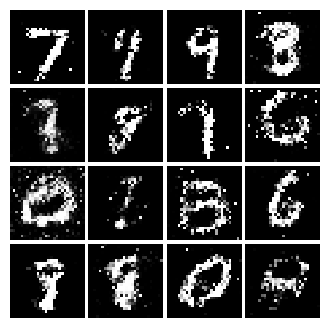

Epoch: 8, Iter: 4020, D: 1.384, G:0.7894


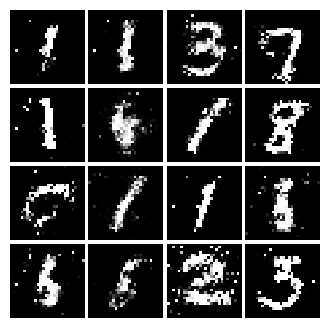

Epoch: 8, Iter: 4040, D: 1.301, G:0.8521


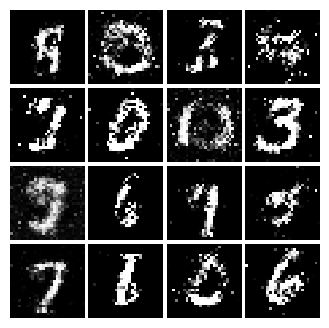

Epoch: 8, Iter: 4060, D: 1.29, G:0.8929


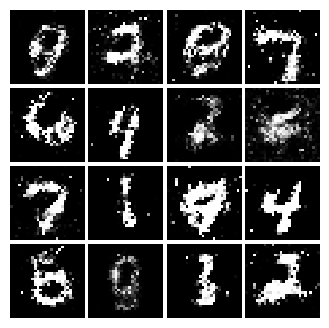

Epoch: 8, Iter: 4080, D: 1.373, G:0.787


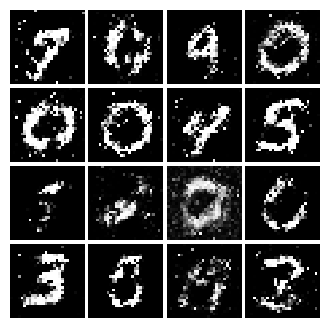

Epoch: 8, Iter: 4100, D: 1.31, G:0.7549


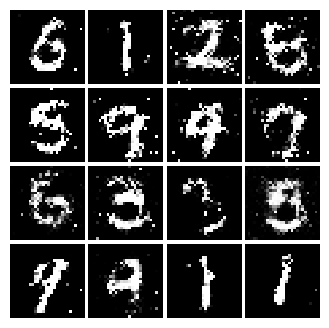

Epoch: 8, Iter: 4120, D: 1.293, G:0.9755


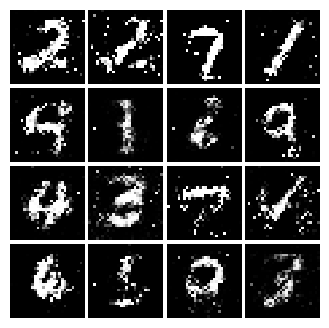

Epoch: 8, Iter: 4140, D: 1.31, G:0.8772


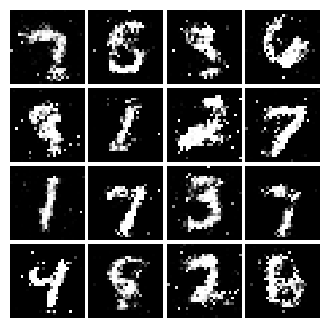

Epoch: 8, Iter: 4160, D: 1.388, G:0.777


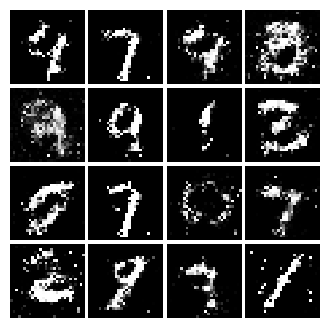

Epoch: 8, Iter: 4180, D: 1.351, G:0.7556


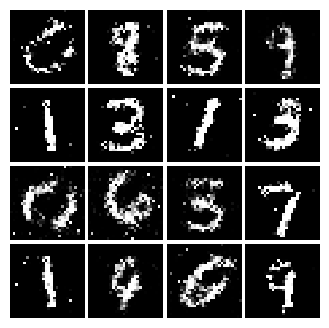

Epoch: 8, Iter: 4200, D: 1.41, G:0.8522


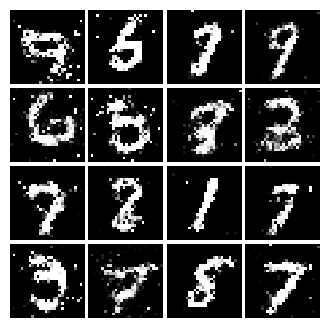

Epoch: 8, Iter: 4220, D: 1.405, G:0.7361


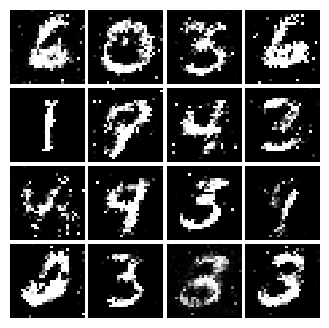

Epoch: 9, Iter: 4240, D: 1.365, G:0.7705


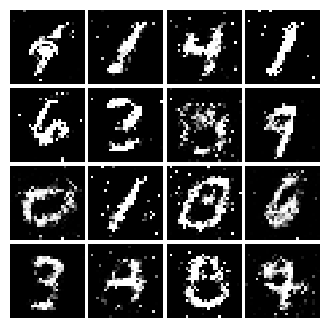

Epoch: 9, Iter: 4260, D: 1.356, G:0.7436


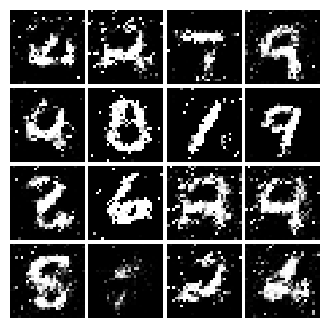

Epoch: 9, Iter: 4280, D: 1.233, G:0.851


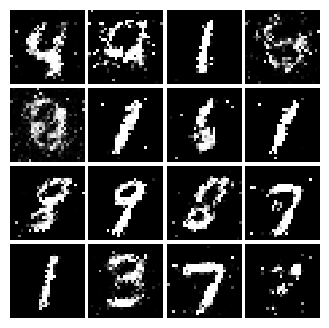

Epoch: 9, Iter: 4300, D: 1.28, G:0.8322


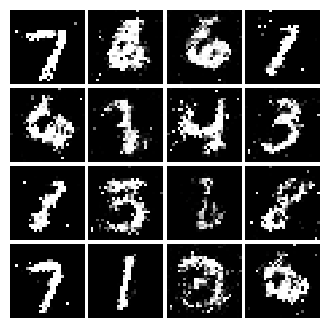

Epoch: 9, Iter: 4320, D: 1.359, G:0.8081


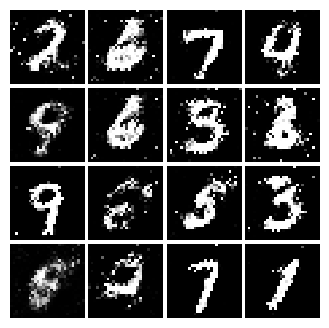

Epoch: 9, Iter: 4340, D: 1.435, G:0.866


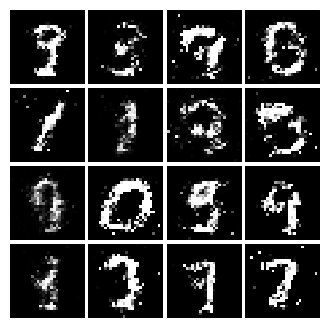

Epoch: 9, Iter: 4360, D: 1.345, G:0.8735


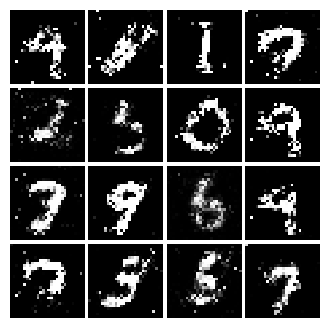

Epoch: 9, Iter: 4380, D: 1.414, G:0.8267


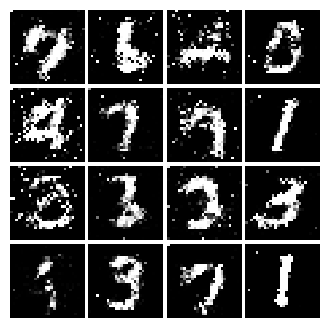

Epoch: 9, Iter: 4400, D: 1.254, G:0.9251


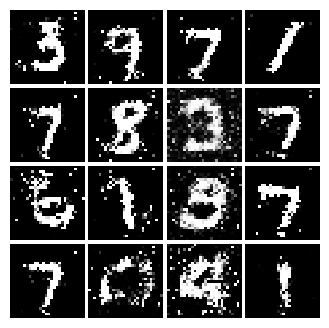

Epoch: 9, Iter: 4420, D: 1.297, G:0.8257


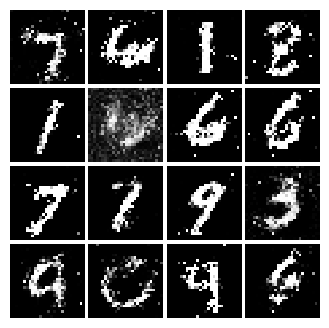

Epoch: 9, Iter: 4440, D: 1.304, G:0.7894


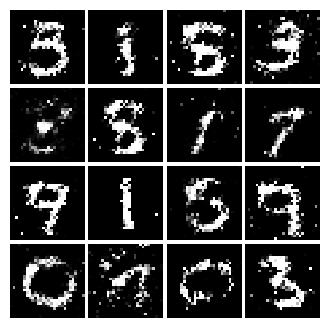

Epoch: 9, Iter: 4460, D: 1.313, G:0.8442


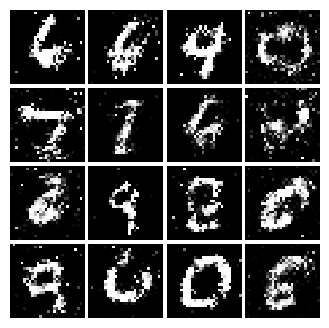

Epoch: 9, Iter: 4480, D: 1.245, G:0.9061


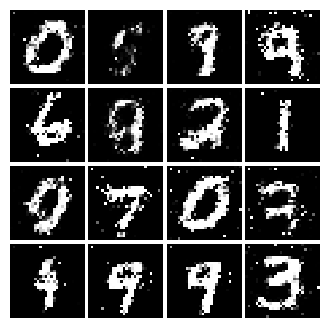

Epoch: 9, Iter: 4500, D: 1.477, G:0.7923


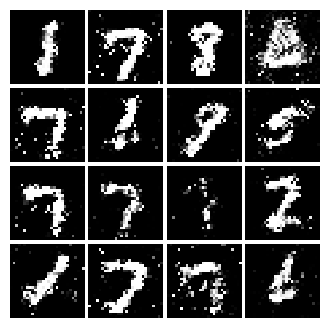

Epoch: 9, Iter: 4520, D: 1.324, G:0.7774


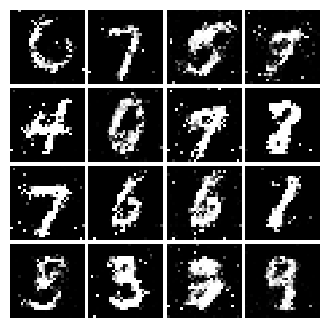

Epoch: 9, Iter: 4540, D: 1.343, G:0.9844


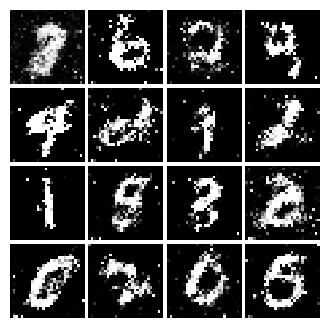

Epoch: 9, Iter: 4560, D: 1.262, G:0.7478


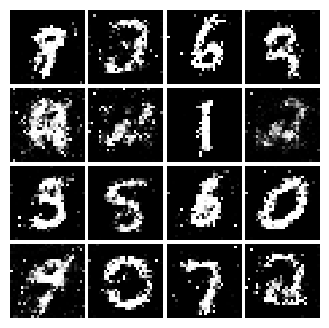

Epoch: 9, Iter: 4580, D: 1.301, G:0.8654


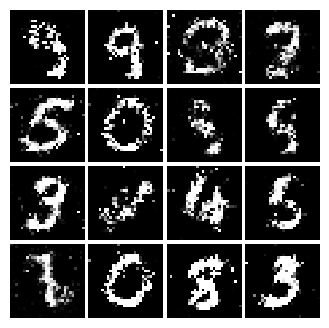

Epoch: 9, Iter: 4600, D: 1.361, G:0.7913


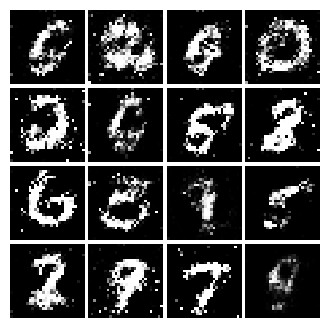

Epoch: 9, Iter: 4620, D: 1.297, G:0.8696


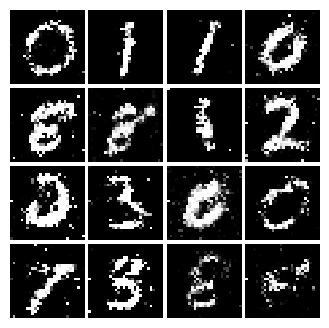

Epoch: 9, Iter: 4640, D: 1.303, G:0.7306


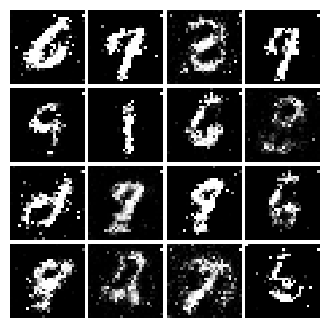

Epoch: 9, Iter: 4660, D: 1.364, G:0.9061


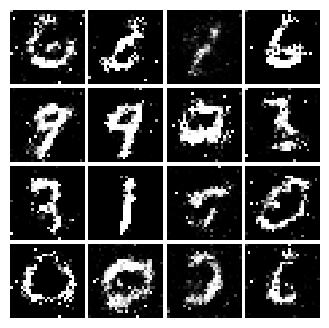

Epoch: 9, Iter: 4680, D: 1.304, G:0.7676


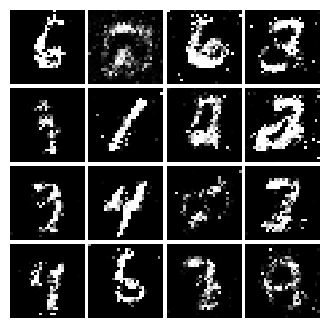

Final images


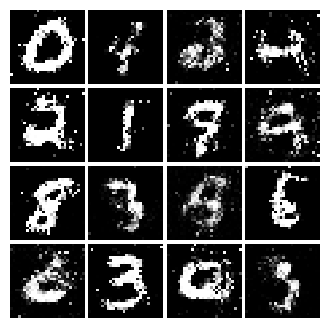

In [18]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [20]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    real_loss = tf.reduce_mean(tf.square(scores_real - 1))
    fake_loss = tf.reduce_mean(tf.square(scores_fake))
    loss = 0.5 * (real_loss + fake_loss)

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.

    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - 1))

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [21]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):

    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.11, G:0.5178


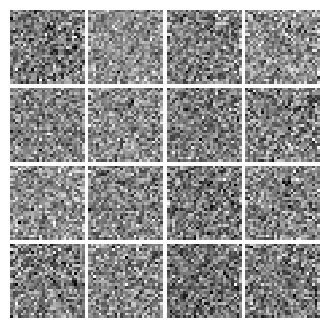

Epoch: 0, Iter: 20, D: 0.03286, G:0.953


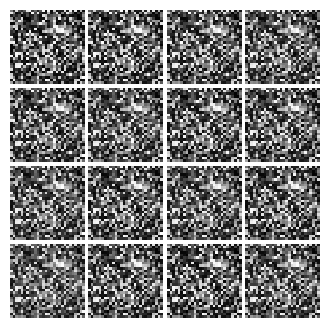

Epoch: 0, Iter: 40, D: 0.03774, G:1.219


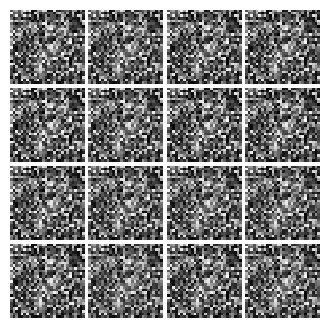

Epoch: 0, Iter: 60, D: 0.3603, G:0.5386


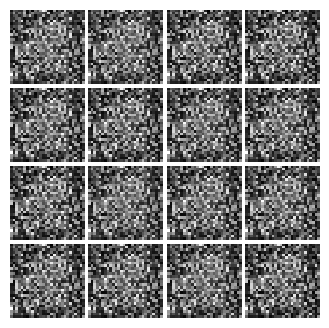

Epoch: 0, Iter: 80, D: 0.08735, G:0.4767


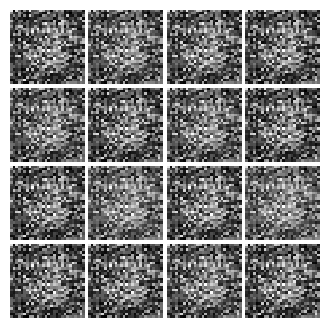

Epoch: 0, Iter: 100, D: 0.05506, G:0.8314


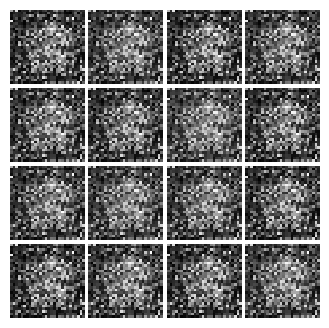

Epoch: 0, Iter: 120, D: 0.02492, G:0.6657


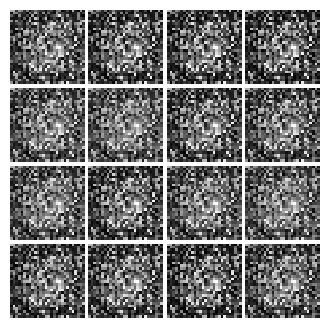

Epoch: 0, Iter: 140, D: 0.138, G:0.2985


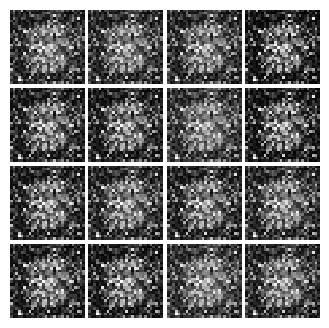

Epoch: 0, Iter: 160, D: 0.5575, G:0.1048


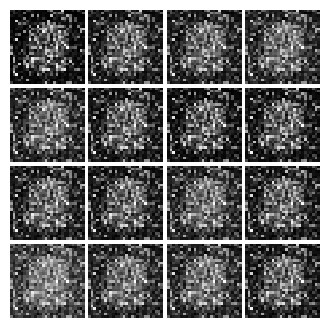

Epoch: 0, Iter: 180, D: 0.09117, G:0.697


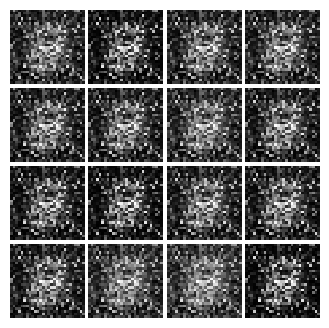

Epoch: 0, Iter: 200, D: 0.1238, G:0.4657


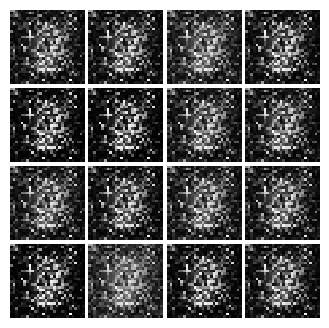

Epoch: 0, Iter: 220, D: 0.1035, G:0.666


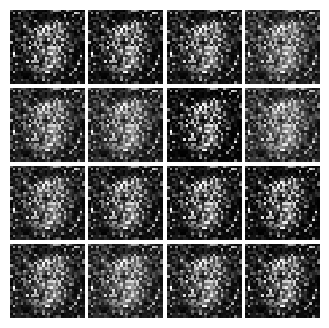

Epoch: 0, Iter: 240, D: 0.6314, G:0.3269


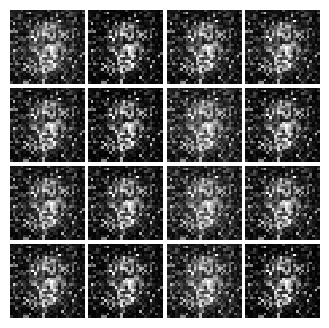

Epoch: 0, Iter: 260, D: 0.1854, G:0.348


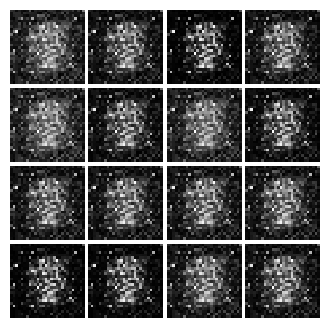

Epoch: 0, Iter: 280, D: 0.2179, G:0.4672


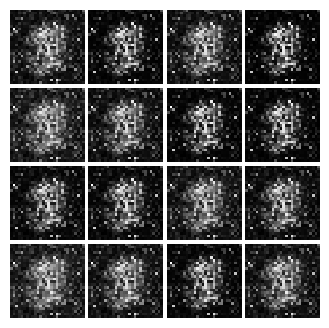

Epoch: 0, Iter: 300, D: 0.2872, G:0.5144


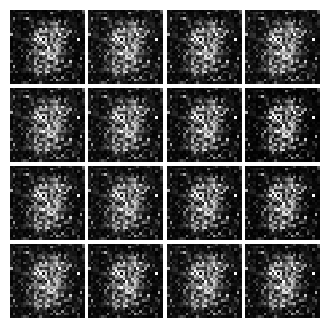

Epoch: 0, Iter: 320, D: 0.08828, G:0.3192


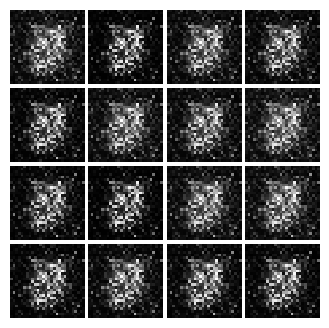

Epoch: 0, Iter: 340, D: 0.08399, G:0.4107


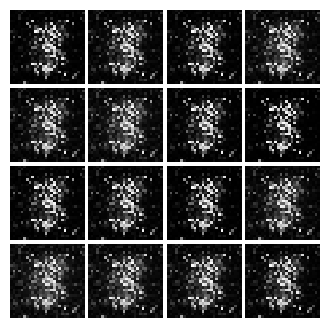

Epoch: 0, Iter: 360, D: 0.06641, G:0.7079


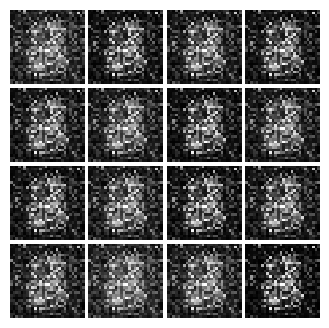

Epoch: 0, Iter: 380, D: 0.08833, G:0.4905


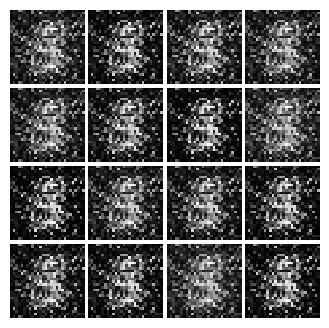

Epoch: 0, Iter: 400, D: 0.1078, G:0.5277


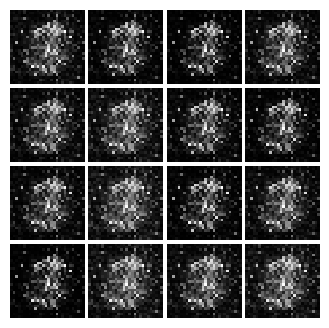

Epoch: 0, Iter: 420, D: 0.08139, G:0.4532


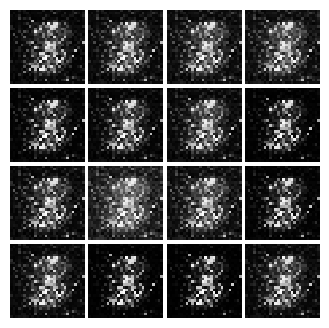

Epoch: 0, Iter: 440, D: 0.136, G:0.3038


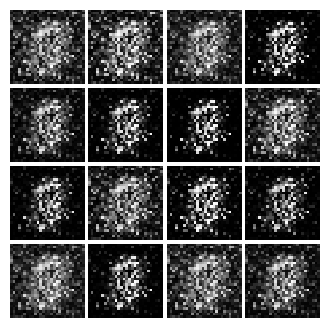

Epoch: 0, Iter: 460, D: 0.2089, G:0.3031


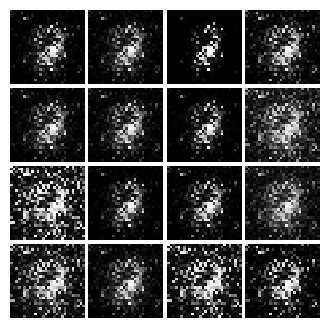

Epoch: 1, Iter: 480, D: 0.1306, G:0.3143


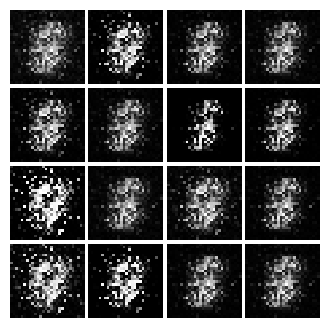

Epoch: 1, Iter: 500, D: 0.09805, G:0.4643


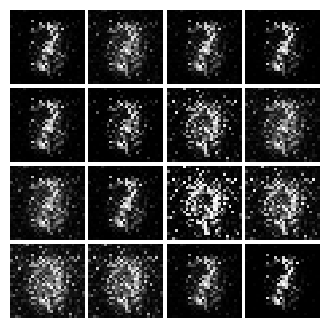

Epoch: 1, Iter: 520, D: 0.1445, G:0.9046


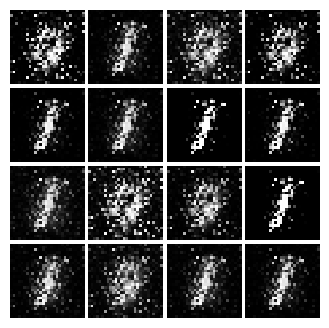

Epoch: 1, Iter: 540, D: 0.1045, G:0.4324


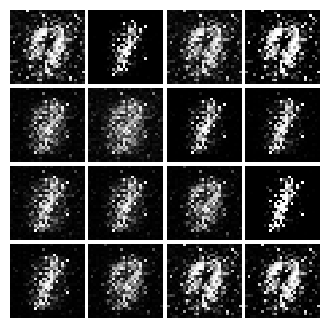

Epoch: 1, Iter: 560, D: 0.4751, G:0.1519


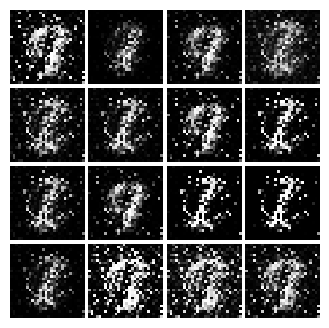

Epoch: 1, Iter: 580, D: 0.1404, G:0.4966


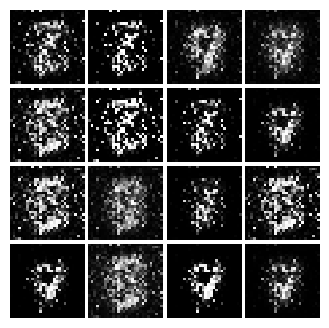

Epoch: 1, Iter: 600, D: 0.2099, G:0.1312


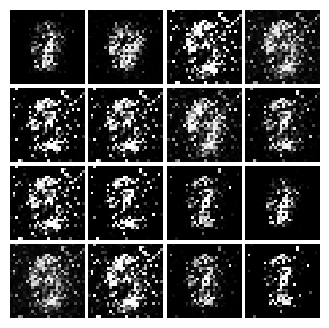

Epoch: 1, Iter: 620, D: 0.1423, G:0.4396


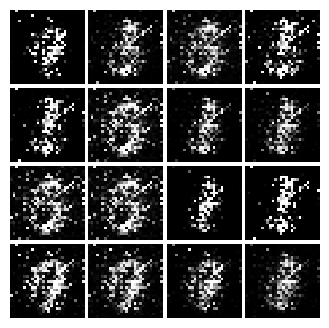

Epoch: 1, Iter: 640, D: 0.09731, G:0.6367


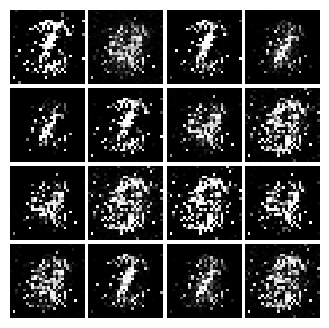

Epoch: 1, Iter: 660, D: 0.07112, G:1.209


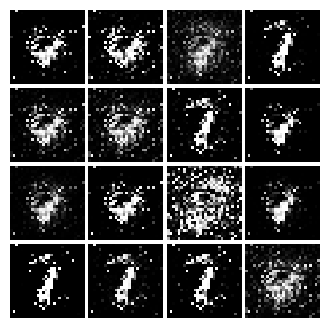

Epoch: 1, Iter: 680, D: 0.1032, G:0.4178


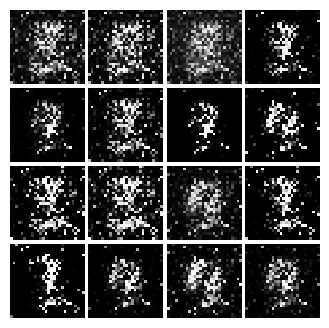

Epoch: 1, Iter: 700, D: 0.1304, G:0.2421


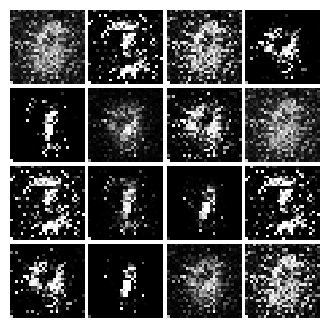

Epoch: 1, Iter: 720, D: 0.1245, G:0.2983


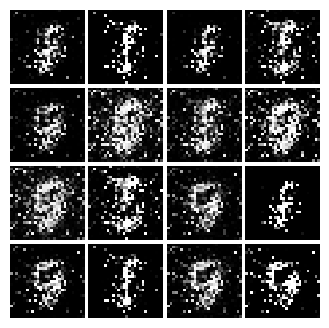

Epoch: 1, Iter: 740, D: 0.1357, G:0.3587


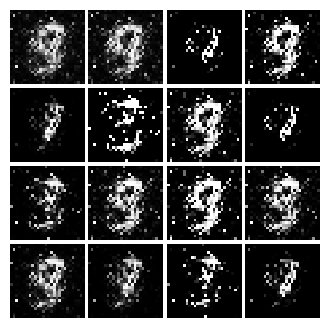

Epoch: 1, Iter: 760, D: 0.2681, G:0.1555


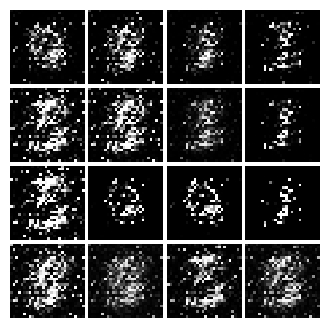

Epoch: 1, Iter: 780, D: 0.1025, G:0.4906


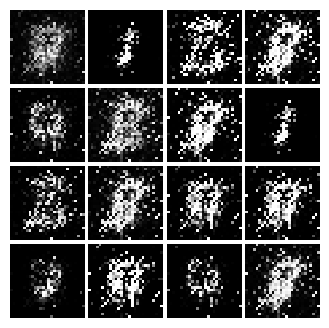

Epoch: 1, Iter: 800, D: 0.08746, G:0.8846


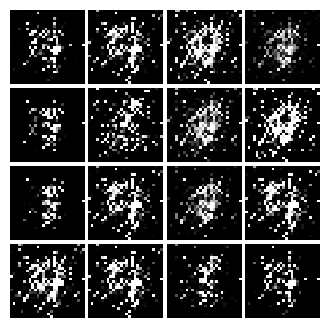

Epoch: 1, Iter: 820, D: 0.08483, G:0.479


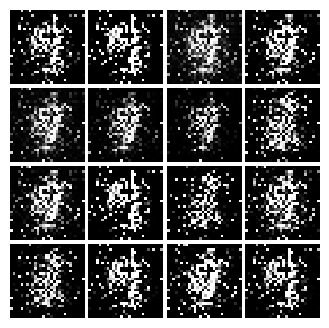

Epoch: 1, Iter: 840, D: 0.1361, G:1.199


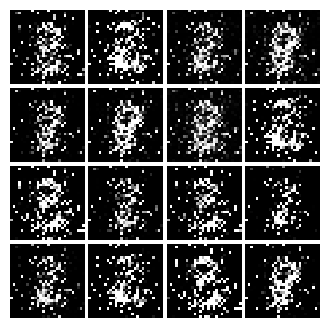

Epoch: 1, Iter: 860, D: 0.07304, G:0.499


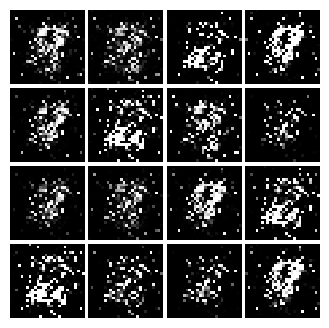

Epoch: 1, Iter: 880, D: 0.06072, G:0.6061


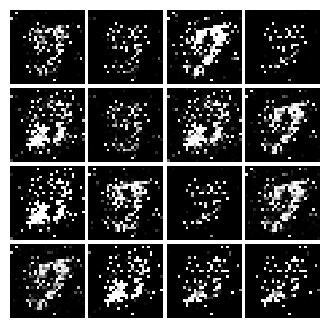

Epoch: 1, Iter: 900, D: 0.1121, G:0.3466


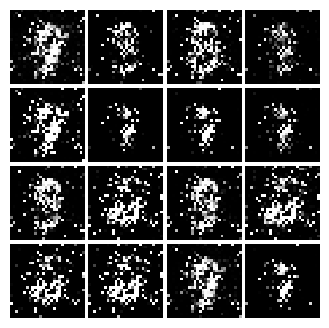

Epoch: 1, Iter: 920, D: 0.1028, G:0.3894


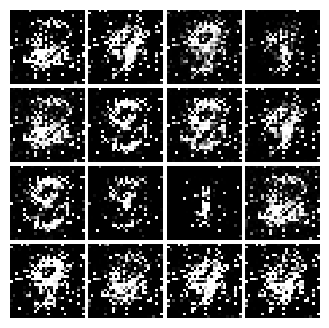

Epoch: 2, Iter: 940, D: 0.06604, G:0.4608


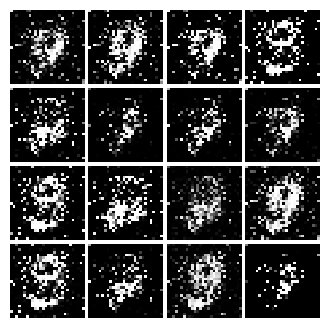

Epoch: 2, Iter: 960, D: 0.09441, G:0.4366


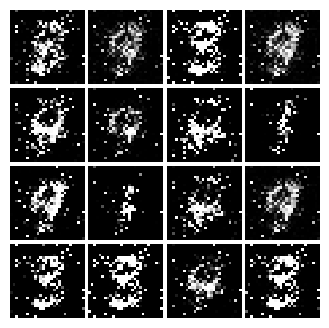

Epoch: 2, Iter: 980, D: 0.07128, G:0.4707


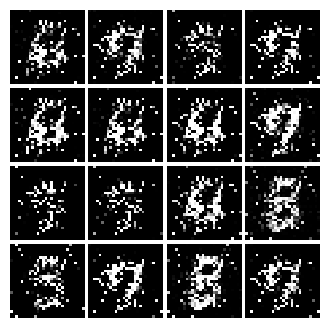

Epoch: 2, Iter: 1000, D: 0.102, G:0.8056


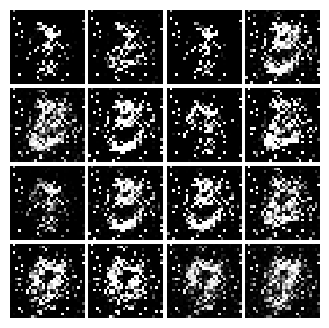

Epoch: 2, Iter: 1020, D: 0.07143, G:0.4221


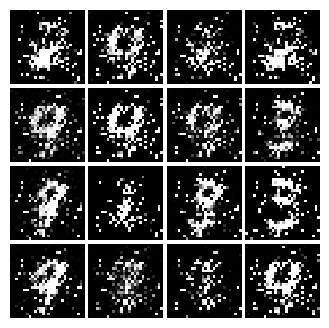

Epoch: 2, Iter: 1040, D: 0.07297, G:0.2918


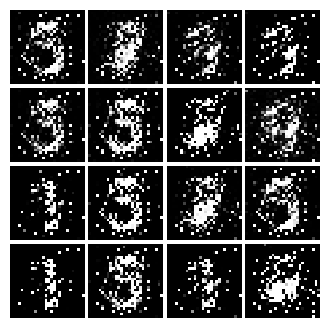

Epoch: 2, Iter: 1060, D: 0.05639, G:0.6519


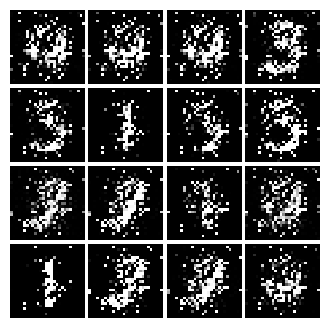

Epoch: 2, Iter: 1080, D: 0.09749, G:0.4279


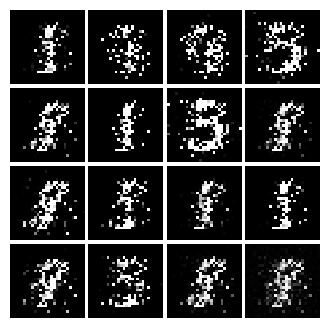

Epoch: 2, Iter: 1100, D: 0.07795, G:0.3657


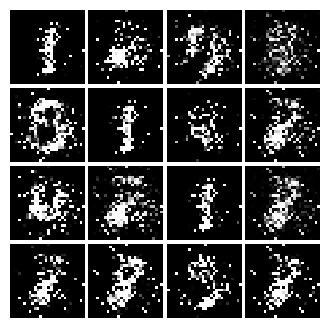

Epoch: 2, Iter: 1120, D: 0.1224, G:0.3082


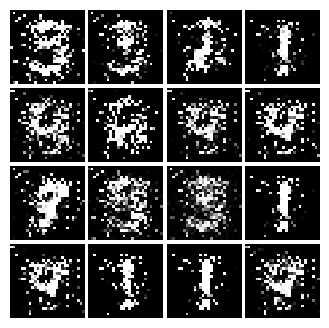

Epoch: 2, Iter: 1140, D: 0.2446, G:0.2993


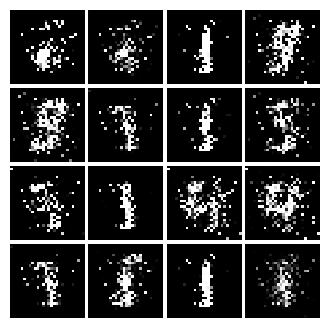

Epoch: 2, Iter: 1160, D: 0.103, G:0.4574


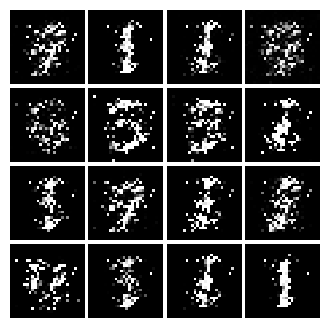

Epoch: 2, Iter: 1180, D: 0.1174, G:0.5767


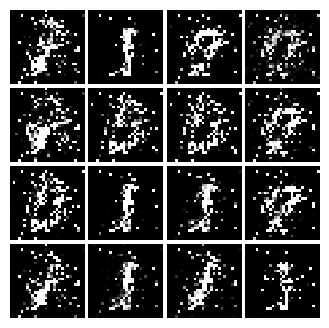

Epoch: 2, Iter: 1200, D: 0.1029, G:0.406


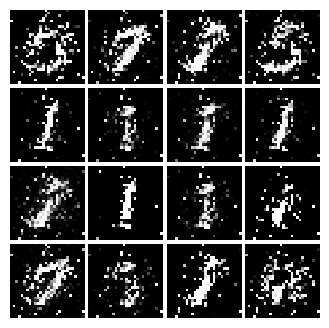

Epoch: 2, Iter: 1220, D: 0.1915, G:1.2


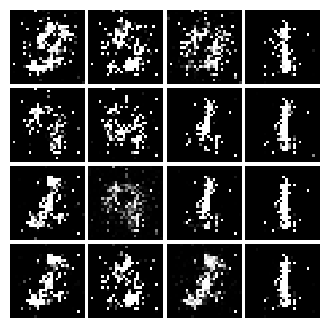

Epoch: 2, Iter: 1240, D: 0.1686, G:0.2593


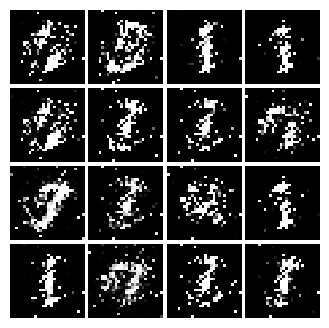

Epoch: 2, Iter: 1260, D: 0.1103, G:0.2151


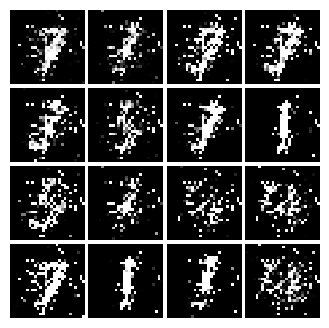

Epoch: 2, Iter: 1280, D: 0.08493, G:0.3674


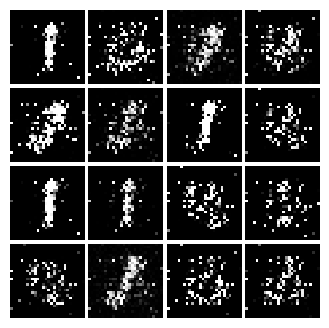

Epoch: 2, Iter: 1300, D: 0.0823, G:0.299


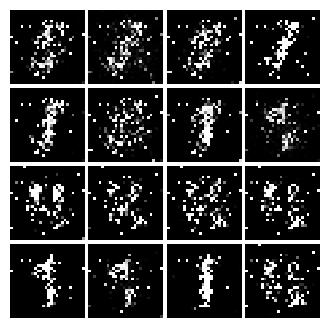

Epoch: 2, Iter: 1320, D: 0.1007, G:0.2205


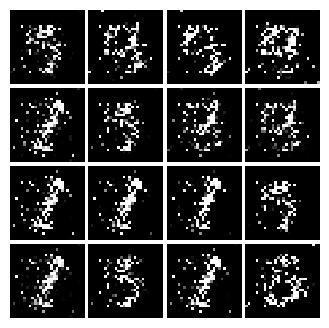

Epoch: 2, Iter: 1340, D: 0.07022, G:0.4987


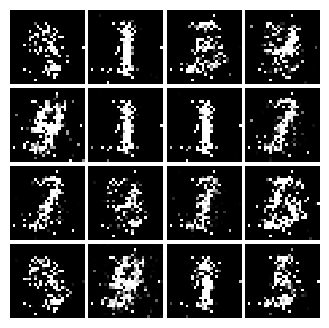

Epoch: 2, Iter: 1360, D: 0.0875, G:0.4429


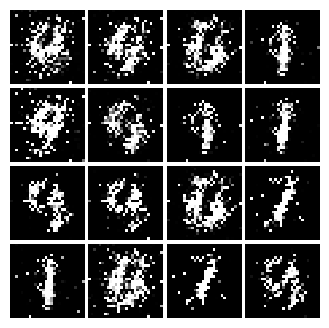

Epoch: 2, Iter: 1380, D: 0.3287, G:0.1554


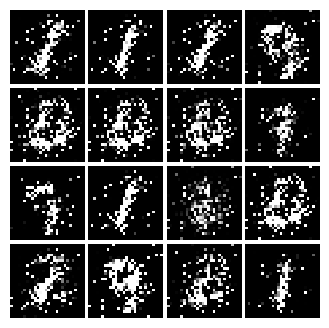

Epoch: 2, Iter: 1400, D: 0.109, G:0.4887


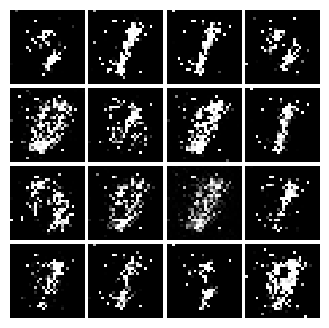

Epoch: 3, Iter: 1420, D: 0.1447, G:0.2906


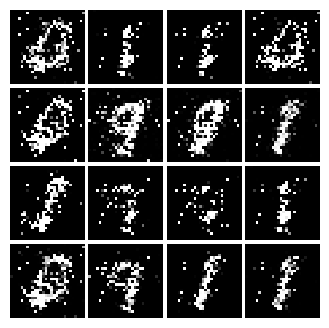

Epoch: 3, Iter: 1440, D: 0.07464, G:0.4642


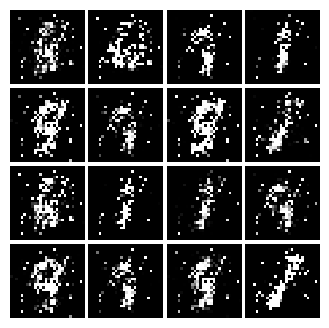

Epoch: 3, Iter: 1460, D: 0.1006, G:0.4566


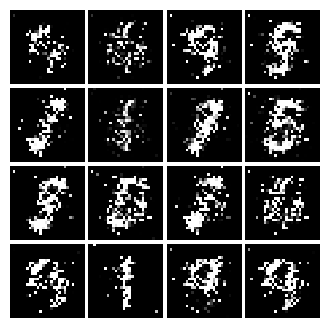

Epoch: 3, Iter: 1480, D: 0.1038, G:0.4151


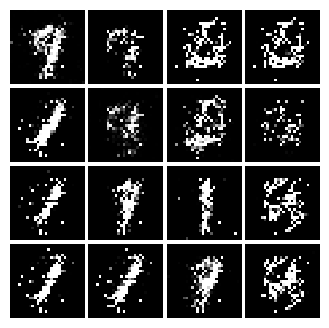

Epoch: 3, Iter: 1500, D: 0.3677, G:0.9424


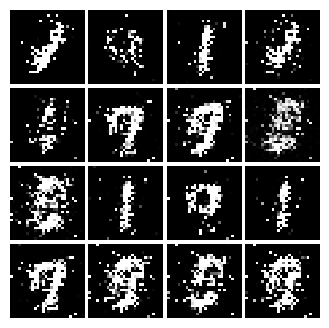

Epoch: 3, Iter: 1520, D: 0.1198, G:0.3831


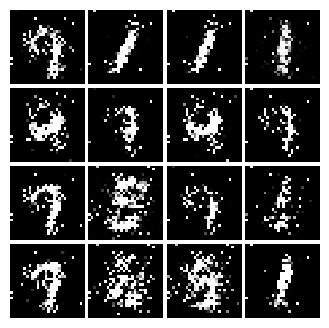

Epoch: 3, Iter: 1540, D: 0.1128, G:0.4972


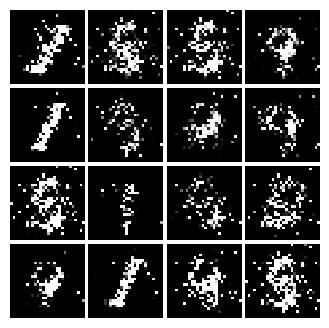

Epoch: 3, Iter: 1560, D: 0.107, G:0.3039


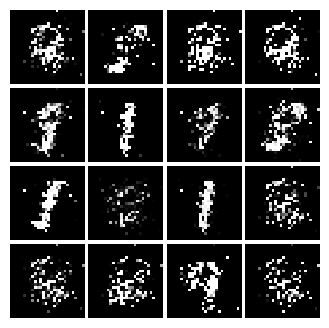

Epoch: 3, Iter: 1580, D: 0.1434, G:0.4966


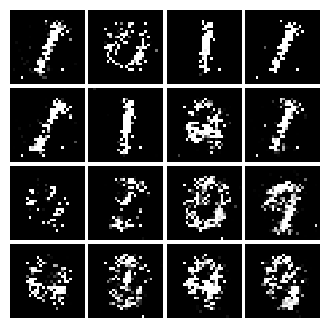

Epoch: 3, Iter: 1600, D: 0.1352, G:0.3613


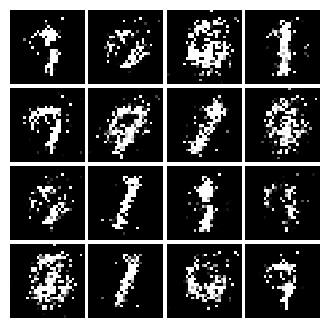

Epoch: 3, Iter: 1620, D: 0.1359, G:0.2562


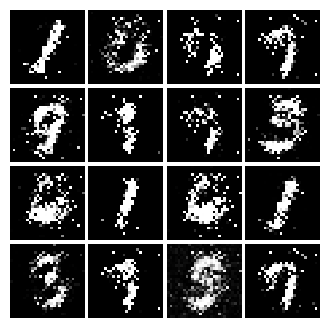

Epoch: 3, Iter: 1640, D: 0.1238, G:0.3888


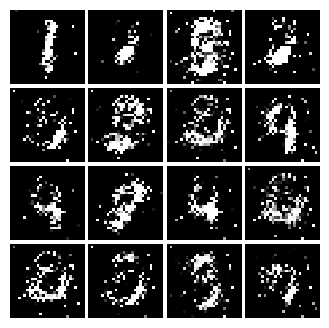

Epoch: 3, Iter: 1660, D: 0.0852, G:0.3602


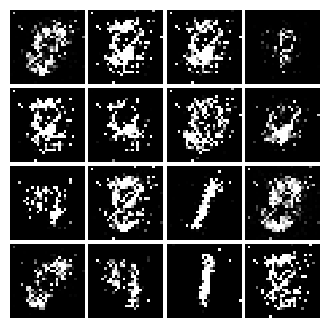

Epoch: 3, Iter: 1680, D: 0.1483, G:0.355


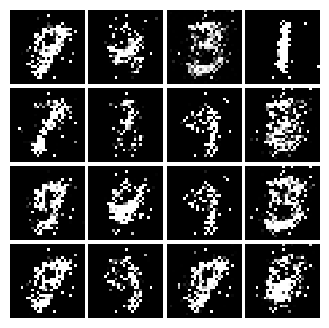

Epoch: 3, Iter: 1700, D: 0.1223, G:0.3424


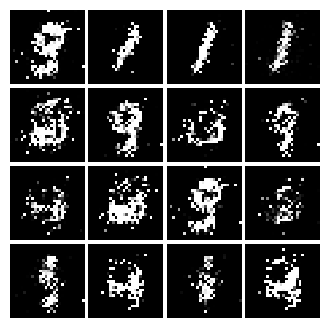

Epoch: 3, Iter: 1720, D: 0.1222, G:0.2806


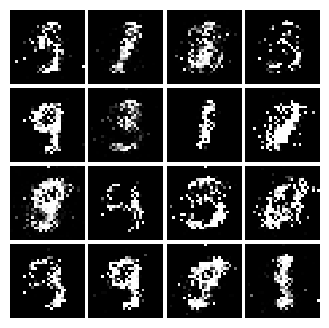

Epoch: 3, Iter: 1740, D: 0.1313, G:0.3745


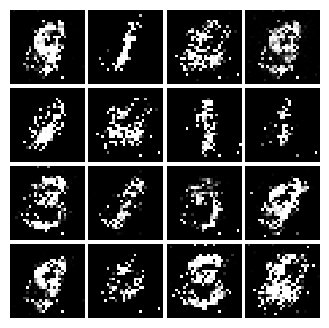

Epoch: 3, Iter: 1760, D: 0.2379, G:0.3923


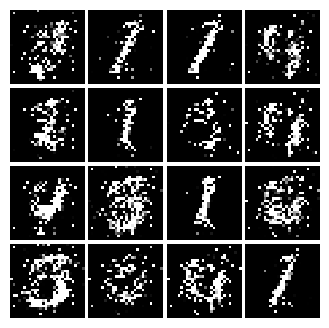

Epoch: 3, Iter: 1780, D: 0.1185, G:0.4609


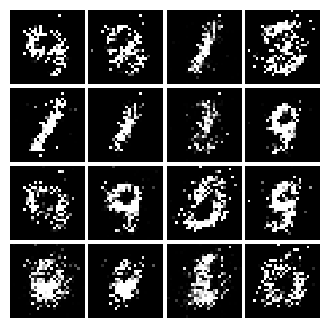

Epoch: 3, Iter: 1800, D: 0.1746, G:0.2724


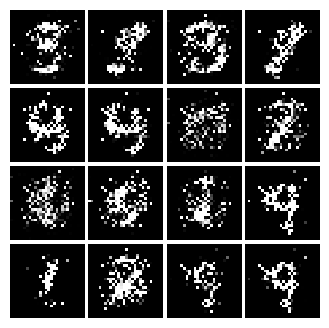

Epoch: 3, Iter: 1820, D: 0.1551, G:0.3156


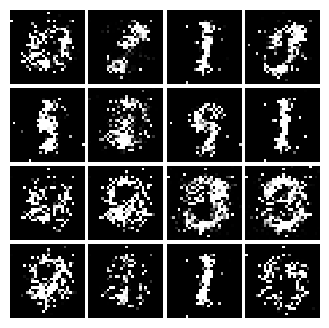

Epoch: 3, Iter: 1840, D: 0.1555, G:0.2383


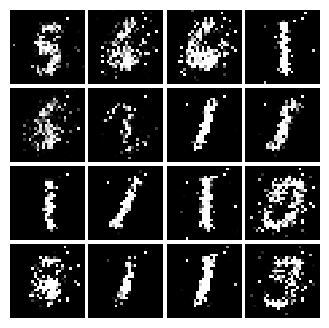

Epoch: 3, Iter: 1860, D: 0.1568, G:0.4076


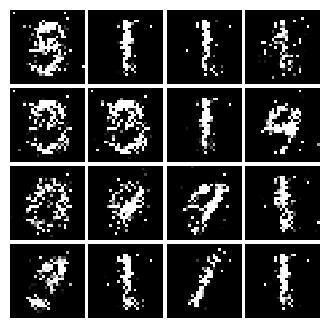

Epoch: 4, Iter: 1880, D: 0.1256, G:0.3333


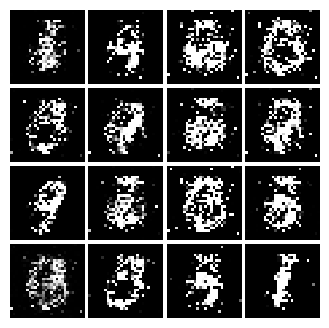

Epoch: 4, Iter: 1900, D: 0.1381, G:0.3106


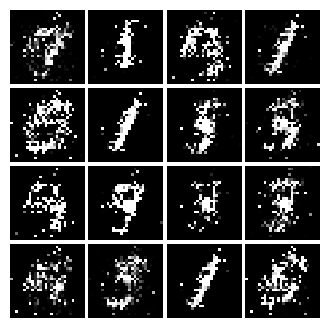

Epoch: 4, Iter: 1920, D: 0.1229, G:0.4747


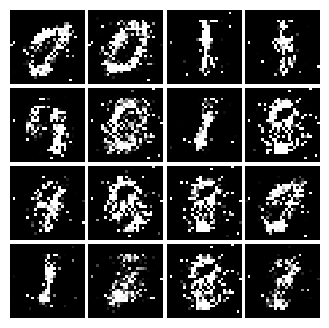

Epoch: 4, Iter: 1940, D: 0.1402, G:0.2664


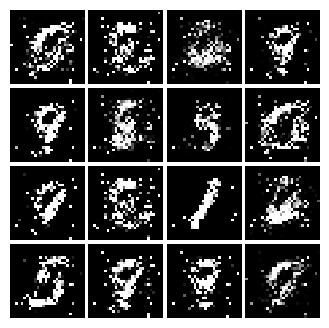

Epoch: 4, Iter: 1960, D: 0.1348, G:0.309


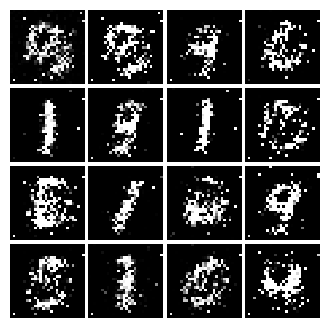

Epoch: 4, Iter: 1980, D: 0.4729, G:0.2304


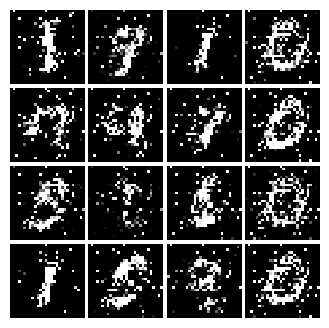

Epoch: 4, Iter: 2000, D: 0.1527, G:0.3839


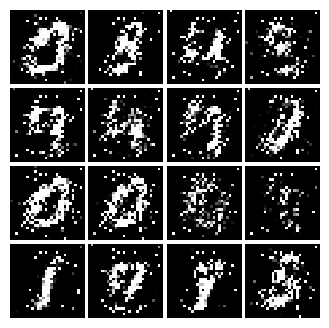

Epoch: 4, Iter: 2020, D: 0.1531, G:0.2616


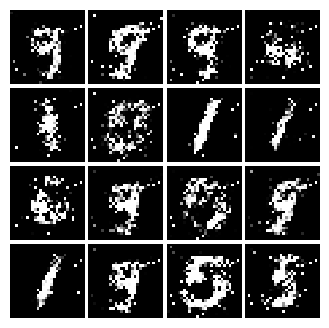

Epoch: 4, Iter: 2040, D: 0.17, G:0.2064


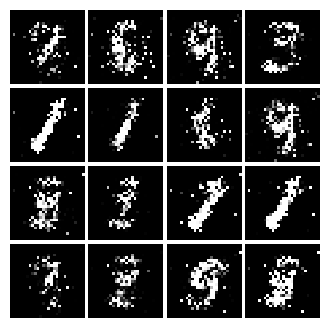

Epoch: 4, Iter: 2060, D: 0.1857, G:0.2512


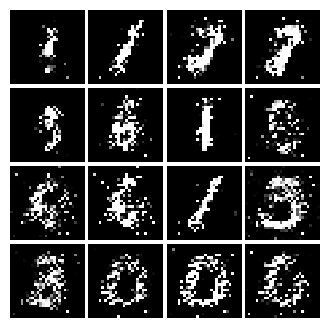

Epoch: 4, Iter: 2080, D: 0.1931, G:0.2138


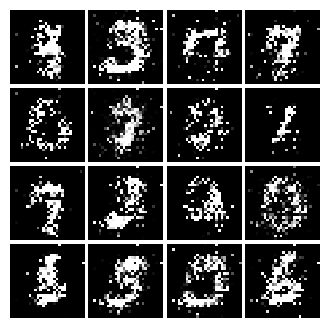

Epoch: 4, Iter: 2100, D: 0.1612, G:0.2354


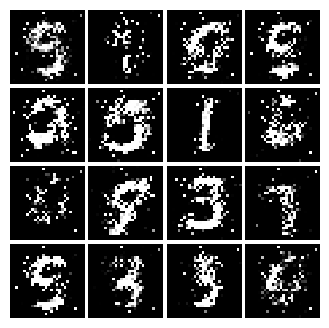

Epoch: 4, Iter: 2120, D: 0.1606, G:0.2779


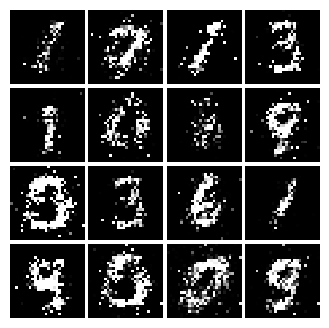

Epoch: 4, Iter: 2140, D: 0.1807, G:0.2735


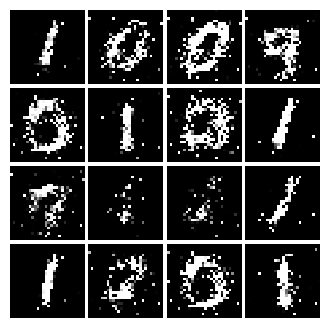

Epoch: 4, Iter: 2160, D: 0.1767, G:0.198


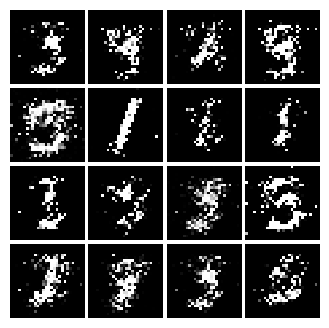

Epoch: 4, Iter: 2180, D: 0.1628, G:0.238


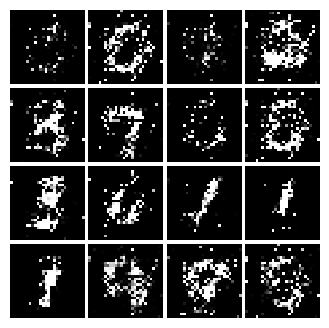

Epoch: 4, Iter: 2200, D: 0.1653, G:0.2555


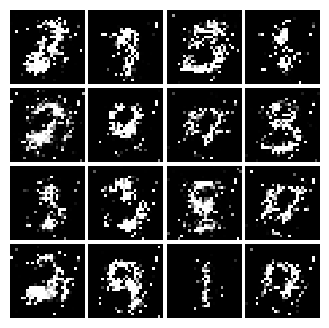

Epoch: 4, Iter: 2220, D: 0.1545, G:0.2195


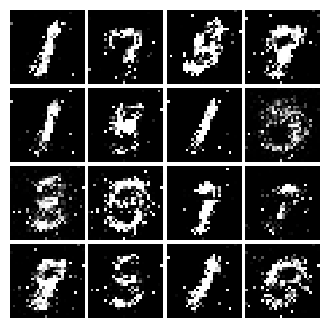

Epoch: 4, Iter: 2240, D: 0.1644, G:0.2805


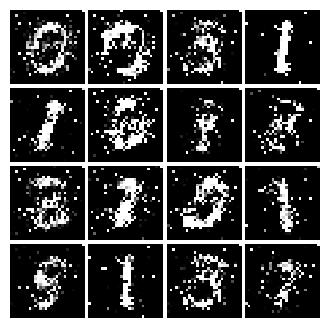

Epoch: 4, Iter: 2260, D: 0.1467, G:0.316


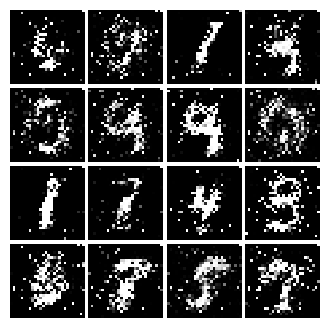

Epoch: 4, Iter: 2280, D: 0.1688, G:0.3078


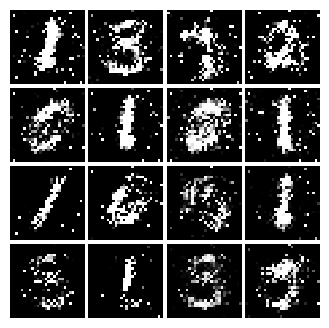

Epoch: 4, Iter: 2300, D: 0.1359, G:0.4952


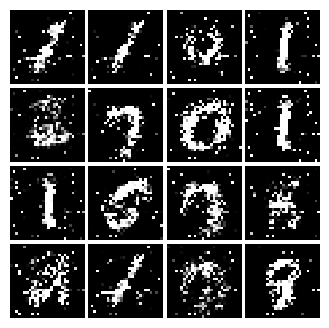

Epoch: 4, Iter: 2320, D: 0.1786, G:0.276


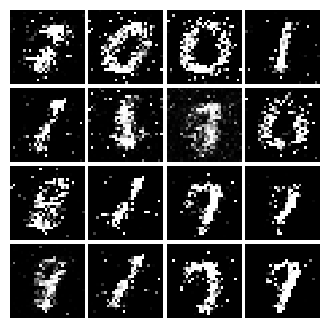

Epoch: 4, Iter: 2340, D: 0.1571, G:0.304


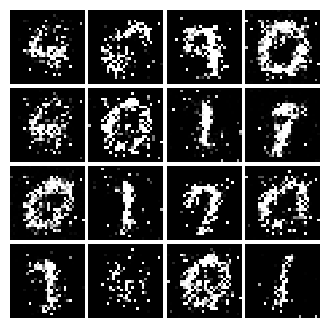

Epoch: 5, Iter: 2360, D: 0.2021, G:0.1897


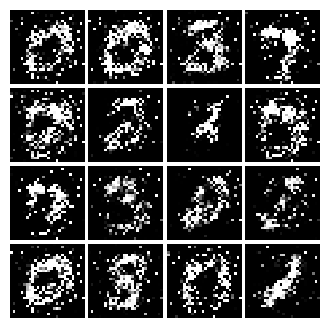

Epoch: 5, Iter: 2380, D: 0.1919, G:0.2217


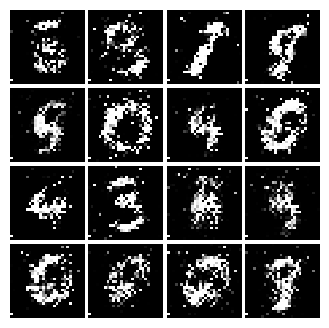

Epoch: 5, Iter: 2400, D: 0.16, G:0.3458


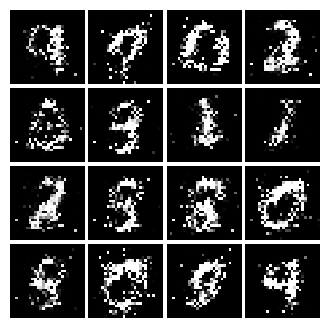

Epoch: 5, Iter: 2420, D: 0.1934, G:0.2061


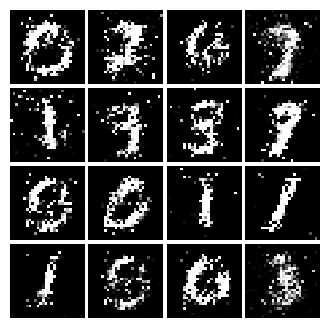

Epoch: 5, Iter: 2440, D: 0.2189, G:0.2103


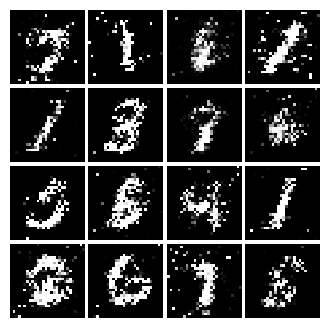

Epoch: 5, Iter: 2460, D: 0.2015, G:0.09738


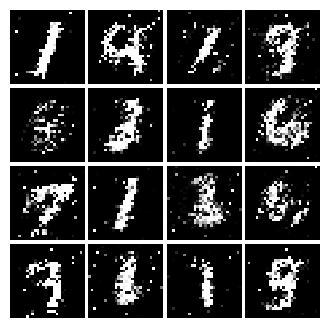

Epoch: 5, Iter: 2480, D: 0.1738, G:0.2754


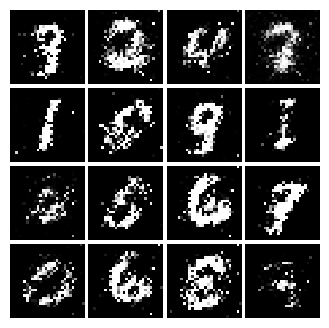

Epoch: 5, Iter: 2500, D: 0.1934, G:0.2379


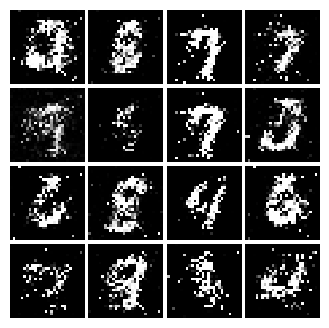

Epoch: 5, Iter: 2520, D: 0.249, G:0.1923


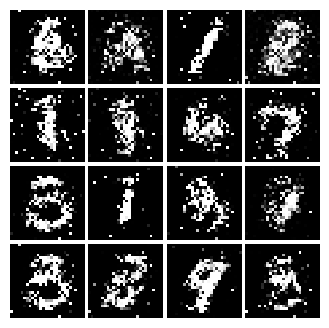

Epoch: 5, Iter: 2540, D: 0.2132, G:0.2203


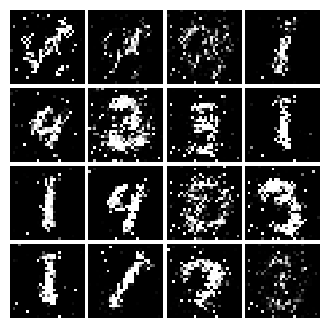

Epoch: 5, Iter: 2560, D: 0.2281, G:0.2715


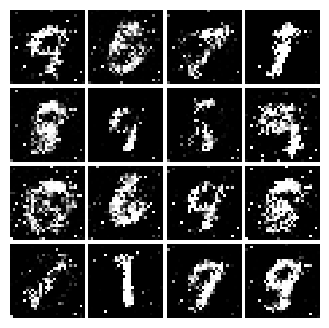

Epoch: 5, Iter: 2580, D: 0.215, G:0.2112


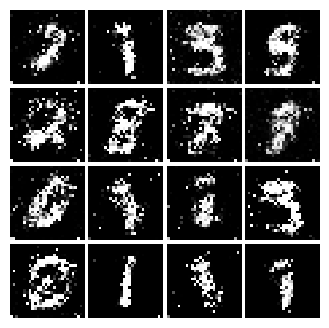

Epoch: 5, Iter: 2600, D: 0.2635, G:0.1508


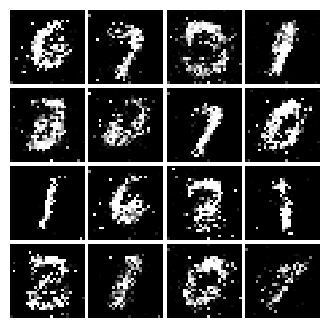

Epoch: 5, Iter: 2620, D: 0.2046, G:0.2085


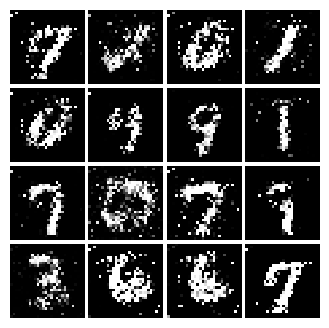

Epoch: 5, Iter: 2640, D: 0.2245, G:0.1526


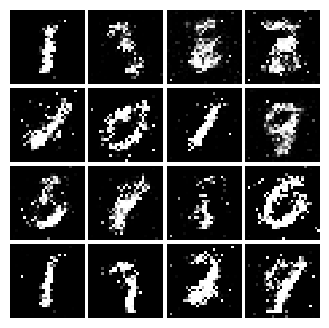

Epoch: 5, Iter: 2660, D: 0.2122, G:0.208


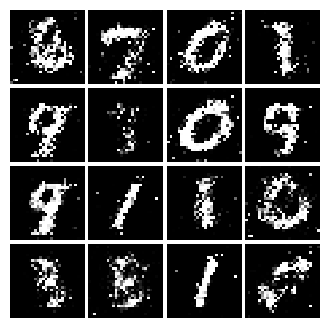

Epoch: 5, Iter: 2680, D: 0.236, G:0.1869


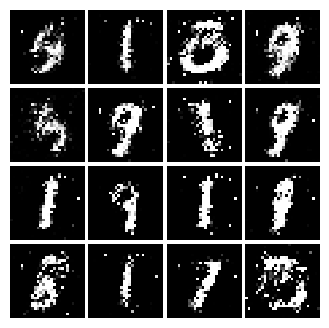

Epoch: 5, Iter: 2700, D: 0.241, G:0.1693


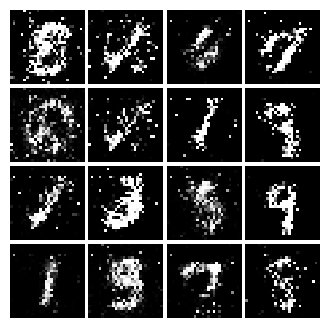

Epoch: 5, Iter: 2720, D: 0.2291, G:0.1425


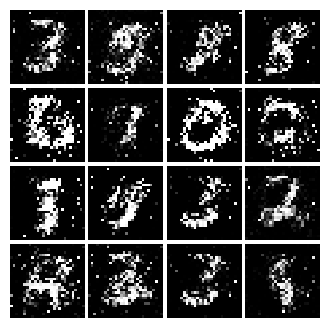

Epoch: 5, Iter: 2740, D: 0.2206, G:0.169


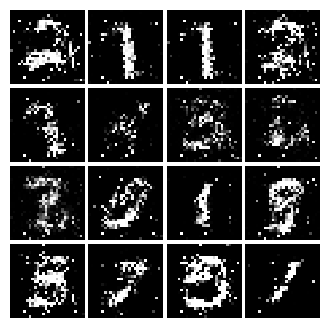

Epoch: 5, Iter: 2760, D: 0.2097, G:0.1877


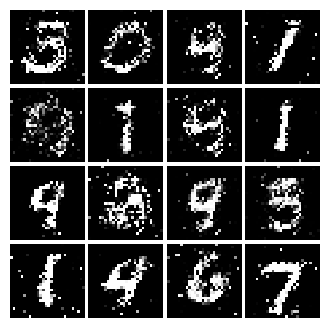

Epoch: 5, Iter: 2780, D: 0.2176, G:0.2211


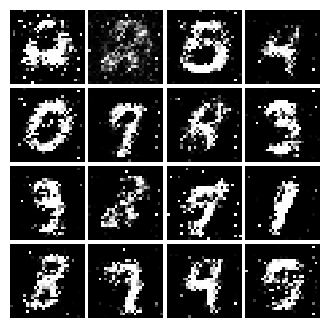

Epoch: 5, Iter: 2800, D: 0.1986, G:0.1822


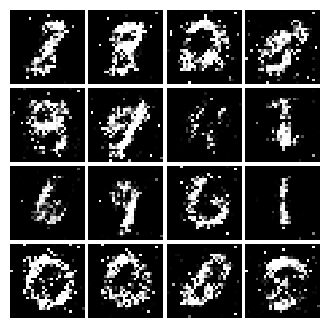

Epoch: 6, Iter: 2820, D: 0.189, G:0.1802


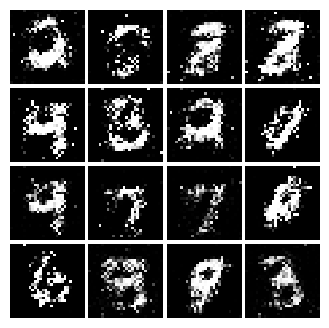

Epoch: 6, Iter: 2840, D: 0.2179, G:0.2127


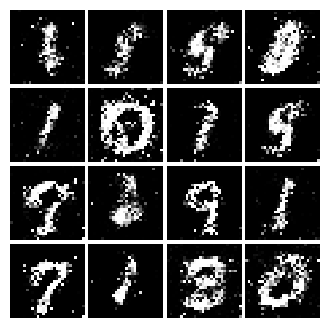

Epoch: 6, Iter: 2860, D: 0.2019, G:0.2024


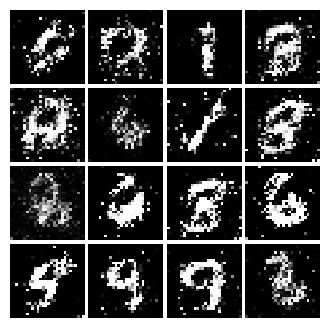

Epoch: 6, Iter: 2880, D: 0.1908, G:0.2082


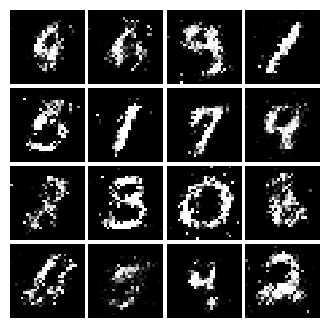

Epoch: 6, Iter: 2900, D: 0.2381, G:0.1794


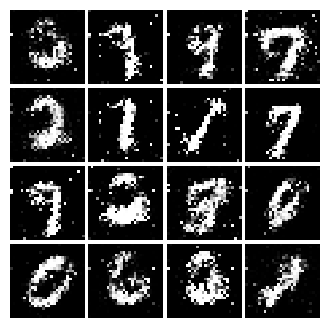

Epoch: 6, Iter: 2920, D: 0.2286, G:0.2002


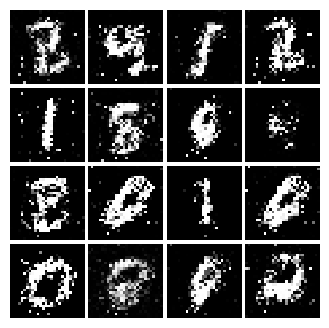

Epoch: 6, Iter: 2940, D: 0.2105, G:0.2002


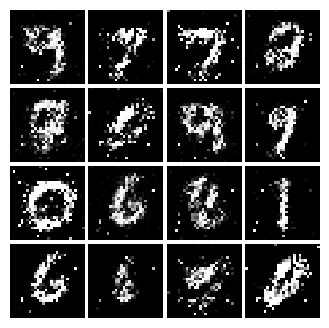

Epoch: 6, Iter: 2960, D: 0.2004, G:0.2442


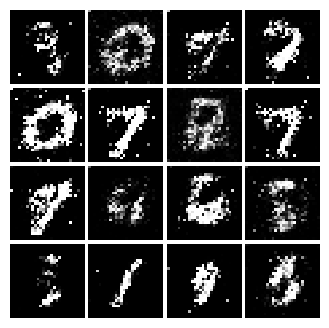

Epoch: 6, Iter: 2980, D: 0.2413, G:0.1481


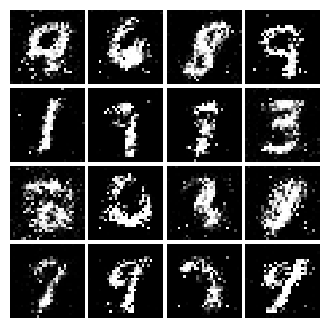

Epoch: 6, Iter: 3000, D: 0.2359, G:0.1807


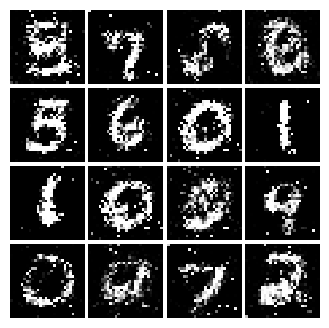

Epoch: 6, Iter: 3020, D: 0.1999, G:0.1931


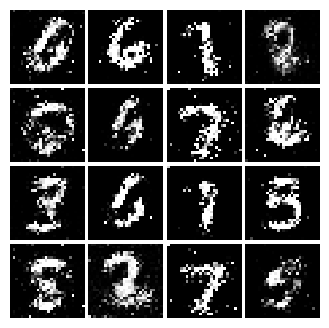

Epoch: 6, Iter: 3040, D: 0.2241, G:0.1701


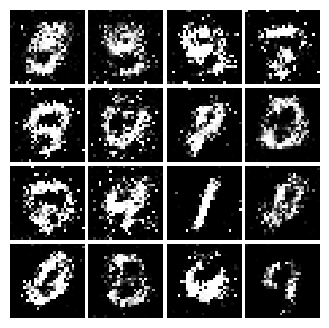

Epoch: 6, Iter: 3060, D: 0.2041, G:0.1657


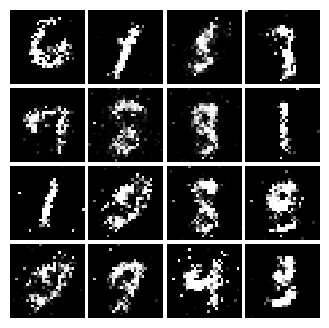

Epoch: 6, Iter: 3080, D: 0.2462, G:0.2363


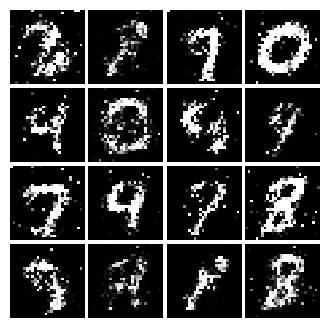

Epoch: 6, Iter: 3100, D: 0.2085, G:0.2026


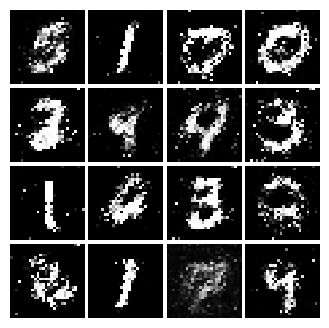

Epoch: 6, Iter: 3120, D: 0.218, G:0.1743


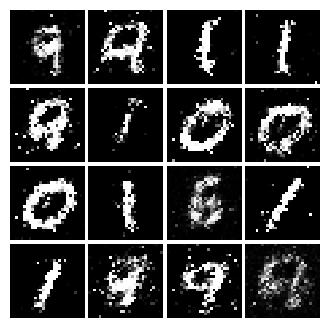

Epoch: 6, Iter: 3140, D: 0.2222, G:0.1931


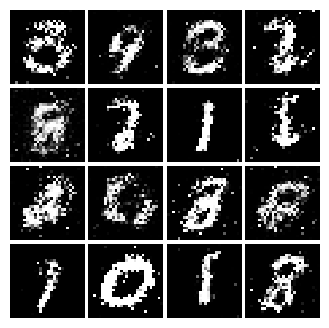

Epoch: 6, Iter: 3160, D: 0.2096, G:0.2023


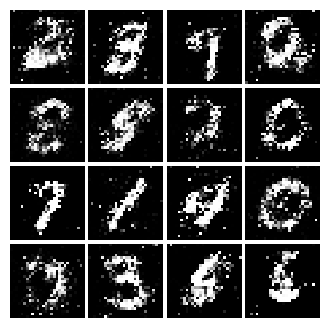

Epoch: 6, Iter: 3180, D: 0.2324, G:0.1866


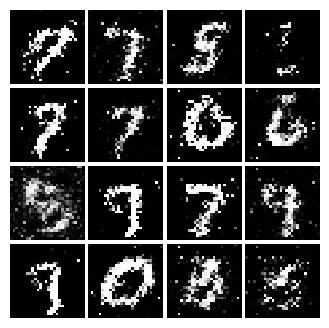

Epoch: 6, Iter: 3200, D: 0.2161, G:0.1916


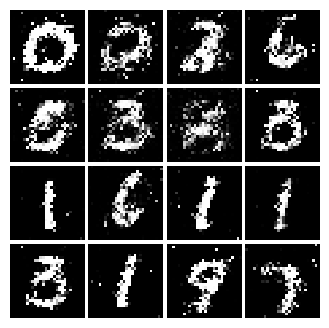

Epoch: 6, Iter: 3220, D: 0.2199, G:0.2219


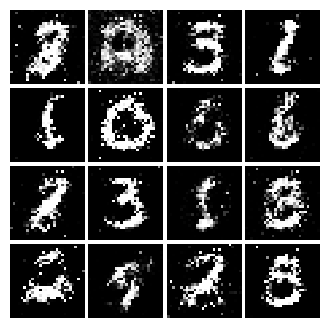

Epoch: 6, Iter: 3240, D: 0.2012, G:0.182


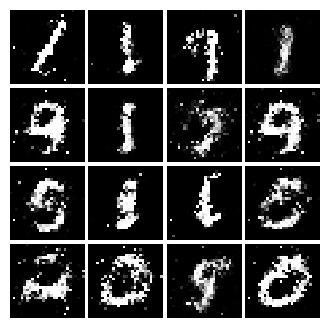

Epoch: 6, Iter: 3260, D: 0.2285, G:0.2139


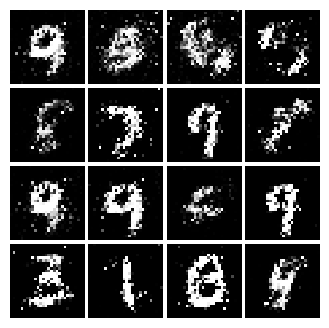

Epoch: 6, Iter: 3280, D: 0.2219, G:0.1757


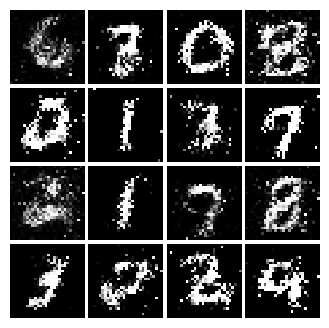

Epoch: 7, Iter: 3300, D: 0.216, G:0.2208


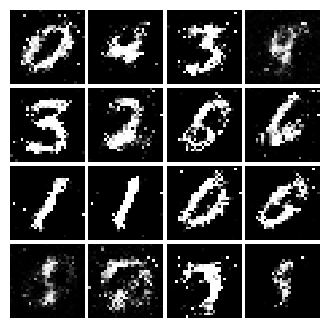

Epoch: 7, Iter: 3320, D: 0.213, G:0.2025


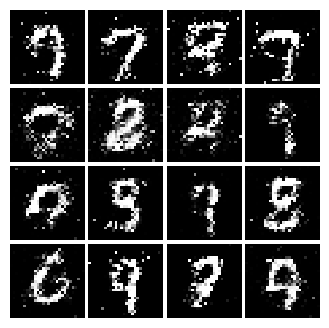

Epoch: 7, Iter: 3340, D: 0.2414, G:0.1833


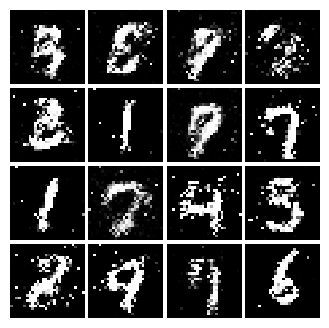

Epoch: 7, Iter: 3360, D: 0.232, G:0.1552


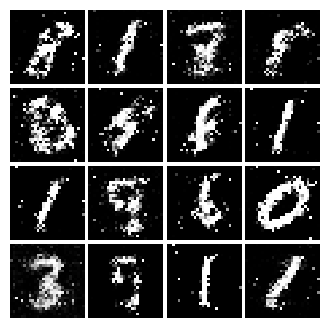

Epoch: 7, Iter: 3380, D: 0.2343, G:0.1844


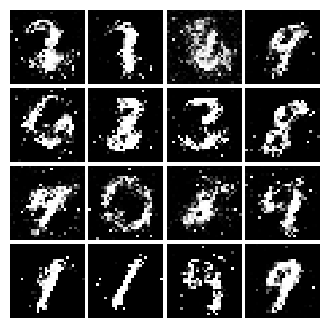

Epoch: 7, Iter: 3400, D: 0.2473, G:0.159


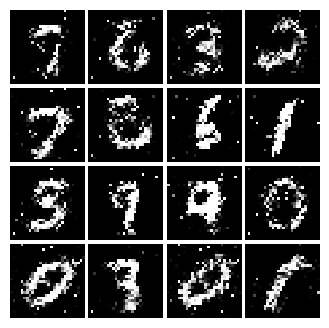

Epoch: 7, Iter: 3420, D: 0.2486, G:0.1946


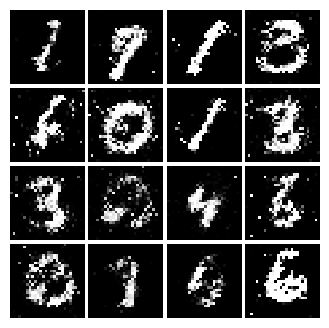

Epoch: 7, Iter: 3440, D: 0.2277, G:0.1981


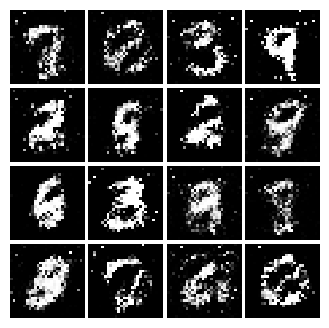

Epoch: 7, Iter: 3460, D: 0.2195, G:0.2076


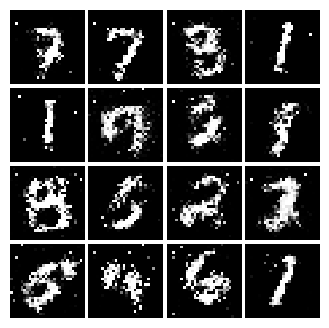

Epoch: 7, Iter: 3480, D: 0.2292, G:0.1478


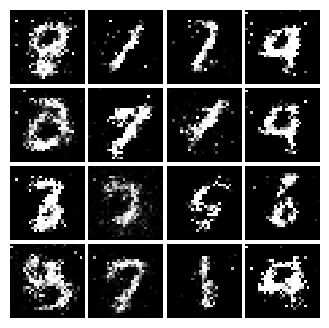

Epoch: 7, Iter: 3500, D: 0.2096, G:0.1669


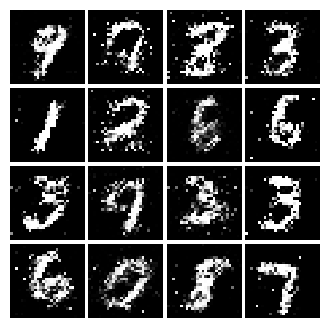

Epoch: 7, Iter: 3520, D: 0.2262, G:0.1777


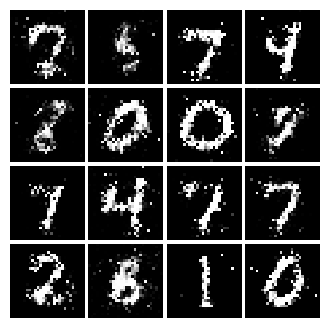

Epoch: 7, Iter: 3540, D: 0.2205, G:0.2067


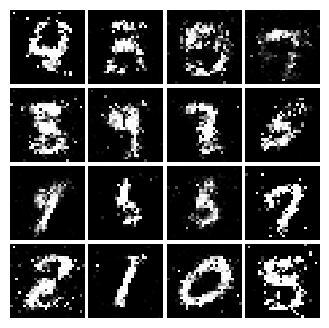

Epoch: 7, Iter: 3560, D: 0.2285, G:0.19


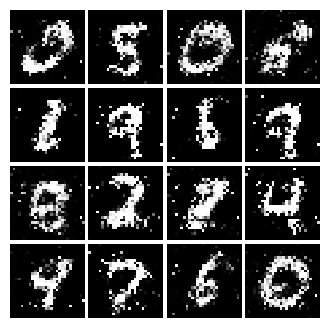

Epoch: 7, Iter: 3580, D: 0.2226, G:0.1675


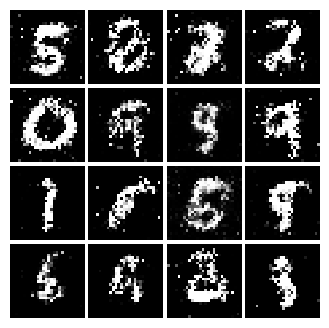

Epoch: 7, Iter: 3600, D: 0.2253, G:0.1676


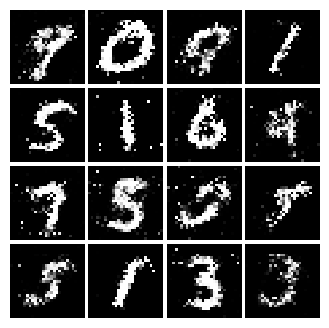

Epoch: 7, Iter: 3620, D: 0.2331, G:0.1574


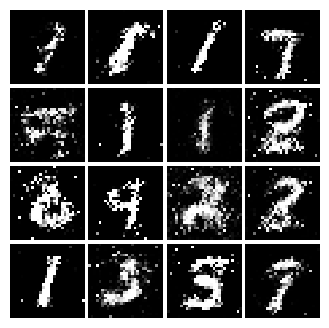

Epoch: 7, Iter: 3640, D: 0.2166, G:0.1731


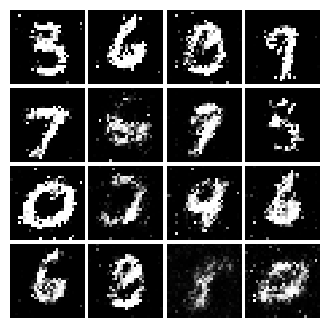

Epoch: 7, Iter: 3660, D: 0.2111, G:0.1796


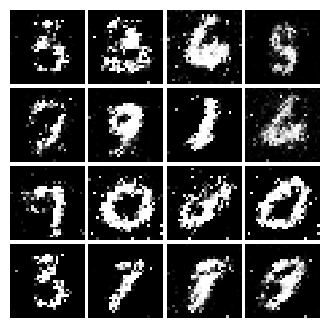

Epoch: 7, Iter: 3680, D: 0.2121, G:0.1682


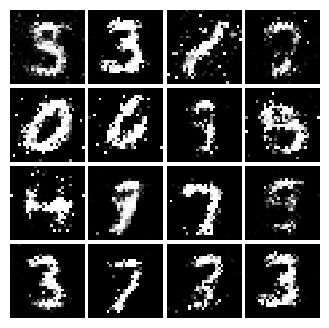

Epoch: 7, Iter: 3700, D: 0.2237, G:0.1535


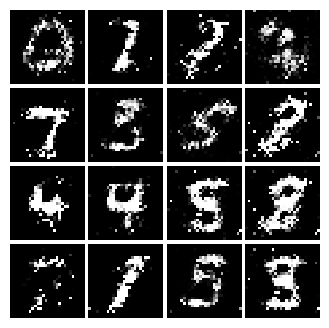

Epoch: 7, Iter: 3720, D: 0.2013, G:0.1934


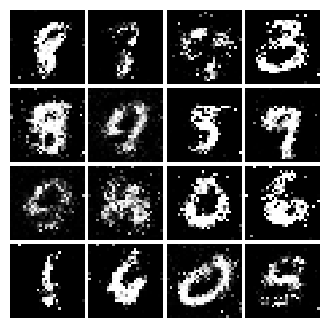

Epoch: 7, Iter: 3740, D: 0.2509, G:0.1517


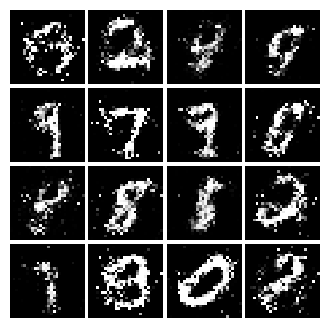

Epoch: 8, Iter: 3760, D: 0.231, G:0.1696


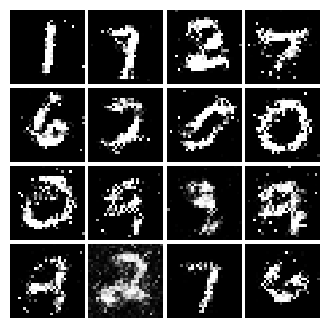

Epoch: 8, Iter: 3780, D: 0.2449, G:0.1774


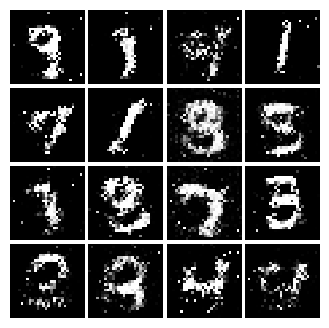

Epoch: 8, Iter: 3800, D: 0.2434, G:0.1449


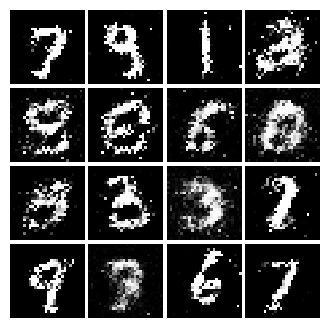

Epoch: 8, Iter: 3820, D: 0.2139, G:0.1777


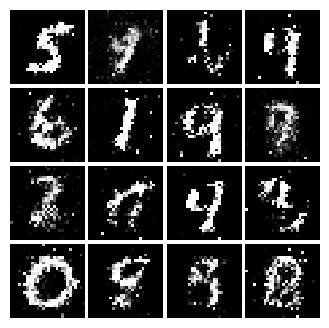

Epoch: 8, Iter: 3840, D: 0.2142, G:0.1606


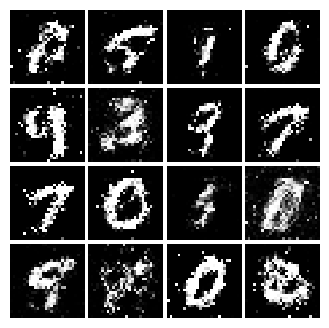

Epoch: 8, Iter: 3860, D: 0.2147, G:0.1796


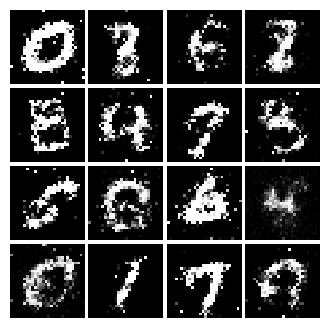

Epoch: 8, Iter: 3880, D: 0.2215, G:0.1875


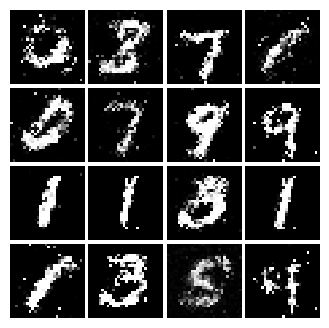

Epoch: 8, Iter: 3900, D: 0.2332, G:0.1937


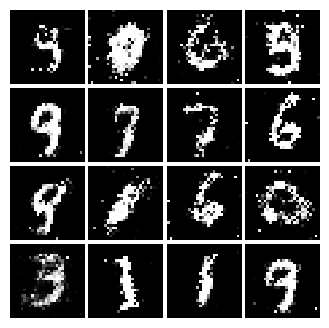

Epoch: 8, Iter: 3920, D: 0.2178, G:0.1993


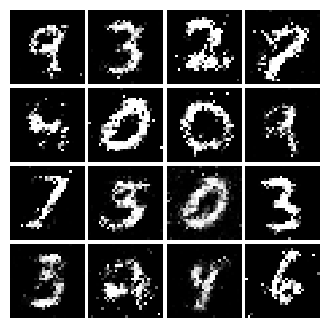

Epoch: 8, Iter: 3940, D: 0.2396, G:0.1499


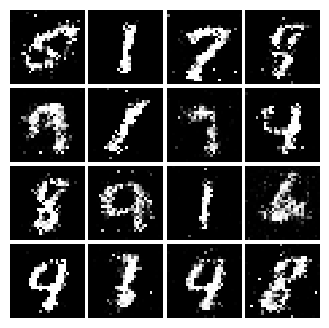

Epoch: 8, Iter: 3960, D: 0.234, G:0.1648


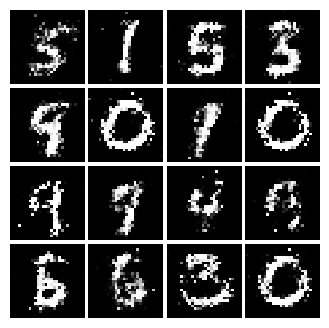

Epoch: 8, Iter: 3980, D: 0.2417, G:0.1673


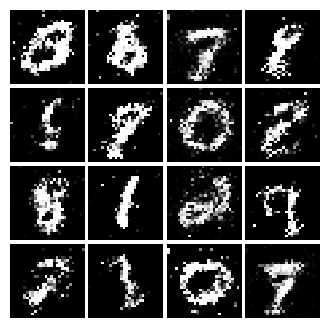

Epoch: 8, Iter: 4000, D: 0.2277, G:0.1742


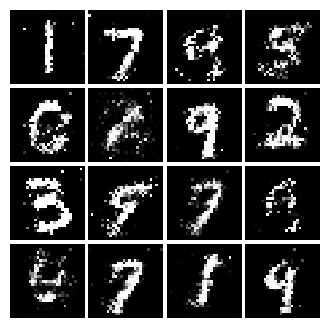

Epoch: 8, Iter: 4020, D: 0.2189, G:0.1603


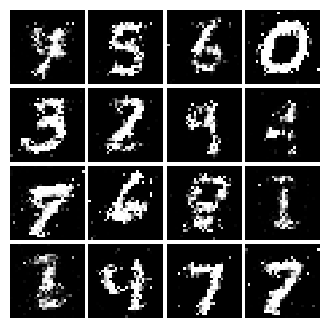

Epoch: 8, Iter: 4040, D: 0.2318, G:0.1731


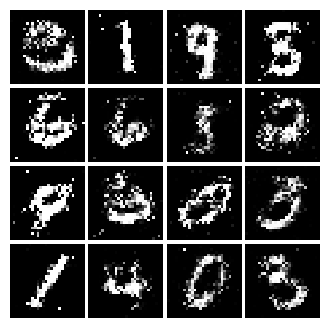

Epoch: 8, Iter: 4060, D: 0.2362, G:0.1541


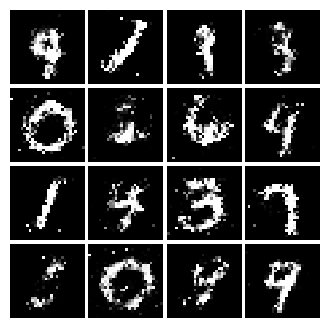

Epoch: 8, Iter: 4080, D: 0.2507, G:0.1377


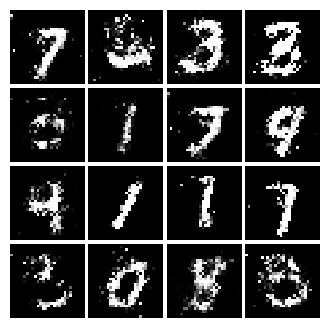

Epoch: 8, Iter: 4100, D: 0.227, G:0.1654


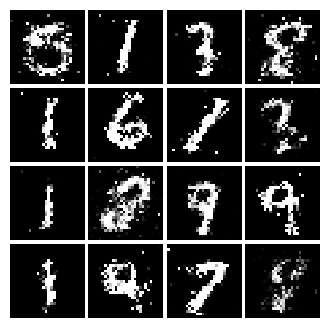

Epoch: 8, Iter: 4120, D: 0.2301, G:0.1832


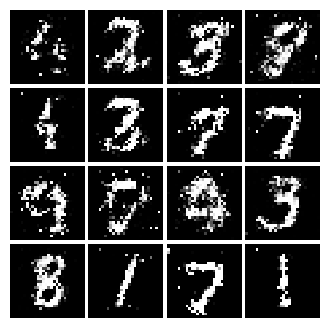

Epoch: 8, Iter: 4140, D: 0.262, G:0.1972


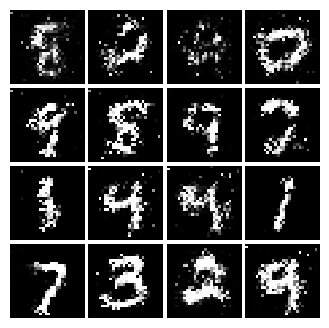

Epoch: 8, Iter: 4160, D: 0.2423, G:0.1664


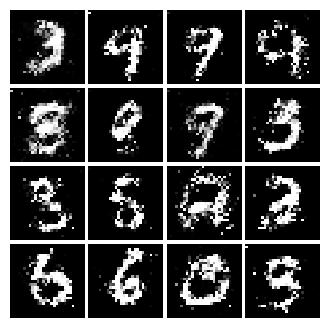

Epoch: 8, Iter: 4180, D: 0.2499, G:0.1829


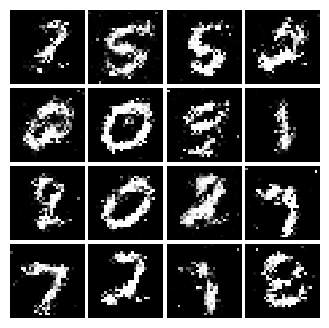

Epoch: 8, Iter: 4200, D: 0.2347, G:0.1847


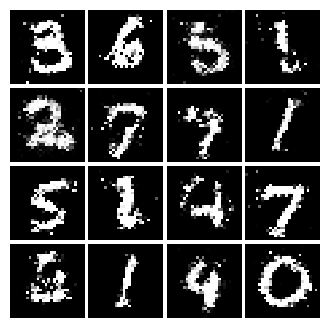

Epoch: 8, Iter: 4220, D: 0.2608, G:0.1738


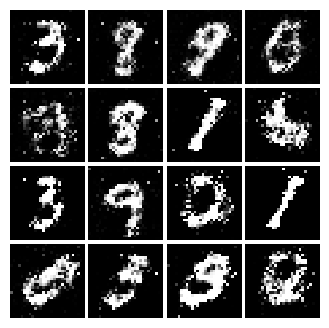

Epoch: 9, Iter: 4240, D: 0.2445, G:0.1776


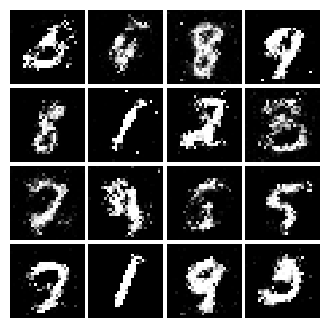

Epoch: 9, Iter: 4260, D: 0.2297, G:0.1668


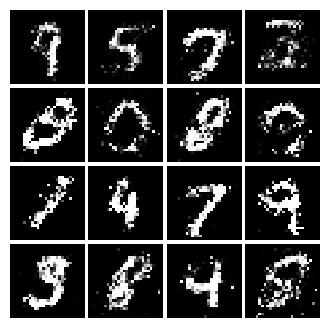

Epoch: 9, Iter: 4280, D: 0.2303, G:0.1898


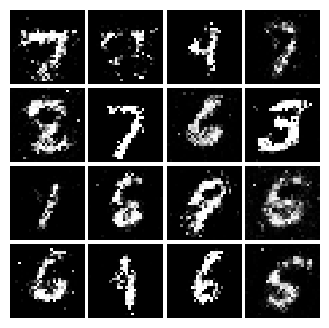

Epoch: 9, Iter: 4300, D: 0.2622, G:0.1583


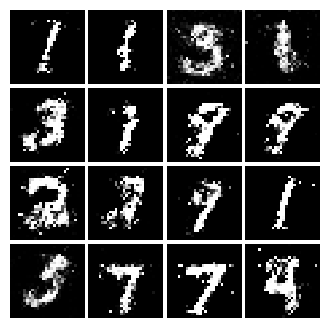

Epoch: 9, Iter: 4320, D: 0.2409, G:0.1622


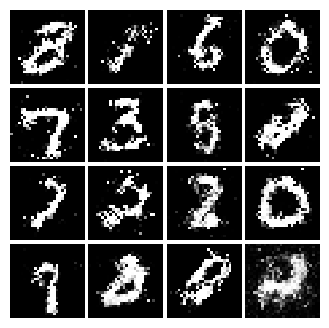

Epoch: 9, Iter: 4340, D: 0.2421, G:0.1752


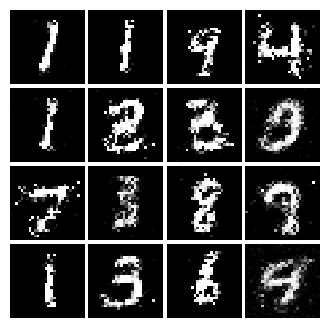

Epoch: 9, Iter: 4360, D: 0.234, G:0.1675


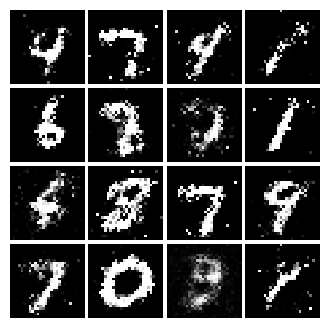

Epoch: 9, Iter: 4380, D: 0.2427, G:0.1673


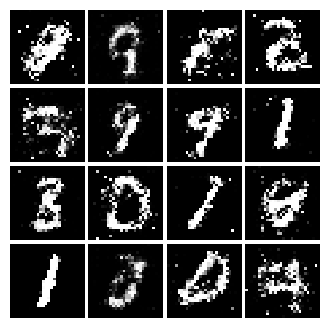

Epoch: 9, Iter: 4400, D: 0.211, G:0.1657


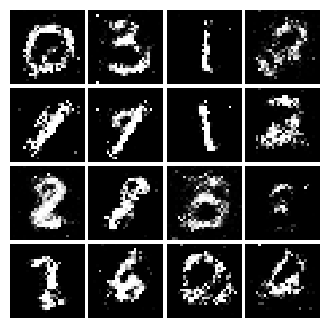

Epoch: 9, Iter: 4420, D: 0.2388, G:0.1615


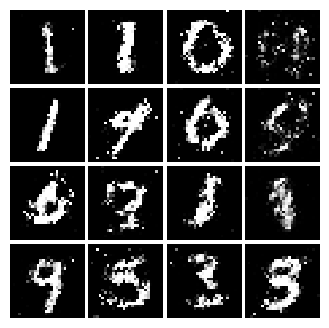

Epoch: 9, Iter: 4440, D: 0.2302, G:0.179


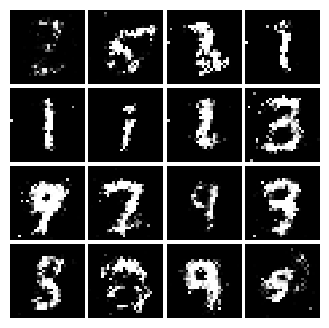

Epoch: 9, Iter: 4460, D: 0.2215, G:0.1674


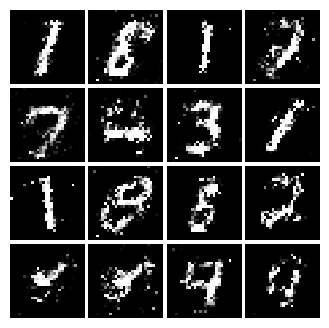

Epoch: 9, Iter: 4480, D: 0.2264, G:0.1612


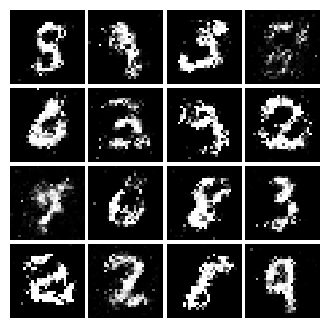

Epoch: 9, Iter: 4500, D: 0.2271, G:0.169


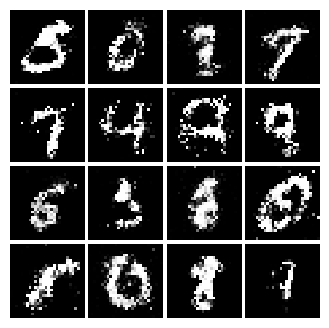

Epoch: 9, Iter: 4520, D: 0.2325, G:0.1761


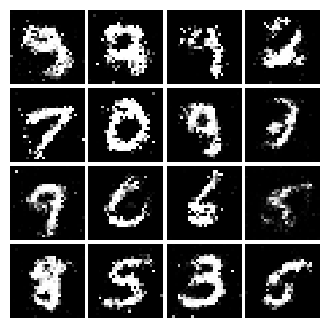

Epoch: 9, Iter: 4540, D: 0.2336, G:0.1615


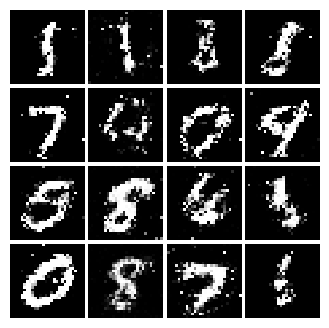

Epoch: 9, Iter: 4560, D: 0.2276, G:0.1766


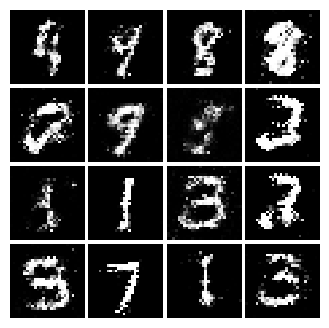

Epoch: 9, Iter: 4580, D: 0.224, G:0.1461


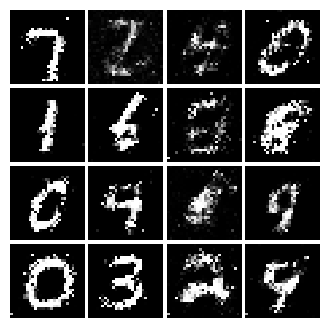

Epoch: 9, Iter: 4600, D: 0.2441, G:0.1531


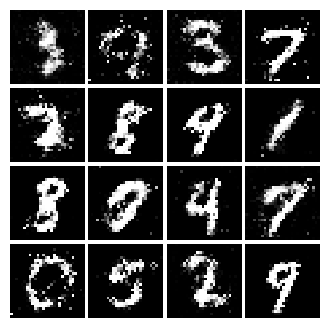

Epoch: 9, Iter: 4620, D: 0.241, G:0.18


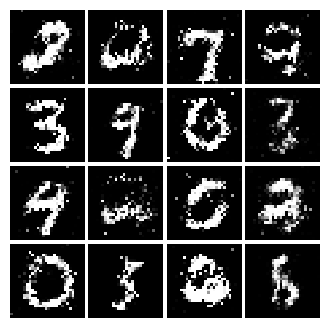

Epoch: 9, Iter: 4640, D: 0.223, G:0.1582


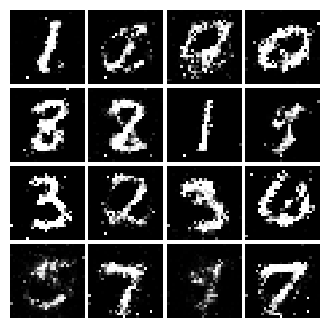

Epoch: 9, Iter: 4660, D: 0.2466, G:0.1957


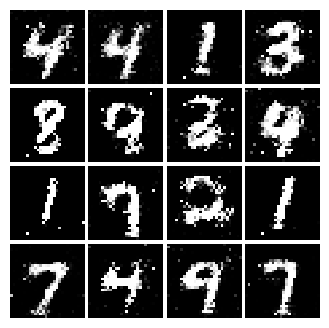

Epoch: 9, Iter: 4680, D: 0.2438, G:0.142


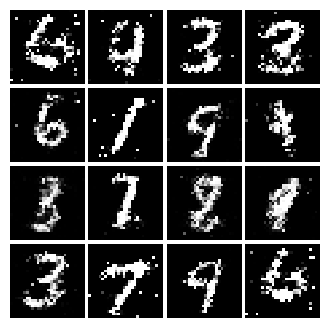

Final images


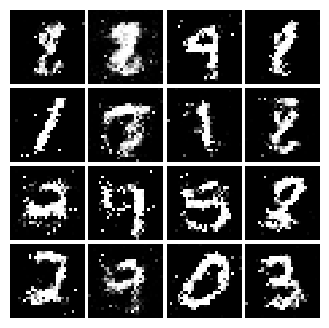

In [22]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, ls_generator_loss)

# Part II - Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [23]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        ###############################################################
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ###############################################################

        # reshape the flattened input into the image format
        tf.keras.layers.Reshape((28, 28, 1), input_shape = (784,)),

        # Conv2D Layer 1
        tf.keras.layers.Conv2D(32, kernel_size = 5, strides = 1, padding = 'valid', use_bias = True),
        tf.keras.layers.LeakyReLU(alpha = 0.01),
        tf.keras.layers.MaxPooling2D(pool_size = 2, strides = 2),

        # Conv2D Layer 2
        tf.keras.layers.Conv2D(64, kernel_size = 5, strides = 1, padding = 'valid', use_bias = True),
        tf.keras.layers.LeakyReLU(alpha = 0.01),
        tf.keras.layers.MaxPooling2D(pool_size = 2, strides = 2),

        # Flatten the convolution output
        tf.keras.layers.Flatten(),

        # Fully Connected Layer
        tf.keras.layers.Dense(4*4*64, use_bias = True),
        tf.keras.layers.LeakyReLU(alpha = 0.01),

        # Final Fully Connected Layer to output the discriminator score
        tf.keras.layers.Dense(1, use_bias = True)

        #############################################################
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #############################################################
    ])

    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [29]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        ###############################################################
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ###############################################################

        # Fully connected layer
        tf.keras.layers.Dense(1024, use_bias = True, input_shape = (noise_dim,)),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),

        # Fully connected layer
        tf.keras.layers.Dense(7*7*128, use_bias = True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),

        # Reshape into Image Tensor of size 7, 7, 128
        tf.keras.layers.Reshape((7, 7, 128)),

        # Conv2DTranspose Layer 1
        tf.keras.layers.Conv2DTranspose(64, kernel_size = 4, strides = 2, padding = 'same', use_bias = True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),

        # Conv2DTranspose Layer 2
        tf.keras.layers.Conv2DTranspose(1, kernel_size = 4, strides = 2, padding = 'same', use_bias = True),
        tf.keras.layers.Activation('tanh'),

        # Flatten the output to match the MNIST data shape [batch_size, 784]
        tf.keras.layers.Flatten()

        #############################################################
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #############################################################
        ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.453, G:0.6442


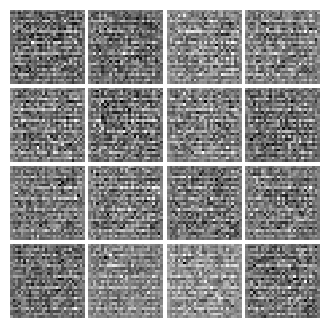

Epoch: 0, Iter: 20, D: 0.3731, G:1.51


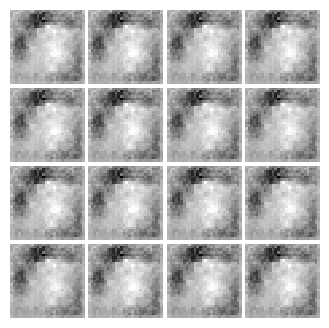

Epoch: 0, Iter: 40, D: 0.3706, G:1.615


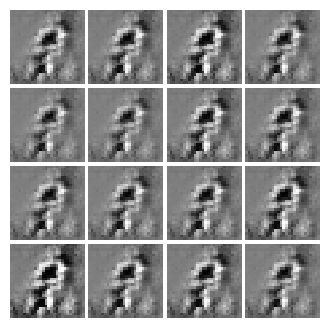

Epoch: 0, Iter: 60, D: 0.6961, G:2.079


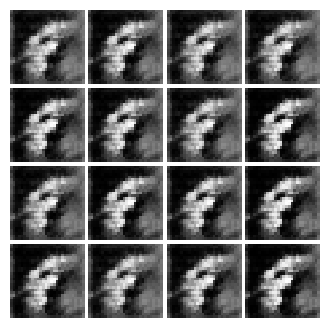

Epoch: 0, Iter: 80, D: 3.4, G:2.913


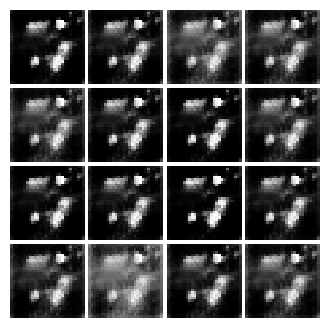

Epoch: 0, Iter: 100, D: 0.4622, G:2.107


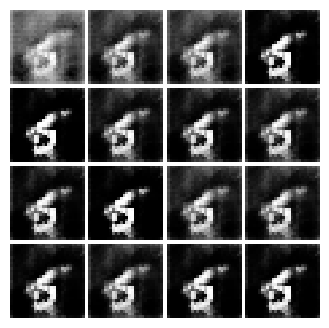

Epoch: 0, Iter: 120, D: 1.495, G:14.08


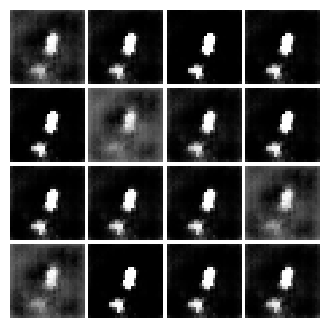

Epoch: 0, Iter: 140, D: 0.1103, G:3.964


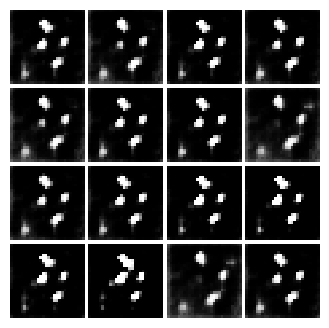

Epoch: 0, Iter: 160, D: 0.936, G:1.497


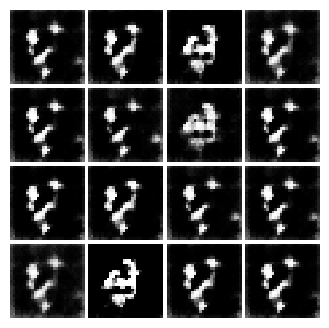

Epoch: 0, Iter: 180, D: 0.7335, G:1.167


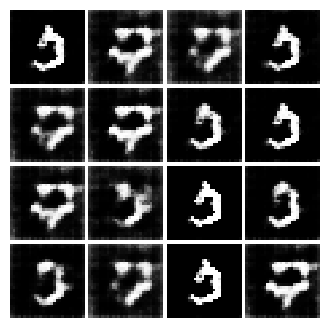

Epoch: 0, Iter: 200, D: 0.7698, G:2.709


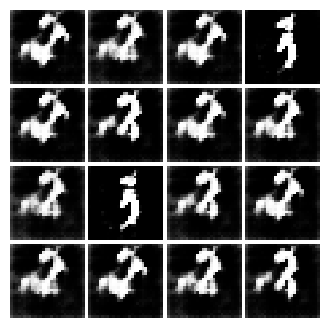

Epoch: 0, Iter: 220, D: 0.1451, G:3.408


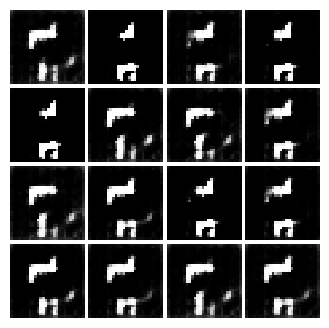

Epoch: 0, Iter: 240, D: 0.675, G:1.856


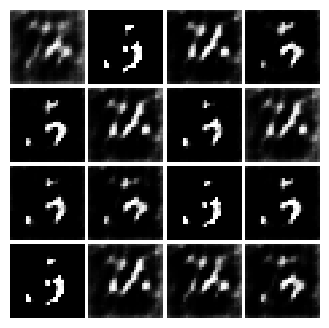

Epoch: 0, Iter: 260, D: 0.7487, G:2.678


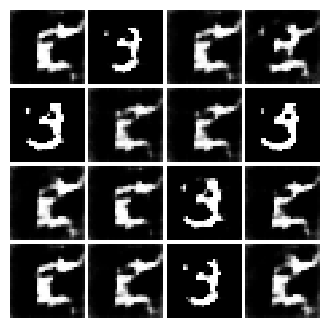

Epoch: 0, Iter: 280, D: 0.5473, G:4.163


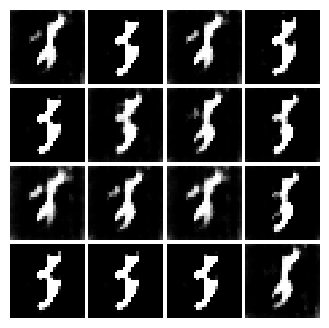

Epoch: 0, Iter: 300, D: 0.2508, G:3.805


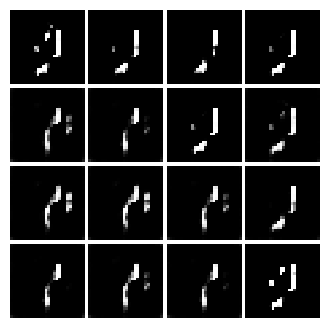

Epoch: 0, Iter: 320, D: 0.2169, G:1.067


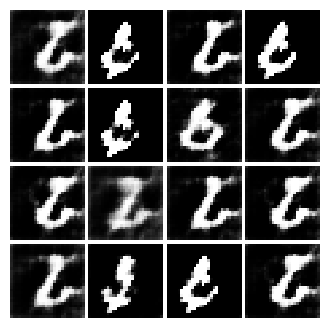

Epoch: 0, Iter: 340, D: 0.6656, G:2.412


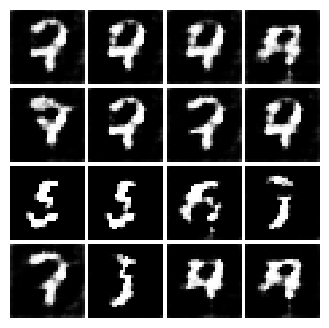

Epoch: 0, Iter: 360, D: 0.6176, G:3.085


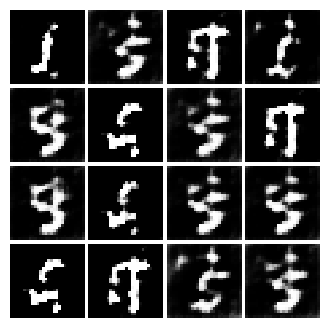

Epoch: 0, Iter: 380, D: 0.4206, G:2.117


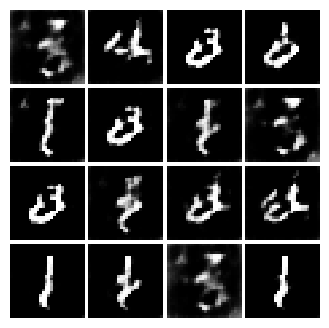

Epoch: 0, Iter: 400, D: 0.9277, G:3.412


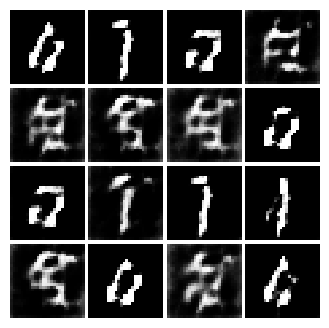

Epoch: 0, Iter: 420, D: 0.5632, G:2.126


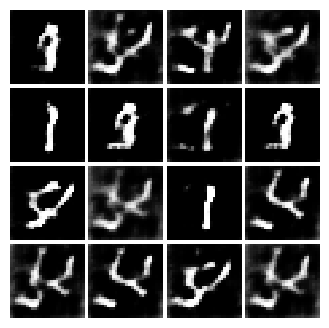

Epoch: 0, Iter: 440, D: 0.5699, G:2.326


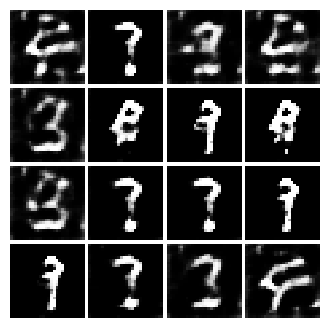

Epoch: 0, Iter: 460, D: 0.3958, G:2.949


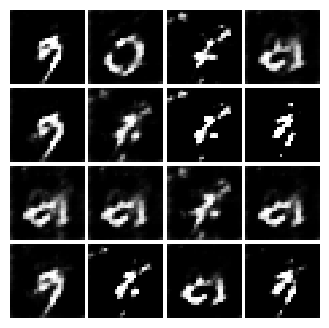

Epoch: 1, Iter: 480, D: 0.5745, G:2.622


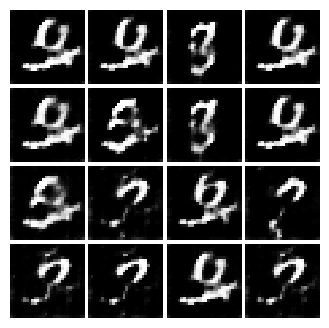

Epoch: 1, Iter: 500, D: 0.5141, G:2.41


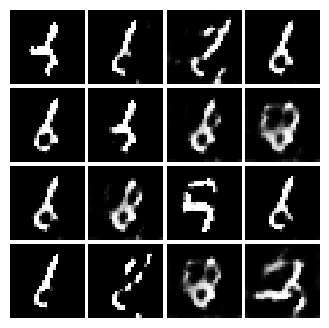

Epoch: 1, Iter: 520, D: 0.3338, G:4.314


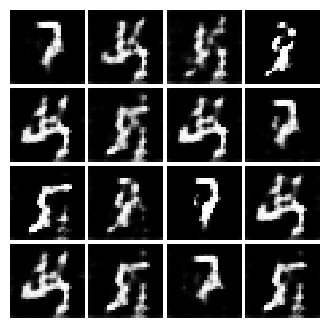

Epoch: 1, Iter: 540, D: 0.7055, G:1.677


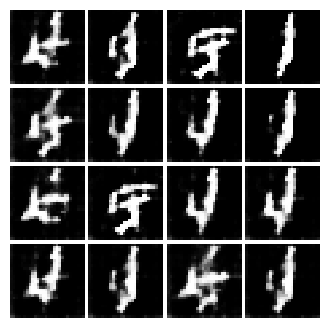

Epoch: 1, Iter: 560, D: 1.009, G:3.105


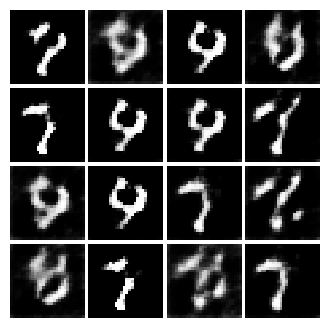

Epoch: 1, Iter: 580, D: 0.6731, G:1.99


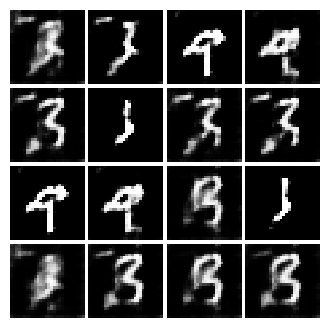

Epoch: 1, Iter: 600, D: 0.6132, G:3.757


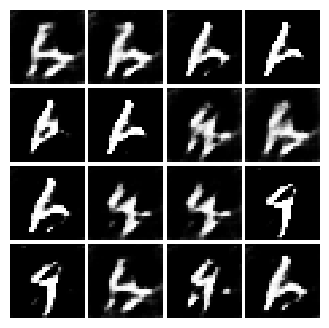

Epoch: 1, Iter: 620, D: 0.4493, G:1.934


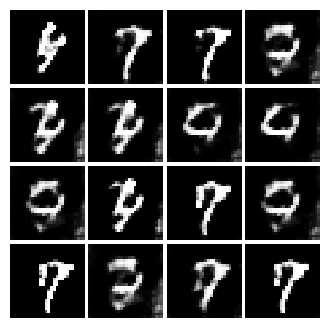

Epoch: 1, Iter: 640, D: 1.725, G:6.296


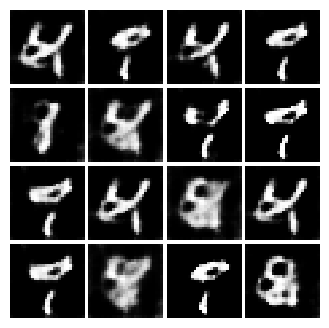

Epoch: 1, Iter: 660, D: 0.4696, G:2.804


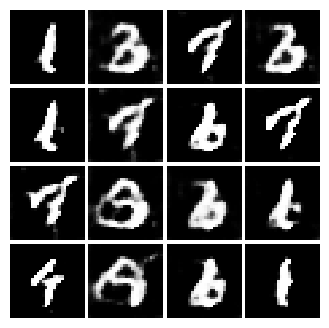

Epoch: 1, Iter: 680, D: 0.5769, G:2.107


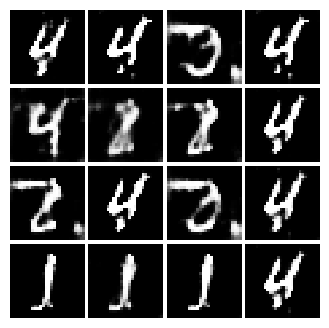

Epoch: 1, Iter: 700, D: 0.4084, G:3.04


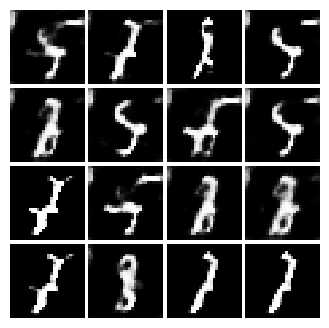

Epoch: 1, Iter: 720, D: 0.386, G:2.817


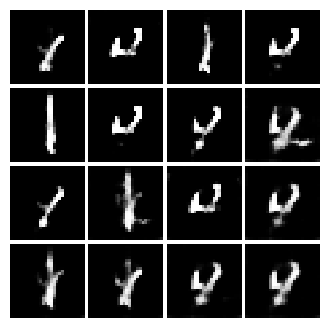

Epoch: 1, Iter: 740, D: 1.308, G:2.651


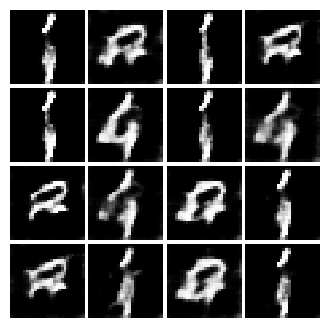

Epoch: 1, Iter: 760, D: 0.5866, G:2.266


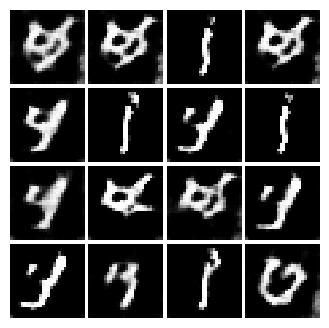

Epoch: 1, Iter: 780, D: 0.4623, G:2.327


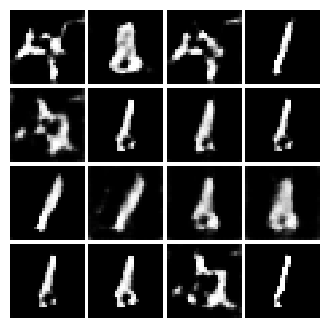

Epoch: 1, Iter: 800, D: 0.6347, G:2.03


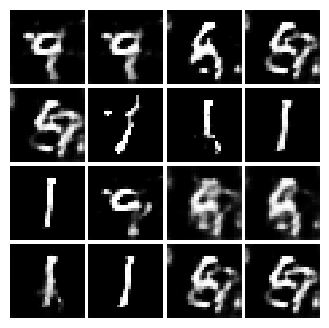

Epoch: 1, Iter: 820, D: 0.467, G:2.266


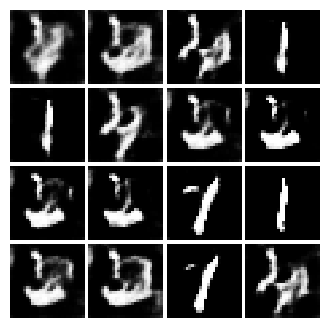

Epoch: 1, Iter: 840, D: 0.4838, G:2.41


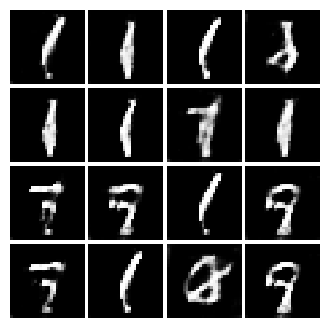

Epoch: 1, Iter: 860, D: 0.4816, G:3.02


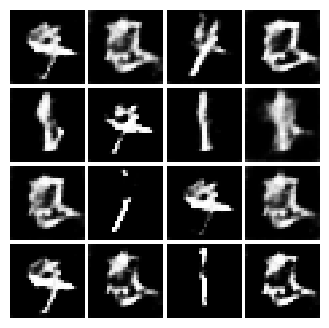

Epoch: 1, Iter: 880, D: 0.3184, G:2.604


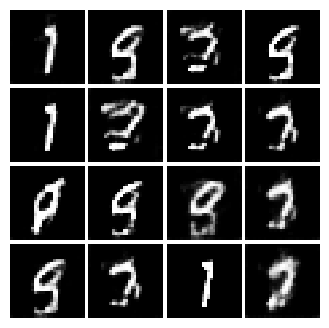

Epoch: 1, Iter: 900, D: 0.3533, G:3.232


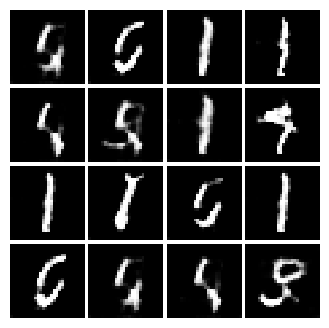

Epoch: 1, Iter: 920, D: 0.5316, G:3.669


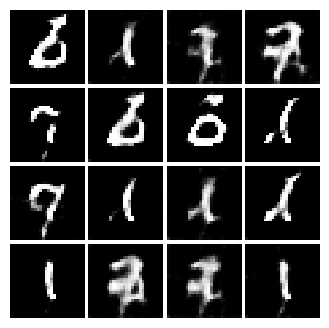

Epoch: 2, Iter: 940, D: 0.3534, G:3.469


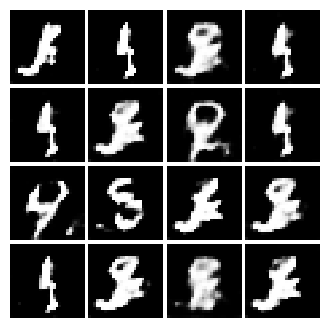

Epoch: 2, Iter: 960, D: 0.3064, G:3.053


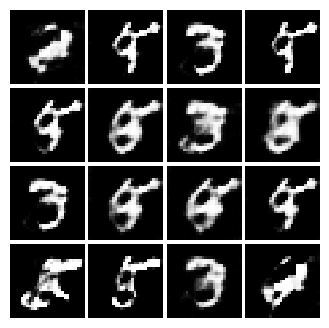

Epoch: 2, Iter: 980, D: 0.7084, G:2.342


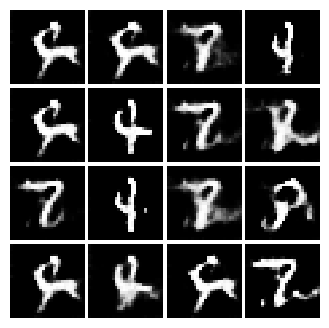

Epoch: 2, Iter: 1000, D: 0.4259, G:5.255


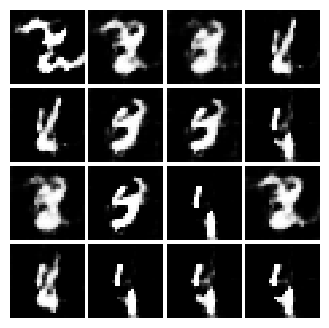

Epoch: 2, Iter: 1020, D: 0.2798, G:3.158


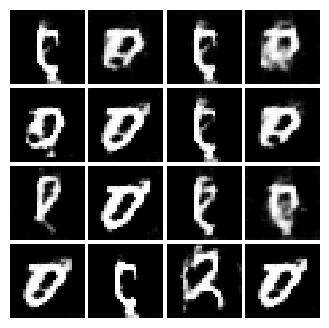

Epoch: 2, Iter: 1040, D: 0.3115, G:4.103


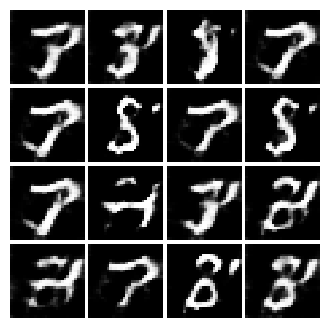

Epoch: 2, Iter: 1060, D: 0.2927, G:2.909


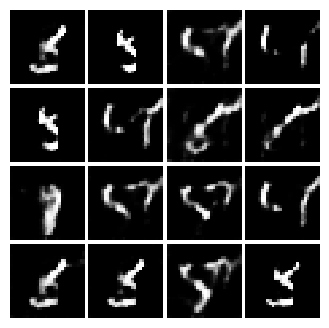

Epoch: 2, Iter: 1080, D: 0.3417, G:4.702


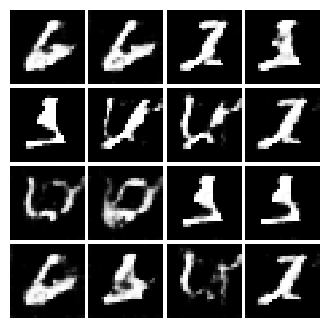

Epoch: 2, Iter: 1100, D: 0.4925, G:4.039


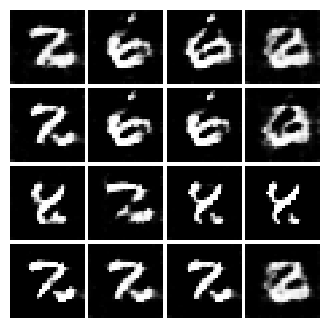

Epoch: 2, Iter: 1120, D: 0.3537, G:3.339


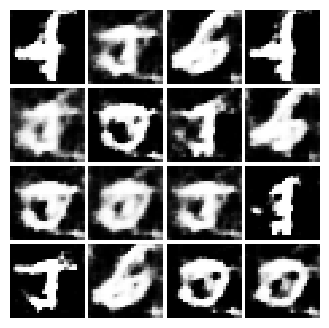

Epoch: 2, Iter: 1140, D: 0.4976, G:2.844


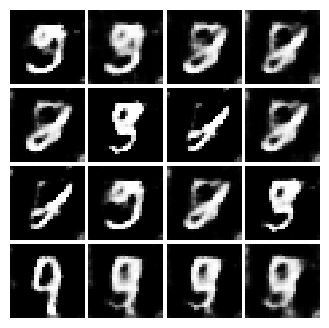

Epoch: 2, Iter: 1160, D: 0.3849, G:3.309


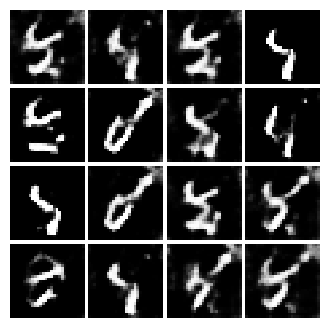

Epoch: 2, Iter: 1180, D: 0.5171, G:3.087


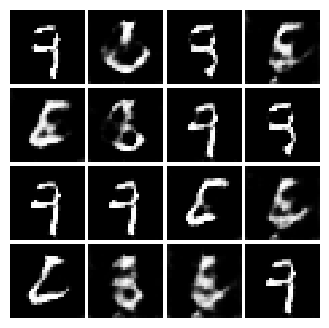

Epoch: 2, Iter: 1200, D: 0.2133, G:3.689


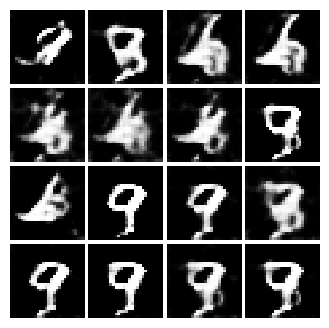

Epoch: 2, Iter: 1220, D: 0.5708, G:1.148


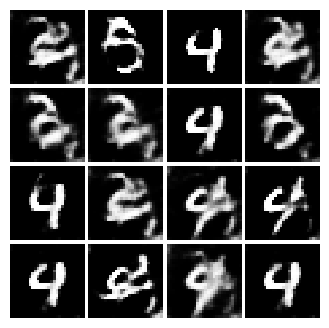

Epoch: 2, Iter: 1240, D: 0.2937, G:3.226


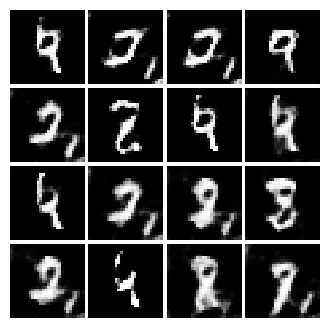

Epoch: 2, Iter: 1260, D: 0.3546, G:2.68


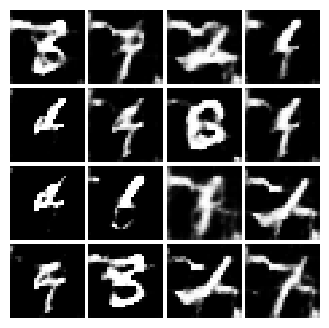

Epoch: 2, Iter: 1280, D: 0.3079, G:2.544


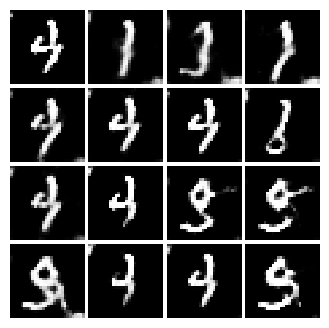

Epoch: 2, Iter: 1300, D: 0.3804, G:2.994


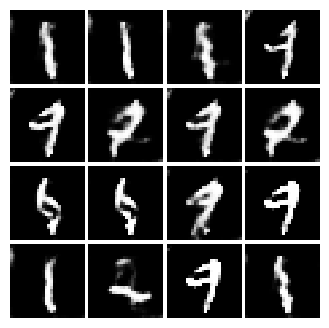

Epoch: 2, Iter: 1320, D: 0.8009, G:1.859


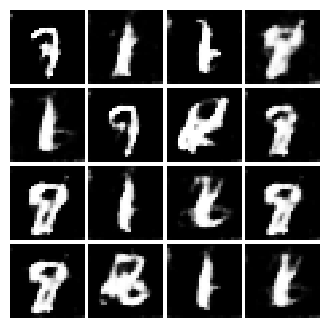

Epoch: 2, Iter: 1340, D: 0.3872, G:2.251


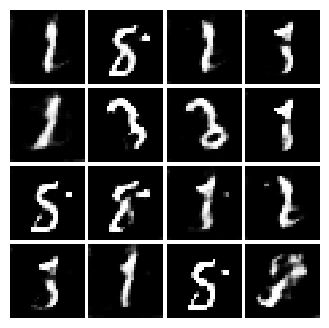

Epoch: 2, Iter: 1360, D: 0.3326, G:2.474


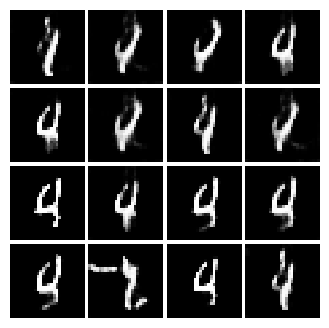

Epoch: 2, Iter: 1380, D: 0.6175, G:4.425


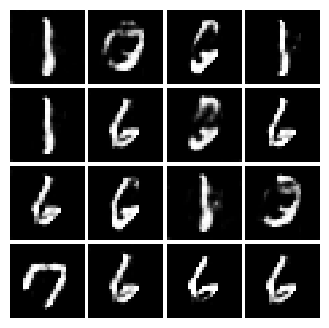

Epoch: 2, Iter: 1400, D: 1.744, G:2.806


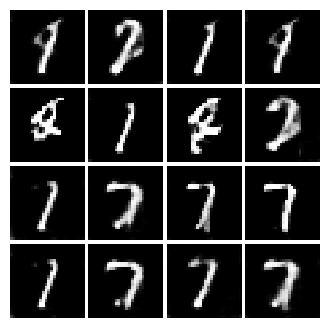

Epoch: 3, Iter: 1420, D: 0.4023, G:2.405


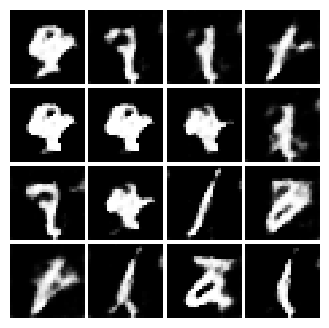

Epoch: 3, Iter: 1440, D: 0.4584, G:2.812


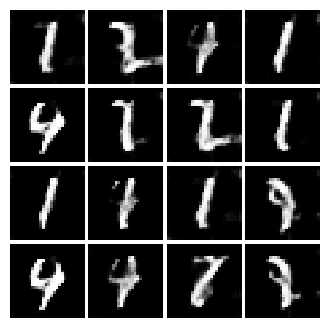

Epoch: 3, Iter: 1460, D: 0.582, G:2.077


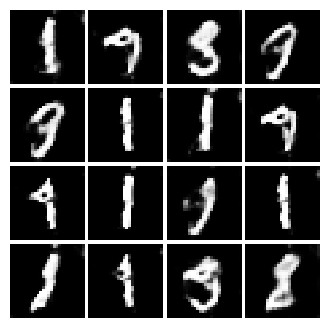

Epoch: 3, Iter: 1480, D: 0.5403, G:3.651


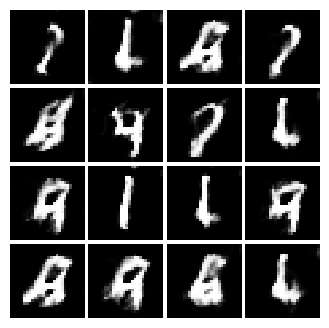

Epoch: 3, Iter: 1500, D: 0.3668, G:1.259


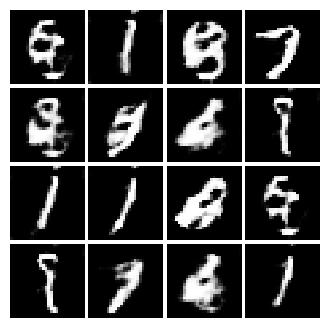

Epoch: 3, Iter: 1520, D: 0.3998, G:2.475


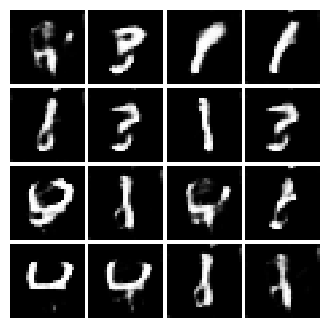

Epoch: 3, Iter: 1540, D: 0.8925, G:3.444


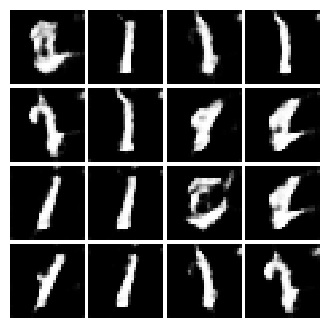

Epoch: 3, Iter: 1560, D: 0.6068, G:3.176


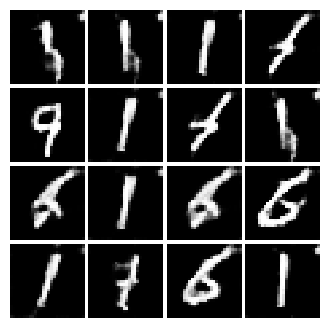

Epoch: 3, Iter: 1580, D: 0.4541, G:3.129


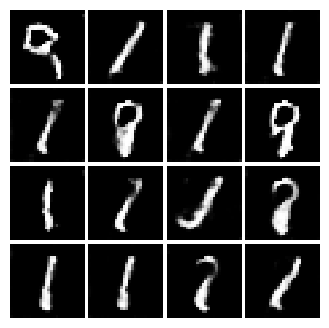

Epoch: 3, Iter: 1600, D: 0.6648, G:1.686


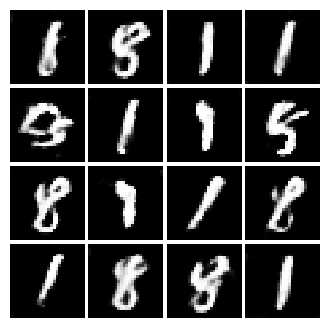

Epoch: 3, Iter: 1620, D: 0.389, G:2.985


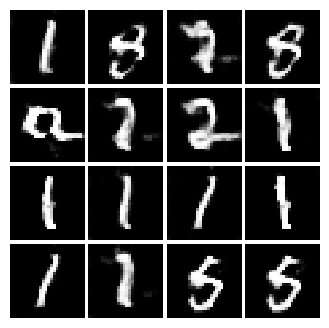

Epoch: 3, Iter: 1640, D: 0.4664, G:2.331


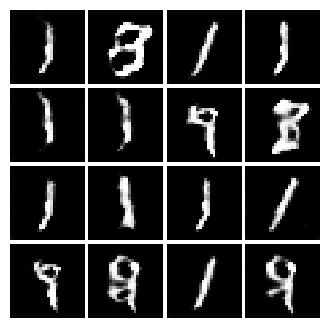

Epoch: 3, Iter: 1660, D: 0.4415, G:2.453


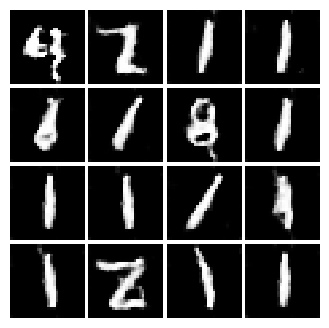

Epoch: 3, Iter: 1680, D: 0.4908, G:2.262


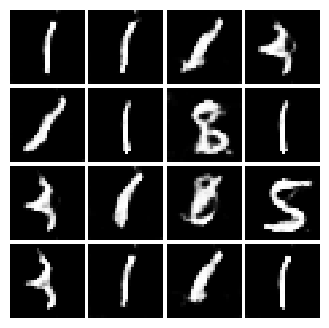

Epoch: 3, Iter: 1700, D: 0.6195, G:3.169


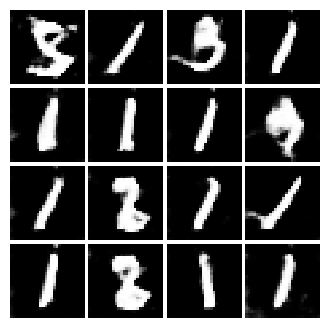

Epoch: 3, Iter: 1720, D: 0.4186, G:2.366


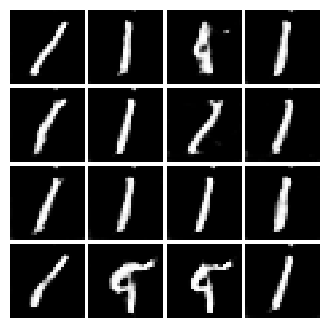

Epoch: 3, Iter: 1740, D: 0.4847, G:2.094


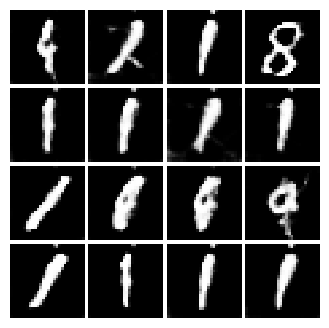

Epoch: 3, Iter: 1760, D: 0.3677, G:2.504


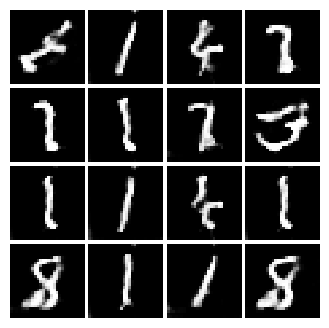

Epoch: 3, Iter: 1780, D: 0.4982, G:1.986


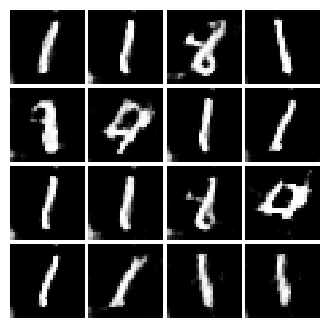

Epoch: 3, Iter: 1800, D: 0.5694, G:2.14


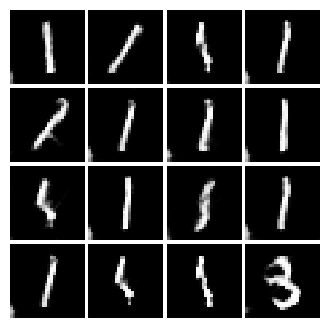

Epoch: 3, Iter: 1820, D: 0.7304, G:2.156


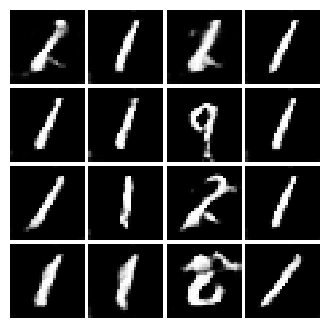

Epoch: 3, Iter: 1840, D: 0.4391, G:1.992


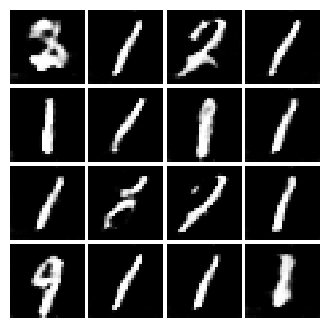

Epoch: 3, Iter: 1860, D: 0.5362, G:2.027


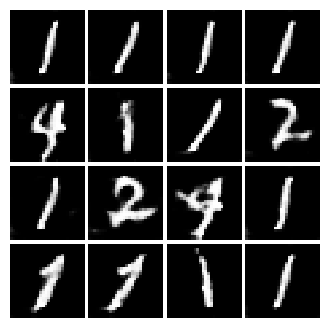

Epoch: 4, Iter: 1880, D: 0.4277, G:2.343


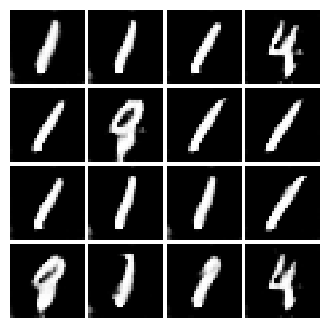

Epoch: 4, Iter: 1900, D: 0.4786, G:1.872


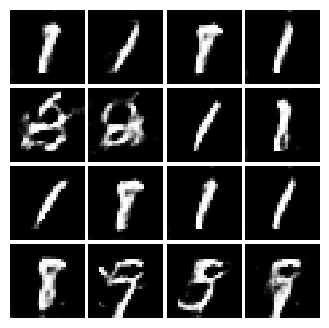

Epoch: 4, Iter: 1920, D: 0.493, G:2.258


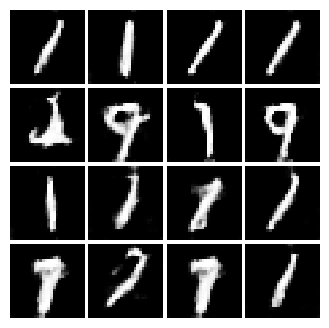

Epoch: 4, Iter: 1940, D: 0.3168, G:2.245


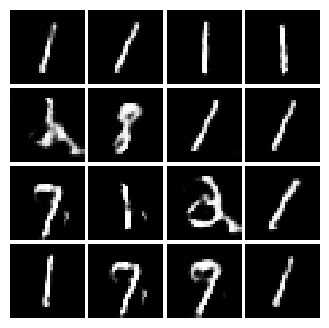

Epoch: 4, Iter: 1960, D: 0.4539, G:2.058


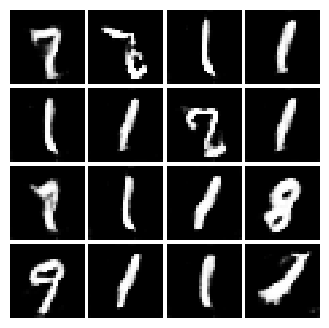

Epoch: 4, Iter: 1980, D: 0.4465, G:2.388


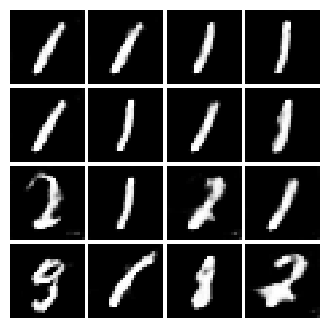

Epoch: 4, Iter: 2000, D: 0.6973, G:2.237


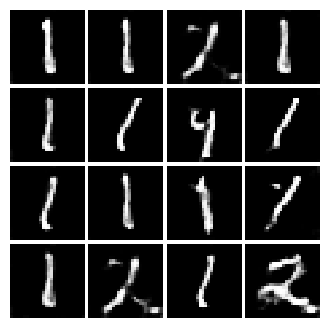

Epoch: 4, Iter: 2020, D: 0.4222, G:2.273


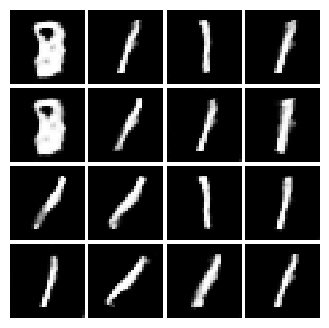

Epoch: 4, Iter: 2040, D: 0.4848, G:2.526


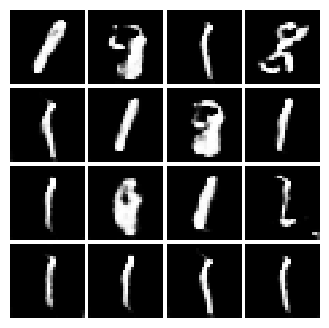

Epoch: 4, Iter: 2060, D: 0.41, G:2.697


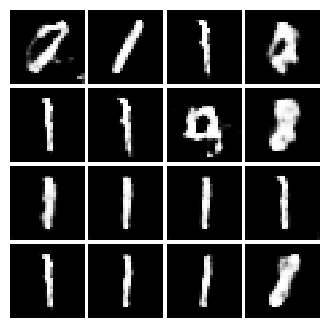

Epoch: 4, Iter: 2080, D: 0.4729, G:2.297


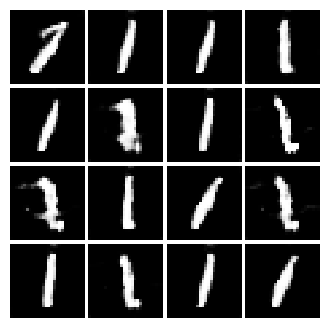

Epoch: 4, Iter: 2100, D: 0.5353, G:2.129


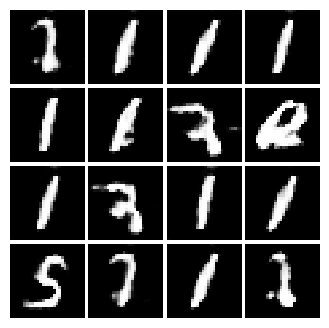

Epoch: 4, Iter: 2120, D: 0.5368, G:2.347


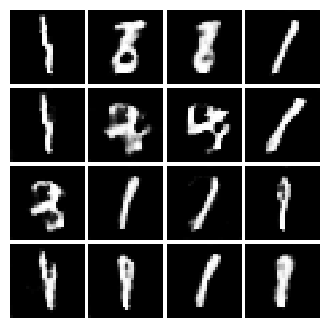

Epoch: 4, Iter: 2140, D: 0.5569, G:2.074


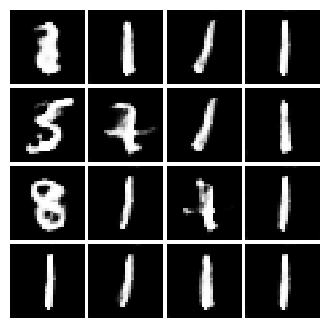

Epoch: 4, Iter: 2160, D: 0.4586, G:2.526


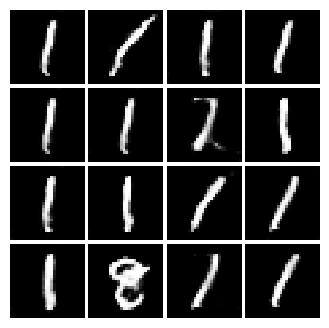

Epoch: 4, Iter: 2180, D: 0.4209, G:2.243


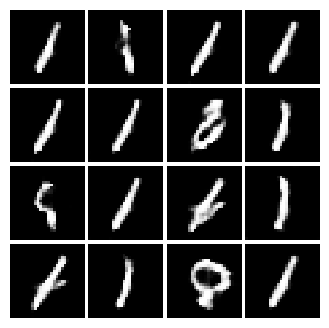

Epoch: 4, Iter: 2200, D: 0.4462, G:2.805


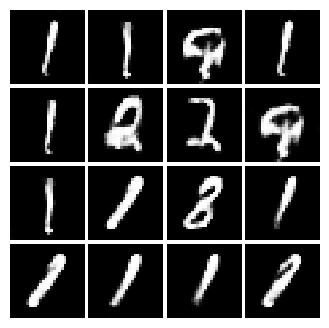

Epoch: 4, Iter: 2220, D: 0.4294, G:2.128


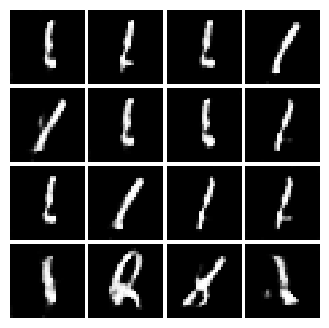

Epoch: 4, Iter: 2240, D: 0.4513, G:2.565


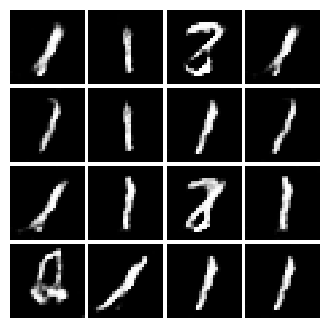

Epoch: 4, Iter: 2260, D: 0.3976, G:2.365


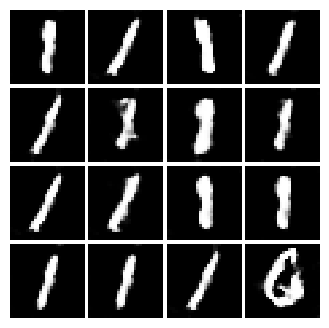

Epoch: 4, Iter: 2280, D: 0.5221, G:2.314


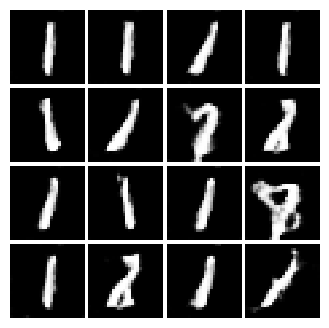

Epoch: 4, Iter: 2300, D: 0.4351, G:2.66


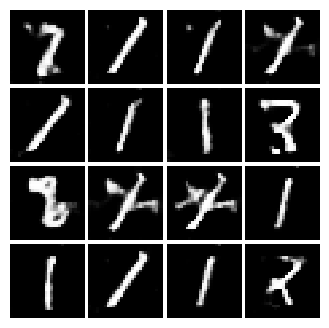

Epoch: 4, Iter: 2320, D: 0.3981, G:2.538


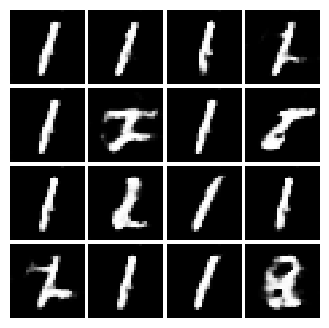

Epoch: 4, Iter: 2340, D: 0.4081, G:2.583


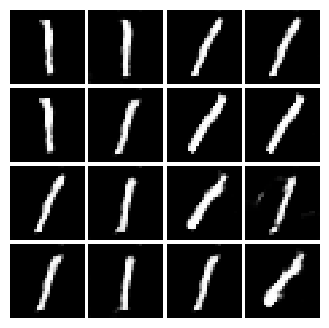

Final images


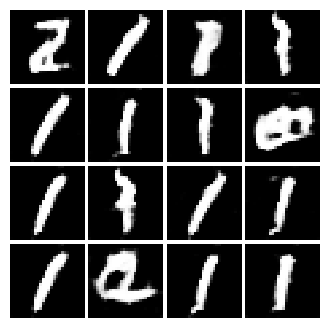

In [30]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss, num_epochs=5)

# OPTIONAL: Part III - Sequence-to-Sequence Generative Model

Research and experiment on architecture and training of a sequence-to-sequence autoencoders and generative model for task such as language translation. Below are example tutorials:

- https://keras.io/examples/nlp/lstm_seq2seq/
- https://keras.io/examples/nlp/neural_machine_translation_with_transformer/